In [24]:
import sys  
sys.path.insert(0, '../code')
sys.path.insert(0, '../data')

In [30]:
# 1. Imports and topic setup
from newsapi import NewsApiClient
from newsplease import NewsPlease
from sqlalchemy import create_engine, ForeignKey, Column, Integer, String, Text, select
from sqlalchemy.orm import declarative_base, relationship, Session
import string
import spacy
from spacy.language import Language
import re
from articles_orm import Base, Article, ArticleFeatures

from sklearn.feature_extraction.text import TfidfVectorizer
from utils import read_file_content, money_merger

newsapi = NewsApiClient(api_key='fbfb692eb3844ce59e10eea6069d1161')

topic_list = read_file_content('topics.txt')
print(topic_list)

['crypto', 'bitcoin', 'covid', 'vaccine', 'startups', 'technology', 'e-commerce', 'Nokia', 'Apple', 'Microsoft']


In [ ]:
# 2. Pull 100 initial articles of all chosen topics
# NewsAPI doesn't allow free accounts to access results after number 100.
# NewsAPI also doesn't allow free accounts to access results from before >1month ago.
all_articles = {topic: newsapi.get_everything(q=topic, page_size=100, page=1, language='en') for topic in topic_list}
print(all_articles.keys())

In [ ]:
# 3. Check totalResults num and length of downloaded content for integrity
print(*(all_articles[topic]['totalResults'] for topic in topic_list))
print(*(len(all_articles[topic]['articles']) for topic in topic_list))

In [ ]:
# 4. Save urls of every topic to their own dict, but only unique articles (previously some duplicates appeared)
topic_urls = {}
for topic in topic_list:
    cta = all_articles[topic]['articles']
    current_topic_articles = []
    current_topic_articles_titles = []
    for article in cta: 
        if article['title'] not in current_topic_articles_titles: # save only unique
            current_topic_articles += [article]
            current_topic_articles_titles += [article['title']]
    
    current_topic_urls = [article['url'] for article in current_topic_articles]
    topic_urls[topic] = current_topic_urls
print(topic_urls.keys())
print(len(topic_urls['bitcoin']))

In [26]:
# 5. Establish session to database.
engine = create_engine(f"sqlite:///NewsAPI_articles.db")

In [59]:
print(engine)

Engine(sqlite:///NewsAPI_articles.db)


In [63]:
# Create schema
Base.metadata.create_all(engine)

In [ ]:
# Establish db session, get maintext of article, save objects
with Session(engine) as session:
    objects = []
    for topic in topic_list:
        for url in topic_urls[topic]:
            try:
                article = NewsPlease.from_url(url)
            except: # some download error happened, skip this article
                continue
            if (article.maintext is not None):
                mdl_article = Article(
                    parent_topic = topic,
                    source = article.source_domain,
                    title = article.title,
                    description = article.description,
                    maintext = article.maintext,
                    publication_date = article.date_publish,
                    url = url
                )
                print(mdl_article)
                objects += [mdl_article]
        session.bulk_save_objects(objects) # bulk save all topics then flush
        session.commit()
        objects=[]

In [27]:
# Query all articles and check everything ids
with Session(engine) as session:
    articles = session.query(Article).all()
print(len(articles))
print(articles[-1].id)

962
962


In [44]:
# For every article from db, apply feature extraction methods (preprocessing -> bag of words -> pca/nmf -> save most important features as ArticleFeatures)
nlp = spacy.load('en_core_web_lg')
nlp.add_pipe("merge_entities")
nlp.add_pipe('money_merger', after='ner')
print(nlp.pipeline)

additional_remove_chars = "'\"`—“’”\n"
punctuation = string.punctuation.replace('-','')+additional_remove_chars

articles_lt = []
articles_features = []
en_stopwords = read_file_content('stopwords_en.txt')
for article in articles:
    # preprocess
    article_features = {}
    article_doc = nlp(article.maintext)
    article_doc = money_merger(article_doc)
    lemmas = [token.lemma_ for token in article_doc 
              if 
              token.lemma_ not in en_stopwords 
              and token.lemma_ not in punctuation]
    # pull out number of numericals as a feature of its own
    article_numericals = [lemma for lemma in lemmas if any(char.isdigit() for char in lemma)]
    # clean original lemmas from numericals
    lemmas = [lemma for lemma in lemmas if not any(char.isdigit() for char in lemma)]
    # pull out named entities as a feature of its own
    named_entities = {ent.label_: set([ent.text for inent in article_doc.ents if 
                                   inent.label_ == ent.label_]) for ent in article_doc.ents}
    article_features['article_id'] = article.id
    article_features['named_entities'] = named_entities
    article_features['numericals'] = article_numericals
    print(article_features)
    print(lemmas)
    article_lemmatized = ' '.join(lemmas)
    articles_lt += [article_lemmatized]

[('tok2vec', <spacy.pipeline.tok2vec.Tok2Vec object at 0x000002FB4C61C900>), ('tagger', <spacy.pipeline.tagger.Tagger object at 0x000002FB4C61FF90>), ('parser', <spacy.pipeline.dep_parser.DependencyParser object at 0x000002FB3CA36D60>), ('ner', <spacy.pipeline.ner.EntityRecognizer object at 0x000002FB3CA36700>), ('money_merger', <function money_merger at 0x000002FB397D3DC0>), ('attribute_ruler', <spacy.pipeline.attributeruler.AttributeRuler object at 0x000002FB62BD9240>), ('lemmatizer', <spacy.lang.en.lemmatizer.EnglishLemmatizer object at 0x000002FB59DAE700>), ('merge_entities', <function merge_entities at 0x000002FB3734E3A0>)]
{'article_id': 1, 'named_entities': {'ORG': {'VC'}, 'CARDINAL': {'a third and a'}, 'GPE': {'France'}, 'PERSON': {'Pierre Entremont'}, 'NORP': {'DeFi'}, 'MONEY': {'€300,000'}, 'PERCENT': {'20%'}, 'DATE': {'June 15'}, 'ORDINAL': {'fourth'}}, 'numericals': ['10', '€100,000', '7%', '€50,000', '€21,000', '€29,000', 'an additional €700,000', '20%', 'June 15', '€100,0

{'article_id': 6, 'named_entities': {'ORG': {'NFT'}, 'GPE': {'Toronto'}, 'PERSON': {'Yoann Caujolle'}, 'WORK_OF_ART': {'Summly'}, 'MONEY': {'$3 million'}, 'CARDINAL': {'three'}, 'LOC': {'Europe'}, 'NORP': {'European'}, 'DATE': {'five-plus years'}}, 'numericals': ['$50 million', '$30 million', 'between $500,000', '$3 million', '15-20', 'May 12', '2015']}
['White Star Capital', 'well', 'VC', 'firm', 'time', 'Digg', 'LaunchRock', 'Meero', 'Summly', 'Tier', 'move', 'hot', 'crypto', 'blockchain', 'Digital Asset Fund', 'special', '-', 'vehicle', 'fund', 'specialize', 'invest', 'crypto', 'network', 'blockchain', '-', 'enable', 'business', 'raise', 'backing', 'Bpifrance', 'Ubisoft', 'institution', 'fund', 'fund', 'New York', '-', 'base', 'General Partner Sep Alavi', 'support', 'Principals', 'Thomas', 'Klocanas', 'New York', 'Sanjay Zimmermann', 'Toronto', 'deploy', 'initial', 'investment', 'company', 'focus', 'North America', 'Europe', 'Alavi', 'hyperfocuse', 'space', 'expect', 'innovative', '

{'article_id': 9, 'named_entities': {'ORG': {'PayPal'}, 'DATE': {'this past month'}, 'PERSON': {'Dan Schulman'}, 'ORDINAL': {'first'}}, 'numericals': []}
['photo', 'Paypal', 'Inc.', 'spite', 'environmental', 'regulatory', 'ill', 'generally', 'crypto', 'currency', 'PayPal', '’s', 'bitcoin', 'ambition', 'ramp', 'Wednesday', 'Jose Fernandez da Ponte', 'company', '’s', 'VP', 'thing', 'blockchain', 'confirm', 'interview', 'PayPal', '-', 'er', 'withdraw', 'crypto', 'wallet', 'advertisement', 'company', 'n’t', 'confirm', 'roll', 'feature', 'n’t', 'bitcoin', 'bro', 'currently', 'PayPal', '’s', 'platform', 'company', 'bring', 'bitcoin', 'ethereum', 'litecoin', 'purchase', 'platform', 'late last year', 'generate', 'fair', 'bit', 'backlash', 'crypto', 'community', 'core', 'complaint', 'PayPal', '’s', 'offering', 'company', 'people', 'buy', 'sell', 'crypto', 'convert', 'crypto', 'dollar', 'cent', 'bitcoiner', 'n’t', 'share', 'coin', 'PayPal', '-', 'Venmo', 'bring', 'bitcoin', 'buy', 'platform', 'i

{'article_id': 12, 'named_entities': {'DATE': {'2020'}, 'ORG': {'TechCrunch'}, 'PERSON': {'Kleiner Perkins'}, 'MONEY': {'$5,000 USD'}, 'PRODUCT': {'Twitter'}, 'LAW': {'the Syndicate Protocol'}, 'PERCENT': {'2.3%'}}, 'numericals': ['she256', '$5,000 usd', '36', '2.3%', '2020']}
['decentralized', 'currency', 'recent month', '’s', 'renew', 'attention', 'dao', 'Decentralized Autonomous Organizations', 'bring', 'group', 'investor', 'deploy', 'capital', 'unit', 'vote', 'collectively', 'investment', 'spirit', 'blockchain', 'aim', 'bring', 'great', 'transparency', 'investment', 'decision', '-', 'making', 'number', 'high', '-', 'profile', 'dao', 'launch', 'recent month', 'fervor', 'crypto', 'mania', 'increase', 'Komorebi Collective', 'launch', 'today', 'organization', 'woman', 'blockchain', 'space', 'investment', 'exclusively', 'exceptional', 'female', 'nonbinary', 'crypto', 'founder', 'member', 'Manasi Vora', 'TechCrunch', 'group', 'comprise', 'number', 'core', 'team', 'member', 'assemble', 'c

{'article_id': 15, 'named_entities': {'MONEY': {'up to $100k'}, 'GPE': {'India'}, 'DATE': {'recent weeks'}, 'ORG': {'the India Crypto Relief Fund'}, 'CARDINAL': {'3,500'}, 'PERCENT': {'35%'}, 'PERSON': {'Balaji Srinivasan'}, 'LAW': {'Buterin'}, 'ORDINAL': {'second'}, 'NORP': {'South Asian'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['$1.5 billion', '$1 billion', 'covid-19', '500', 'over 50 trillion', 'around $1.14 billion', '35%', 'the age of 27 early this month', '$336 million', 'over 13,000', '350,000', '3,500', 'about $600,000', '$50', 'up to $100k', 'April 25, 2021']}
['Vitalik', 'Buterin', 'donate', 'cryptocurrencie', 'worth', '-', 'profit', 'organization', 'include', 'relief', 'fund', 'India', 'Wednesday', 'large', '-', 'individual', 'philanthropy', 'effort', 'worth', 'cryptocurrencie', 'dog', '-', 'themed', 'donation', 'Buterin', 'creator', 'Ethereum', 'transfer', 'eth', 'shib', 'Shiba', 'Inu', 'meme', 'coin', 'worth', 'time', 'transaction', 'India', 'COVID', '-', 'Crypto', 'Relie

{'article_id': 18, 'named_entities': {'DATE': {'earlier this year'}, 'ORG': {'Tesla'}, 'PERSON': {'Elon Musk'}, 'CARDINAL': {'147.79'}, 'MONEY': {'$52,795.53'}, 'PERCENT': {'less than one percent'}, 'TIME': {'the last hour'}, 'FAC': {'Coinbase'}}, 'numericals': ['7.46', '16.71', '147.79', '$1.5 billion', 'over $200', '$2,000', '$52,795.53']}
['just week', 'Tesla', 'start', 'accept', 'Bitcoin', 'currency', 'car', 'Elon Musk', 'reveal', 'tweet', 'suspend', 'effort', 'accord', 'release', 'Tesla', 'appear', 'function', 'press', 'office', 'company', 'concerned', 'rapidly', 'increase', 'fossil', 'fuel', 'bitcoin', 'mining', 'transaction', 'study', 'last year', 'estimate', 'bitcoin', 'mining', 'GW', 'electricity', 'average', 'study', 'number', 'GW', 'represent', 'TWh', 'annual', 'basis', 'Tesla', 'sell', 'Bitcoin', 'sell', 'coin', 'purchase', 'early this year', 'unclear', 'holding', 'transaction', 'mining', 'transition', 'sustainable', 'energy', 'unclear', 'Tesla', "n't", 'factor', 'account',

{'article_id': 21, 'named_entities': {'ORG': {'Drobitko'}, 'CARDINAL': {'roughly 50 million'}, 'WORK_OF_ART': {'Creator of the Week'}, 'PERSON': {'Andrey Drobitko'}, 'DATE': {'Q4 2020'}, 'PERCENT': {'about 2,100%'}, 'MONEY': {'more than $2 billion'}}, 'numericals': ['roughly 50 million', 'few than 10%', 'more than $2 billion', 'the first quarter of 2021', 'about 2,100%', 'Q4 2020']}
['update', 'exist', 'art', 'app', 'allow', 'artist', 'access', 'NFT', 'marketplace', 'directly', 'potential', 'democratize', 'access', 'NFT', 'artist', 'currently', 'crypto', 'SketchAR', 'exist', 'mobile', 'app', 'allow', 'artist', 'turn', 'photo', 'illustration', 'ai', '-', 'base', 'computer', 'vision', 'launch', 'feature', 'allow', 'user', 'turn', 'art', 'nft', 'directly', 'inside', 'app', 'sell', 'content', 'produce', 'app', 'include', 'public', 'community', 'feed', 'digital', 'learning', 'course', 'app', 'boast', 'almost a million', 'user', 'start', 'select', 'single', 'creator of the Week', 'community'

{'article_id': 27, 'named_entities': {'GPE': {'India'}, 'ORG': {'ShibaSwap'}, 'TIME': {'the next morning'}, 'DATE': {'last weekend'}, 'CARDINAL': {'nearly two-thirds'}, 'PERSON': {'Paul R. La Monica'}, 'MONEY': {'$2.3 trillion'}, 'PERCENT': {'nearly 20%'}, 'NORP': {'Shiba'}, 'PRODUCT': {'Twitter'}, 'WORK_OF_ART': {'Saturday Night Live'}, 'ORDINAL': {'first'}}, 'numericals': ['April 17', '38', '42', '2021', 'nearly 70%', 'more than 11,000%', '$200', '$100', 'about 300%', '$100', 'nearly $8,000', 'Covid-19', '30-40', 'up to $100,000', 'up to $700,000', '$7,900', 'nearly $9 million', 'more than 11,000%', 'the past 30 day', '$1 billion', 'Covid-19', '1', '$2.3 trillion', '12%', 'nearly 20%']}
['New York', 'CNN', 'the morning', 'brother', 'Westchester', 'New York', 'wake', 'learn', 'millionaire', 'overnight', 'wager', 'cryptocurrency', 'originally', 'create', 'joke', 'Tommy', 'James', 'CNN', 'publish', 'protect', 'anonymity', 'a few hundred buck', 'odd', 'digital', 'asset', 'call', 'shiba',

{'article_id': 30, 'named_entities': {'GPE': {'U.S.'}, 'TIME': {'minutes'}, 'DATE': {'10-year'}, 'ORG': {'Mirae Asset Securities'}, 'NORP': {'Korean'}, 'CARDINAL': {'1.5'}, 'PERCENT': {'2.133%'}, 'PERSON': {'Subhranshu Sahu'}, 'MONEY': {'$575.11 million'}}, 'numericals': ['May 20', '10.77', '0.34%', '3,162.28', '1.23%', '0.13%', '1.24%', '2.50%', '0.43%', '651.0 billion', '$575.11 million', '1,132.0', '0.13%', '1,130.5', '1,131.9', '0.1%', '1,131.5', '0.01', '111.03', '3-year', '0.1', '1.101%', '10-year', '1.5', '2.133%', '$1', '1,131.9500']}
['kospi', 'fall', 'foreigner', 'net', 'seller', 'korean', 'win', 'weaken', 'U.S.', 'dollar', 'South Korea', 'benchmark', 'bond', 'yield', 'rise', 'midday', 'report', 'click', 'SEOUL', 'Reuters', '-', 'round', '-', 'south korean', 'financial', 'market', 'south korean', 'share', 'slip', 'Thursday', 'track', 'overnight', 'Wall', 'Street', 'loss', 'the U.S. Federal Reserve', 'release', 'minute', 'April', 'meeting', 'crash', 'cryptocurrencie', 'weigh',

{'article_id': 35, 'named_entities': {'GPE': {'U.S.'}, 'DATE': {'five-year'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'TIME': {'expect minutes'}, 'PERSON': {'Brent'}, 'CARDINAL': {'600'}, 'PERCENT': {'0.92%'}, 'NORP': {'British'}, 'MONEY': {'$1,884.90'}, 'LOC': {'Asia'}}, 'numericals': ['May 26, 2020', '437.24', '1.28%', '33,623.42', '500', '45.5', '1.10%', '4,082.33', '107.25', '0.81%', '13,196.39', '600', '1.52%', '.miwd00000pus', '1.05%', '1.5%', '0.6%', '1.6%', '28%', '$2,444', '0.091%', '0.05%', '$1.2214', '10-year', '2.0', '1.6216%', '2.675%', 'more than $2', 'more than $2', '0.92%', '$1,884.90']}
['representation', 'virtual', 'currency', 'Bitcoin', 'place', 'U.S.', 'Dollar', 'banknote', 'illustration', 'REUTERS', 'Dado Ruvic\nstock', 'fall', 'globally', 'Wednesday', 'ahead', 'minute', 'the U.S. Federal Reserve', 'cryptocurrencie', 'plunge', 'regulatory', 'move', 'China', 'bitcoin', 'dropping', 'low', 'level', 'January', 'equity', 'investor', 'worry', 'rise', 'inflationa

{'article_id': 37, 'named_entities': {'DATE': {'early 2021'}, 'ORG': {'Android'}, 'ORDINAL': {'first'}, 'FAC': {'the Samsung Blockchain Wallet'}, 'PRODUCT': {'Playstation'}, 'PERSON': {'Eddie Han'}, 'PERCENT': {'90 to 95%'}, 'WORK_OF_ART': {'The Exodus 1 and Exodus 1S'}, 'CARDINAL': {'5'}, 'GPE': {'Taipei'}}, 'numericals': ['May 13', '2019', 'Exodus 1', 'the Exodus 1', '2021', '90 to 95%', 'exodus 1', '1', 'the Exodus 1 and Exodus 1S', '23 year', '2020', '5', 'early 2021', '21', '5g.']}
['industry', 'adopt', 'cryptocurrency', 'legitimate', 'payment', 'service', 'mainstream', 'smartphone', 'company', 'incorporate', 'technology', 'easy', 'user', 'hold', 'trade', 'crypto', 'expert', 'Samsung', 'blockchain', 'user', 'manage', 'trade', 'virtual', 'asset', 'third', '-', 'party', 'wallet', 'Samsung Galaxy', 'smartphone', 'Samsung', 'user', 'hold', 'crypto', 'select', 'cold', 'hardware', 'wallet', 'Ledger', 'Nano', 'S', 'Ledger Nano X', 'import', 'the Samsung Blockchain Wallet', 'software', 'm

{'article_id': 41, 'named_entities': {'DATE': {'late last year'}, 'MONEY': {'around $2,600'}, 'PERCENT': {'40 percent'}, 'GPE': {'China'}, 'NORP': {'Chinese'}, 'ORG': {'Bitcoin and Ethereum'}, 'CARDINAL': {'90'}, 'PERSON': {'Elon Musk'}, 'ORDINAL': {'First'}}, 'numericals': ['June 8, 2021 5 min', '$30,000', '30 percent', '2013', '2013', '2016', 'September of 2017', 'January of 2018', '65 percent', 'about 85', '90', '2019', '2017', '17 percent', '$50,000', '$30,000', 'up to $38,000', '40 percent', '$3,400', '$2,000', 'around $2,600', '40']}
['read', 'opinion', 'express', 'entrepreneur', 'contributor', 'late May', "'s", 'financial', '-', 'industry', 'regulator', 'place', 'extreme', 'limitation', 'cryptocurrency', 'country', 'follow', 'announcement', 'Bitcoin', 'fall', 'announcement', 'China', 'major', 'player', 'global', 'economy', 'restriction', 'crypto', 'send', 'ripple', 'China', '’s', 'tumultuous', 'history', 'crypto', 'chinese', 'regulator', 'ban', 'payment', 'company', 'financial',

{'article_id': 44, 'named_entities': {'DATE': {'Monday'}, 'ORG': {'Rick & Morty'}, 'CARDINAL': {'two'}, 'PERSON': {'Fox'}, 'GPE': {'Hollywood'}, 'ORDINAL': {'first'}}, 'numericals': []}
['upfront', 'presentation', 'Monday', 'Fox', 'advertiser', 'animated', 'series', 'lean', 'buzzword', 'definitely', 'hear', "n't", 'blockchain', 'NFT', 'krapopoli', 'Community', 'Rick & Morty', 'creator', 'Dan Harmon', 'animate', 'comedy', 'set', 'mythical', 'ancient', 'Greece', 'follow', 'god', 'human', 'monster', 'coexist', 'crypto', '-', 'buzz', 'Fox', 'launch', 'NFT', 'company', 'Blockchain Creative Labs', 'create', 'sell', 'manage', 'nft', 'token', 'digital', 'good', 'Krapopolis', 'curate', 'entirely', 'blockchain', 'exactly', 'well', 'represent', 'cash', "'s", 'popularity', 'assume', 'follow', 'path', 'Rick & Morty', 'send', 'fan', 'chase', 'collectible', 'tie', '-', 'advertising', 'Hollywood', 'Reporter', 'quote', 'Fox', 'CEO', 'Charlie Collier', 'advertiser', '’re', 'animation', 'help', 'brand', 

{'article_id': 48, 'named_entities': {'PERSON': {'Gary Gensler'}, 'GPE': {'US'}, 'DATE': {'last week'}, 'CARDINAL': {'10'}, 'ORG': {'Gensler'}, 'NORP': {'Congressional'}}, 'numericals': ['10']}
['Ray Dalio', 'successful', 'hedge', 'fund', 'boss', 'time', 'Thomas Peter', 'Reuters', 'Ray', 'Dalio', 'cryptocurrencie', 'victim', 'success', 'invite', 'regulation', 'billionaire', 'hedge', 'fund', 'boss', "'s", 'comment', 'follow', 'tough', 'word', 'regulator', 'UK', 'US', 'Dalio', 'government', 'tough', 'crypto', 'threaten', 'control', 'money', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', 'billionaire', 'hedge', 'fund', 'boss', 'Ray Dalio', 'big', 'risk', 'cryptocurrencie', 'success', 'government', 'crack', 'ensure', 'control', 'money', 'supply', 'talk', 'cryptocurrencie', 'Dalio', 'the Wall Street Journal "future of Everything Festival', 'Tuesday', 'big', 'risk', 'success', 'storehold', 'wealth', 'government', 'alternative', 'currency', 'comment', 'Dalio', 'founder', '-', 'chi

{'article_id': 53, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'April'}, 'CARDINAL': {'1/4'}, 'PERSON': {'Michael Bouhanna'}, 'ORDINAL': {'first'}, 'MONEY': {'$69.3 million'}, 'LOC': {'the Cryptopunk #7523'}, 'NORP': {'Pak'}, 'GPE': {'London'}}, 'numericals': ['June 3-10', '27', 'May 2014', '7523', '10,000', '2017', 'more than $7 million', '$100', '1/4', 'the Cryptopunk #7523', '2017', 'May 31, 2021', '$16.8 million', '$69.3 million']}
['auction', 'house', "Sotheby's", 'hope', 'appeal', 'traditional', 'art', 'collector', 'crypto', 'enthusiast', 'sale', 'digital', 'art', 'form', '-', 'fungible', 'token', 'NFTs', 'online', 'auction', 'late', 'step', 'major', 'auction', 'house', 'embrace', 'nft', '-', 'form', 'blockchain', '-', 'base', 'asset', 'certify', 'ownership', 'digital', 'object', 'read', 'natively', 'Digital', 'curated', 'NFT', 'Sale', 'feature', 'work', 'digital', 'artist', 'include', 'Quantum', 'Kevin McCoy', 'simple', 'geometric', 'animation', 

{'article_id': 55, 'named_entities': {'ORG': {'the Internal Revenue Service'}, 'GPE': {'US'}, 'DATE': {'earlier this week'}, 'CARDINAL': {'around 400,000'}, 'NORP': {'Australian'}, 'PERSON': {'Biden'}}, 'numericals': ['10', 'around 400,000', '2021']}
['Thana Prasongsin/Getty Images', 'the Australian Tax Office', 'urge', 'investor', 'report', 'return', 'cryptocurrency', 'news.com.au', 'report', 'Crypto', 'class', 'taxable', 'asset', 'Australia', 'investor', 'unaware', 'despite', 'anonymity', 'key', 'component', 'crypto', 'investment', 'track', 'authority', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', 'australian', 'crypto', 'investor', 'report', 'profit', 'the Australian Tax Office', 'risk', 'penalty', 'tax', 'evasion', 'assistant', 'commissioner', 'Tim Loh', 'news.com.au', 'Crypto', 'class', 'ATO', 'asset', 'currency', 'taxable', '-', 'investor', 'unaware', 'ATO', 'contact', 'people', 'review', 'previous', 'statement', 'cryptocurrency', 'investment', 'divulge', 'profit', 

{'article_id': 58, 'named_entities': {'DATE': {'2021'}, 'PERCENT': {'45 percent'}, 'ORDINAL': {'first'}, 'CARDINAL': {'one'}, 'GPE': {'Singapore'}, 'ORG': {'TodayonChain'}, 'PERSON': {'Anti Miner'}}, 'numericals': ['June 2, 2021 5 min', '2018', '450 percent', '45 percent', '2019', '2021', '200', '4change']}
['read', 'opinion', 'express', 'entrepreneur', 'contributor', 'change', 'finance', 'exciting', 'positive', 'bring', 'form', 'scamme', 'crypto', 'introduce', 'problem', 'cryptojacking', 'scam', 'cryptojacking', 'prey', 'uninformed', 'knowledgeable', 'folk', 'fall', 'prey', 'scheme', 'cryptojacking', 'attack', 'increase', 'ransomware', 'drop', 'cryptojacking', 'number', 'drop', 'crypto', 'market', 'fall', 'evidence', '’ll', 'record', 'high', 'cryptojacking', 'relate', 'small', 'business', 'deal', 'Emerging', 'Cybersecurity', 'Threats', 'cryptojacke', 'cryptojacking', 'occur', 'hacker', '’s', 'computer', 'consent', 'mine', 'cryptocurrency', 'install', 'code', 'victim', '’s', 'computer'

{'article_id': 60, 'named_entities': {'DATE': {'2021'}, 'ORG': {'Standard Protocol'}, 'ORDINAL': {'First'}, 'PERSON': {'Mark Cuban'}, 'MONEY': {'$1'}, 'CARDINAL': {'one'}, 'GPE': {'1BTC'}, 'TIME': {'every 24 hours'}}, 'numericals': ['May 25, 2021 6', '500', 'Covid-19', '$1 trillion', 'the beginning of 2020', '$2 trillion', '4', '1btc', 'March 2020', 'around $4,000', 'around $50,000', '2021', '1:1', 'every 24 hour', '$1', '$1']}
['min', 'read', 'opinion', 'express', 'entrepreneur', 'contributor', 'invest', 'crypto', 'piece', 'successful', 'strategy', 'cryptocurrencie', 'peg', 'dollar', '’s', 'create', 'legally', 'compliant', 'decentralized', 'fair', 'stablecoin', 'complex', 'millennial', 'invest', 'Nasdaq', 'Dow Jones', 'S&P', 'hit', '-', 'time', 'high', 'this month', 'n’t', '’re', 'live', 'pandemic', 'recession', 'economic', 'crisis', 'government', 'print', 'money', 'save', 'struggle', 'sector', 'face', 'fall', 'dollar', 'investing', 'nice', 'bonus', 'preserve', 'wealth', 'the Federal 

{'article_id': 62, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'China'}, 'DATE': {'Wednesday'}, 'PERSON': {'Bill Northey'}, 'TIME': {'morning'}, 'CARDINAL': {'3.90'}, 'PERCENT': {'0.03%'}, 'PRODUCT': {'Riot Blockchain'}}, 'numericals': ['March 19, 2021', '2022', '163.11', '0.48%', '33,897.55', '500', '11.87', '0.29%', '4,115.96', '3.90', '0.03%', '13,299.74']}
['People', 'Wall', 'Street', 'the New York Stock Exchange', 'NYSE', 'New York City', 'U.S.', 'REUTERS', 'Brendan McDermid/File Photo\nWall Street’s', 'main', 'close', 'lower', 'Wednesday', 'minute', 'April', 'Federal Reserve', 'meeting', 'participant', 'agree', 'U.S.', 'economy', 'remain', 'central', 'bank', '’s', 'goal', 'eye', 'future', 'discussion', 'taper', 'bond', 'buying', 'program', 'continue', 'view', 'perspective', 'participant', 'well', 'Fed', 'staff', 'inflationary', 'pressure', 'evident', 'remain', 'transitory', 'view', 'recede', 'transition', 'Bill Northey', 'senior', 'investment', 'di

{'article_id': 66, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'2021-22'}, 'GPE': {'China'}, 'CARDINAL': {'Dozens'}, 'MONEY': {'7.7637 Hong Kong dollars'}, 'LOC': {'Asia'}}, 'numericals': ['May 20, 2021', 'hk$8', '$1.03 million', '$1 trillion', '2021-22', '$1', '7.7637 Hong Kong dollar']}
['representation', 'virtual', 'currency', 'Bitcoin', 'Ethereum', 'stand', 'motherboard', 'picture', 'illustration', 'REUTERS', 'Dado Ruvic/illustration', 'Cryptocurrency', 'exchange', 'operate', 'Hong Kong', 'licence', 'city', "'s", 'market', 'regulator', 'allow', 'provide', 'service', 'professional', 'investor', 'accord', 'government', 'proposal', 'publish', 'Friday', 'government', 'financial', 'regulator', 'assess', 'regulate', 'cryptocurrency', 'industry', 'investor', 'protection', 'prevent', 'money', 'laundering', 'concern', 'cryptocurrencie', 'bitcoin', 'ether', 'roller', '-', 'coaster', 'ride', 'this week', 'raise', 'question', 'potential', 'mainstream', 'investm

{'article_id': 69, 'named_entities': {'PERSON': {'Zuppinger'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'Chicago'}, 'DATE': {'the next few days'}, 'MONEY': {'$15,637,693'}, 'PERCENT': {'50%'}, 'ORDINAL': {'third'}, 'WORK_OF_ART': {'Pranksy'}, 'CARDINAL': {'4,113'}}, 'numericals': ['March 16, 2021', '2020', 'as much as $1 trillion', '30%-40%', 'more than $10 million', 'more than 100,000', '50%', '$93.6 million', 'almost $150 million', '$1.1 million', '$2 million', '$19,687,241', '$15,637,693', '2,462', '4,113']}
['humanoid', 'robot', 'Sophia', 'develop', 'Hanson Robotics', 'plastic', 'plate', 'paint', 'demonstration', 'auction', '-', 'fungible', 'token', 'NFT', 'artwork', 'Hong Kong', 'China', 'REUTERS', 'Tyrone Siu/File Photo', 'week', "'s", 'cryptocurrency', 'price', 'plunge', 'erode', 'dollar', '-', 'base', 'nft', 'raise', 'cost', 'buy', 'sell', 'setback', 'burgeon', 'digital', 'asset', 'market', 'NFT', 'collector', 'bail', '-', 'fungible', 'token', '-', 'trade', 'dig

{'article_id': 72, 'named_entities': {'GPE': {'Florida'}, 'DATE': {'Monday'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Raphael Bostic'}}, 'numericals': ['January 8, 2021']}
['representation', 'virtual', 'currency', 'Bitcoin', 'U.S.', 'Dollar', 'banknote', 'front', 'stock', 'graph', 'illustration', 'REUTERS', 'Dado Ruvic/File Photo', 'rapid', 'development', 'cryptocurrency', 'digital', 'finance', 'generally', 'area', 'ignore', 'Atlanta Federal Reserve', 'President', 'Raphael Bostic', 'Monday', 'point', 'volatility', 'technology', 'bitcoin', 'shortcoming', 'substitute', 'traditional', 'currency', 'dollar', 'move', 'fast', 'crypto', 'space', 'characterize', '–', 'extremely', 'volatile', 'market', 'I', 'n’t', 'characteristic', 'conducive', 'currency', 'stablecoin', 'close', 'Bostic', 'online', 'discussion', 'Florida', '-', 'base', 'real', 'estate', 'institute', 'Standards', 'the Thomson Reuters Trust Principles']
{'article_id': 73, 'named_entities': {'DATE': {'annual'},

{'article_id': 77, 'named_entities': {'ORG': {'CamSoda'}, 'DATE': {'early April'}, 'MONEY': {'$83,404'}, 'CARDINAL': {'644'}, 'GPE': {'London'}, 'ORDINAL': {'first'}, 'PERSON': {'Hall'}, 'PRODUCT': {'Genesis Punks'}}, 'numericals': ['7060', '7060', '$1', '7060', '$200,000', 'mrpussyfucker23', 'more than $1', '2017', '10,000', '24x24', '8', '9,000', '1,000', '6,039', '3,840', 'the 1970', '696', '303', '286', '3d', '44', '8348', '7060', '3d', '286', '3d', '414', '644', '7060', '$83,404']}
['CamSoda', 'model', 'host', 'site', '’s', 'auction', 'CryptoPunk', 'NFT', 'screen', 'photo', 'CamSoda', 'porn', 'site', 'craze', 'nft', 'early this week', 'CamSoda', 'hold', 'online', 'auction', 'rare', 'CryptoPunk', 'NFT', 'course', '’re', 'talk', 'porn', 'site', 'surprise', 'winner', '’s', 'username', 'nsfw', 'advertisement', 'participate', 'auction', 'website', 'individual', 'deposit', 'cryptocurrency', 'CamSoda', 'account', 'press', 'release', 'CamSoda', 'CryptoPunk', 'NFT', 'commonly', '-', 'fungi

{'article_id': 80, 'named_entities': {'DATE': {'the end of the day'}, 'ORG': {'Youtube'}, 'MONEY': {'$40'}, 'PERSON': {'Elon Musk'}, 'CARDINAL': {'Two'}, 'ORDINAL': {'first'}}, 'numericals': ['June 3, 2021 4', '33-year-old', '$180,000', 'about $.04', '$1,081,441.29', 'January 2021', '4,000', '200 to 300', '10', '200 to 300', '10', 'at least $30,000', '4', '$40']}
['min', 'read', 'opinion', 'express', 'entrepreneur', 'contributor', 'story', 'crop', 'people', 'hop', 'crypto', 'trend', 'early', 'rich', 'live', 'life', 'millionaire', 'story', 'compelling', 'people', 'average', 'folk', 'easy', 'imagine', 'shoe', 'example', 'Glauber Contessoto', 'invest', 'life', 'saving', 'Dogecoin', 'Elon Musk', 'tweet', 'cryptocurrency', '’d', 'watch', 'coin', 'time', 'notice', 'online', 'support', 'coin', 'receive', 'time', 'Dogecoin', 'worth', 'just under three month', 'investment', 'worth', 'coin', 'invest', 'shitcoin', 'shitcoin', 'shitcoin', 'term', 'cryptocurrency', 'useless', 'crypto', 'create', 'c

{'article_id': 84, 'named_entities': {'PERSON': {'Peters'}, 'DATE': {'this year'}, 'CARDINAL': {'one'}, 'ORG': {'eToro'}, 'GPE': {'UK'}, 'NORP': {'Americans'}, 'PERCENT': {'1,000%'}, 'WORK_OF_ART': {'Lewis told Insider'}, 'ORDINAL': {'first'}, 'MONEY': {'around $64,000'}, 'TIME': {'24 hours'}}, 'numericals': ['10', '5', '1', 'almost 20 million', '40', 'the next 12 month', '67%', '75%', 'between 1980 and 1994', 'another 20%', '20', '30', '40 year', '78%', 'around $64,000', '12,000%', 'almost 1,000%', '1,000%', '24 hour']}
['close', '-', 'photo', 'woman', 'buy', 'cryptocurrency', 'smart', 'phone', 'app', 'growth', 'graph', 'Getty Images', 'vb', 'Research', 'millennial', 'drive', 'year', "'s", 'ongoing', 'crypto', '-', 'mania', 'millennial', 'crypto', 'long', '-', 'term', 'investment', 'opportunity', 'require', 'effort', 'crypto', 'break', 'traditional', 'structure', 'investment', 'approach', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', 'cryptocurrencie', 'rage', 'Tesla', 'b

{'article_id': 87, 'named_entities': {'PRODUCT': {'Dash, Ethereum, Ripple and Litecoin'}, 'DATE': {'April'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Novogratz'}, 'MONEY': {'almost $65,000'}, 'CARDINAL': {'around half'}}, 'numericals': ['June 2, 2021', 'almost $65,000']}
['representation', 'cryptocurrencie', 'include', 'Bitcoin', 'Dash, Ethereum, Ripple and Litecoin', 'illustration', 'picture', 'REUTERS', 'Florence Lo/Illustration', 'More', 'regulation', 'cryptocurrency', 'space', 'help', 'institutional', 'investor', 'comfortable', 'digital', 'asset', 'burgeon', 'asset', 'class', 'Mike Novogratz', 'founder', 'crypto', 'investment', 'firm', 'Galaxy Digital', 'Wednesday', 'regulation', 'conference', 'hold', 'Piper Sandler', 'unpopular', 'opinion', 'crypto', 'circle', 'institution', 'join', 'revolution', 'regulation', 'Bitcoin', 'large', 'cryptocurrency', 'surge', 'April', 'lose', 'around half', 'U.S. Securities and Exchange Commission', 'Chair', 'Gary Gensler', 'teach

{'article_id': 91, 'named_entities': {'GPE': {'Upbit'}, 'ORG': {'Upbit'}, 'PERCENT': {'20%'}, 'DATE': {'Saturday'}, 'CARDINAL': {'four'}, 'PERSON': {'CoinMarketCap'}, 'NORP': {'South Korean'}, 'MONEY': {'$9.9 trillion'}}, 'numericals': ['20%', 'May 2023', '20%', 'May 2023', 'about 60', 'more than 200', '$9.9 trillion']}
['screen', 'price', 'bitcoin', 'digital', 'currency', 'Bithumb', 'Seoul', 'South Korea', 'AP Photo/Ahn Young-joon', 'South Korea', 'start', 'tax', 'capital', 'gain', 'crypto', 'transaction', 'next year', 'accord', 'Yonhap News Agency', 'gain', 'report', 'people', 'file', 'general', 'income', 'taxis', 'country', 'continue', 'program', 'monitor', 'crack', 'illegal', 'activity', 'crypto', 'market', 'September', 'story', 'Insider', "'s", 'business', 'South Korea', 'move', 'forward', 'plan', 'impose', 'income', 'tax', 'capital', 'gain', 'cryptocurrency', 'transaction', 'accord', 'report', 'Friday', 'gain', 'crypto', 'transaction', 'start', 'next year', 'classify', 'miscellan

{'article_id': 94, 'named_entities': {'MONEY': {'around $500'}, 'GPE': {'Antonio Citterio'}, 'DATE': {'Weeks later'}, 'ORDINAL': {'ninth'}, 'CARDINAL': {'four'}, 'ORG': {'Fasciano'}, 'QUANTITY': {'more than 5,000 square feet'}, 'NORP': {'Propy'}}, 'numericals': ['$22.5 million', '16', '$22.5 million', '$22.5 million', 'M18 Public Relations', '5,067-square-foot', '12', '2,960-square-foot', 'more than 5,000 square foot', 'M18 Public Relations', '$22.5 million', 'M18 Public Relations', 'around $500']}
['anonymous', 'buyer', 'purchase', 'Miami Beach', 'penthouse', 'cryptocurrency', 'expensive', 'cryptocurrency', '-', 'base', 'real', 'estate', 'purchase', 'practice', 'purchase', 'real', 'estate', 'crypto', 'mainstream', 'the last several year', 'story', 'Insider', "'s", 'business', 'exclusive', 'penthouse', 'address', 'Surfside', 'neighborhood', 'Miami Beach', 'set', 'record', 'big', '-', 'cryptocurrency', 'real', 'estate', 'transaction', 'mid-May', 'Arte', 'Surfside', 'Antonio Citterio', '

{'article_id': 98, 'named_entities': {'DATE': {'any given day'}, 'ORG': {'Musk'}, 'PERSON': {'Elon Musk'}, 'GPE': {'El Salvador'}, 'ORDINAL': {'second'}, 'WORK_OF_ART': {'The #BitcoinLaw'}, 'CARDINAL': {'one'}, 'PERCENT': {'roughly 70%'}, 'NORP': {'American'}, 'TIME': {'any given hour'}, 'MONEY': {'$34,33 5'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['39-year-old', 'Feb. 17, 2021 photo', '39-year-old', '62', '84', '4.3%', 'the past 24 hour', 'roughly 70%', '$31,453', '$34,33 5', '180']}
['president', 'El Salvador Nayib Bukele', 'file', 'photo', 'Salvador Melendez', 'AP', 'El Salvador', 'country', 'recognize', 'cryptocurrency', 'bitcoin', 'legal', 'currency', 'accord', 'President', 'Nayib', 'Bukele', 'tweet', 'Wednesday', 'citizen', 'pay', 'taxis', 'bitcoin', 'importantly', 'bitcoin', 'diehard', 'bitcoin', 'wo', 'n’t', 'subject', 'capital', 'gain', 'taxis', 'El Salvador', 'advertisement', 'the #bitcoinlaw', 'approve', 'supermajority', 'the Salvadoran Congress', 'president', 'Bukele', 'tw

{'article_id': 101, 'named_entities': {'PERSON': {'Max'}, 'CARDINAL': {'two'}, 'ORG': {'Rolling Stone'}, 'DATE': {'2019'}, 'ORDINAL': {'26th'}, 'WORK_OF_ART': {'Twitter'}}, 'numericals': ['May 10, 2021', '26th', 'pic.twitter.com/7oluu2psd4', 'May 11', '2021', '2019']}
['Mark Zuckerberg', 'post', 'picture', 'frankly', 'adorable', 'goat', 'note', 'Max', 'Bitcoin', 'I', "n't", 'eat', 'post', 'question', 'cute', 'goat', 'cute', 'nice', 'bitcoin', 'chill', 'sit', 'hay', 'folk', 'add', 'bit', 'meaning', 'goat', 'crypto', 'enthusiast', 'Facebook', 'founder', 'support', 'Bitcoin', 'Max', '...', 'Bitcoin', 'Bitcoin', 'maximalist', 'Mark Zuckerberg', 'bitcoin', 'maximalist', 'goat', '👀', 'pic.twitter.com/gklmdqdexj', 'pomp', '🌪', '@apompliano', 'Mark Zuckerberg', 'share', 'image', 'goat', 'Max', 'Bitcoin', 'Facebook', '’s', 'Annual', 'Shareholder', 'meeting', 'May', '💰', '’re', 'odd', 'holding', 'upcoming', 'meeting', '🤷', "Nigel D'Souza", '@nigel__dsouza', "n't", 'follow', 'Zuckerberg', 'meanin

{'article_id': 105, 'named_entities': {'DATE': {'four years'}, 'ORG': {'Tesla'}, 'MONEY': {'about $8 billion'}, 'GPE': {'Singapore'}, 'NORP': {'Asian'}, 'ORDINAL': {'first'}, 'CARDINAL': {'one million'}, 'PERSON': {'Elon Musk'}, 'LOC': {'Asia'}, 'PRODUCT': {'Babel'}, 'PERCENT': {'80%'}}, 'numericals': ['$40 million', '2020', '55', 'Covid-19', '$1.5 billion', 'over $40,000', '$2 billion', 'more than 500', 'about $8 billion', '80%']}
['three year', 'inception', 'crypto', 'financial', 'service', 'provider', 'Babel Finance', 'rack', 'funding', 'partnership', 'major', 'institutional', 'investor', 'startup', 'Monday', 'close', 'Series', 'A', 'round', 'lead', 'investor', 'include', 'Zoo Capital', 'Sequoia Capital', 'China', 'Dragonfly Capital', 'Bertelsmann', 'asian', 'fund', 'BAI Capital', 'Tiger Global Management', 'year', 'traditional', 'investor', 'reluctant', 'join', 'cryptocurrency', 'fray', 'Babel', 'notice', 'institution', 'high', 'net', 'worth', 'individual', 'consider', 'crypto', 'a

{'article_id': 109, 'named_entities': {'ORG': {'PayPal'}, 'DATE': {'this past month'}, 'PERSON': {'Dan Schulman'}, 'ORDINAL': {'first'}}, 'numericals': []}
['photo', 'Paypal', 'Inc.', 'spite', 'environmental', 'regulatory', 'ill', 'generally', 'crypto', 'currency', 'PayPal', '’s', 'bitcoin', 'ambition', 'ramp', 'Wednesday', 'Jose Fernandez da Ponte', 'company', '’s', 'VP', 'thing', 'blockchain', 'confirm', 'interview', 'PayPal', '-', 'er', 'withdraw', 'crypto', 'wallet', 'advertisement', 'company', 'n’t', 'confirm', 'roll', 'feature', 'n’t', 'bitcoin', 'bro', 'currently', 'PayPal', '’s', 'platform', 'company', 'bring', 'bitcoin', 'ethereum', 'litecoin', 'purchase', 'platform', 'late last year', 'generate', 'fair', 'bit', 'backlash', 'crypto', 'community', 'core', 'complaint', 'PayPal', '’s', 'offering', 'company', 'people', 'buy', 'sell', 'crypto', 'convert', 'crypto', 'dollar', 'cent', 'bitcoiner', 'n’t', 'share', 'coin', 'PayPal', '-', 'Venmo', 'bring', 'bitcoin', 'buy', 'platform', 

{'article_id': 115, 'named_entities': {'DATE': {'Wednesday'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'NORP': {'Australian'}, 'CARDINAL': {'One'}, 'MONEY': {'$56,749'}, 'PERSON': {'Wright'}, 'ORDINAL': {'first'}, 'GPE': {'Japan'}, 'LOC': {'Europe'}, 'TIME': {'afternoon'}, 'QUANTITY': {'0.7071 pounds'}}, 'numericals': ['January 8, 2021', '16', 'around 4 billion pound', '$5.7 billion', '111,000', 'February 2020', '2016', '2008', 'almost $65,000', '$56,749', '$1', '0.7071 pound']}
['representation', 'virtual', 'currency', 'Bitcoin', 'front', 'stock', 'graph', 'illustration', 'REUTERS', 'Dado Ruvic', 'australian', 'computer', 'scientist', 'allege', 'create', 'bitcoin', 'launch', 'London High Court', 'lawsuit', 'software', 'developer', 'effort', 'secure', 'bitcoin', 'worth', 'case', 'label', 'bogus', 'defendant', 'Craig Wright', 'demand', 'developer', 'allow', 'retrieve', 'bitcoin', 'hold', 'digital', 'address', 'private', 'key', 'second', 'London', 'lawsuit', 'three week', 'Wright

{'article_id': 118, 'named_entities': {'DATE': {'April'}, 'ORG': {'PayPal'}, 'GPE': {'U.S.'}, 'ORDINAL': {'third'}, 'FAC': {'Coinbase'}, 'PERSON': {'da Ponte'}}, 'numericals': ['2021', '2019', 'October 2020', 'March 2021']}
['year', 'hesitation', 'PayPal', 'continue', 'double', 'cryptocurrency', 'PayPal', 'user', 'U.S.', 'transfer', 'withdraw', 'exchange', 'crypto', 'Bitcoin', 'popular', 'third', '-', 'party', 'platform', 'digital', 'wallet', 'Coinbase', 'company', "'s", 'VP', 'Global Business Development', 'Jose Fernandez da Ponte', 'Wednesday', 'Consensus', 'conference', 'step', 'PayPal', "'s", 'effort', 'fully', 'support', 'unwieldy', 'landscape', 'cryptocurrency', 'ecosystem', 'OG', 'online', 'payment', 'platform', 'resist', 'crypto', 'prefer', 'stick', 'good', '-', 'fashioned', 'IRL', 'money', 'support', 'Facebook', "'s", 'ill', '-', 'fate', 'Libra', 'project', 'PayPal', 'big', 'move', 'embrace', 'digital', 'currency', 'finally', 'allow', 'user', 'buy', 'sell', 'store', 'cryptocur

{'article_id': 122, 'named_entities': {'ORG': {'Microsoft'}, 'GPE': {'UK'}, 'DATE': {'nine days'}, 'PERSON': {'Gina Chon'}, 'ORDINAL': {'first'}, 'MONEY': {'$13 million'}, 'PERCENT': {'50%'}, 'CARDINAL': {'millions'}, 'NORP': {'German'}}, 'numericals': ['May 19, 2021', '$13 million', '20%', '37%', '50%']}
['bitcoin', 'cryptocurrency', 'ATM', 'machine', 'shop', 'Union City', 'New Jersey', 'REUTERS', 'Mike Segar', 'concise', 'insight', 'global', 'finance', '-----------------------------------------------', 'day', 'CRYPTO', 'rare', 'people', 'pay', 'bitcoin', 'include', 'U.S.', 'athlete', 'last year', 'National Football League', 'player', 'Russell Okung', 'game', 'salary', 'digital', 'currency', 'April', 'Sacramento', 'king', 'basketball', 'team', 'provide', 'option', 'pay', 'bitcoin', 'read', 'salary', 'tax', 'income', 'assume', 'player', 'bet', 'bitcoin', 'provide', 'bonus', 'profit', 'sale', 'attract', 'tax', 'capital', 'gain', 'rate', 'low', 'prevail', 'top', 'income', 'levy', 'starte

{'article_id': 127, 'named_entities': {'DATE': {'earlier in the day'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'MONEY': {'$400 million'}, 'ORDINAL': {'first'}, 'PERCENT': {'6.125%'}}, 'numericals': ['May 20, 2021', '$500 million', '$400 million', '2028', 'June 14', '6.125%']}
['representation', 'virtual', 'currency', 'Bitcoin', 'stand', 'motherboard', 'picture', 'illustration', 'REUTERS', 'Dado Ruvic/illustration/file Photo\nMicroStrategy Inc', 'MSTR.O', 'major', 'bitcoin', 'corporate', 'backer', 'Tuesday', 'offer', 'bond', 'proceed', 'buy', 'bitcoin', 'a day', "'s", 'large', 'publicly', '-', 'trade', 'business', 'intelligence', 'company', 'plan', 'raise', 'senior', 'secure', 'note', 'private', 'offering', 'company', 'spend', 'the last year', 'steadily', 'amass', 'bitcoin', 'investment', 'August', 'cryptocurrency', 'soar', 'multiple', 'purchase', 'digital', 'currency', 'senior', 'secure', 'note', 'offering', 'expect', 'close', 'bear', 'annual', 'interest', 'rate', 'company', '

{'article_id': 130, 'named_entities': {'PERSON': {'Elon Musk'}, 'ORG': {'Wood’s Ark Innovation ETF'}, 'DATE': {'May 13, 2021'}, 'CARDINAL': {'3.1'}, 'GPE': {'New York'}, 'LOC': {'Europe'}, 'PERCENT': {'as much as 6.5 per cent'}, 'MONEY': {'48,903'}, 'ORDINAL': {'ninth'}, 'NORP': {'Japanese'}, 'PRODUCT': {'Coinbase'}, 'TIME': {'4:09 p.m.'}}, 'numericals': ['as much as 15 per cent', '46,045', '14 per cent', 'Jan. 27', '16 per cent', '9.9', 'as much as 6.5 per cent', 'us$1.5 billion', '2021', '11 per cent', 'us$100 million', '14 per cent', 'August 2019', '6.9', '9.8 per cent', '5.8', 'Feb. 1', '3.1', '30', '2.2 per cent', '10 per cent', '48,903', '4:09 p.m.', 'May 13, 2021']}
['stock', 'expose', 'cryptocurrencie', 'slump', 'Elon Musk', 'voice', 'concern', 'Bitcoin', '’s', 'energy', 'usage', 'deliver', 'blow', 'digital', 'asset', '’s', 'stand', 'global', 'market', 'just a few month', 'billionaire', 'ceo', 'Tesla Inc.', 'big', 'supporter', 'crypto', 'share', 'U.S.', 'Asia', 'slide', 'Bitcoi

{'article_id': 133, 'named_entities': {'ORG': {'CNN'}, 'TIME': {'5PM Eastern time'}, 'DATE': {'May 12th'}, 'PRODUCT': {'DarkSide'}, 'MONEY': {'nearly $5 million'}, 'LOC': {'the East Coast'}, 'GPE': {'US'}, 'ORDINAL': {'first'}, 'NORP': {'Russian'}}, 'numericals': ['5pm eastern time', 'May 12th', 'nearly $5 million']}
['Colonial Pipeline', 'resume', 'normal', 'operation', 'force', 'shut', 'ransomware', 'attack', 'company', 'initiate', 'return', 'service', 'time', 'deliver', 'gasoline', 'diesel', 'area', 'serve', 'location', 'continue', 'suffer', 'fuel', 'shortage', 'colonial', 'promise', 'move', 'gasoline', 'diesel', 'jet', 'fuel', 'safely', 'market', 'return', 'normal', 'pipeline', 'company', 'target', 'darkside', 'ransomware', 'group', 'demand', 'bitcoin', 'Colonial', 'major', 'source', 'fuel', 'the East Coast', 'situation', 'trigger', 'fuel', 'shortage', "n't", 'resume', 'fuel', 'shipment', 'pay', 'accord', 'CNN', 'Colonial', 'retrieve', 'datum', 'payment', 'change', 'hand', 'company

{'article_id': 137, 'named_entities': {'PERSON': {'Greg King'}, 'DATE': {'the years ahead'}, 'ORG': {'Osprey Funds'}, 'WORK_OF_ART': {'Twitter'}, 'ORDINAL': {'First'}, 'MONEY': {'70 per cent'}, 'PRODUCT': {'Twitter'}, 'GPE': {'London'}}, 'numericals': ['124.5 billion swiss franc', 'us$138 billion', 'us$1.5 billion', '29,000', '60,000', 'around us$43,000', '70 per cent']}
['Elon Musk', 'help', 'legitimize', 'cryptocurrencie', 'eye', 'Wall', 'Street', 'investor', 'tweet', 'scare', 'about a quarter', 'Bitcoin', '’s', 'wipe', 'the span of a week', 'headspinning', 'tweet', 'Musk', 'Bitcoin', '’s', 'toll', 'environment', 'Dogecoin', 'well', 'digital', 'currency', 'token', 'worth', 'Tesla', 'disclose', 'February', 'intention', 'buy', 'Musk', 'tongue', 'cheek', 'crypto', 'dabbling', 'late', 'post', 'sow', 'confusion', 'industry', 'revive', 'debate', 'nascent', 'asset', 'class', 'serious', 'investment', 'Bitcoin', 'hedge', 'inflation', 'gold', 'alternative', 'volatility', 'simply', 'joke', 'Twi

{'article_id': 139, 'named_entities': {'ORG': {'OANDA'}, 'MONEY': {'$1,186.50'}, 'GPE': {'Bengaluru'}, 'DATE': {'today'}, 'CARDINAL': {'one'}, 'TIME': {'3:34 p.m. EDT'}, 'PERCENT': {'2.6%'}, 'PRODUCT': {'GMT'}, 'PERSON': {'Jonathan Oatis'}}, 'numericals': ['$1,850-$1,890-', 'May 19', '0.1%', '$1,866.64', '3:34 p.m. EDT', '1934', 'as much as 1.2%', 'Jan. 8', '$1,889.75', '0.7%', '$1,881.50', 'nearly $40', '$1,850-$1,890', '$1,900', '2%', '$27.64', '1.3%', '$2,865.50', '2.6%', '$1,186.50']}
['Fed', 'official', 'edge', 'taper', 'debate', '-', 'minute', 'Gold', '’s', 'short', 'term', 'range', 'analyst', 'U.S.', 'yield', 'jump', 'high', 'nearly a week', 'recast', 'update', 'price', 'add', 'comment', 'Reuters', '-', 'Gold', 'fall', 'Wednesday', 'a more than four-month', 'high', 'hit', 'early', 'session', 'dollar', 'U.S. Treasury', 'yield', 'rise', 'minute', 'Federal Reserve', 'meeting', 'central', 'bank', 'inch', 'close', 'taper', 'talk', 'spot', 'gold', 'ease', 'GMT', 'early', 'rise', 'high

{'article_id': 142, 'named_entities': {'NORP': {'British'}, 'DATE': {'late January'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'U.S.'}, 'PERCENT': {'1.664%'}, 'PERSON': {'Brent'}, 'CARDINAL': {'four'}, 'MONEY': {'$1,870'}, 'ORDINAL': {'second'}}, 'numericals': ['.miapj0000pus', '0.3%', 'CSI300', '.csi300', '0.6%', '.N225', '1.1%', '500', '0.85%', '0.56%', 'as much as 5.3%', '$40,973', '$64,895', '$3,199', 'more than 25%', 'almost 25%', '0.9%', '$64.9', '0.9%', '68.12', '2.55%', 'around 2.58%', '10-year', '1.664%', '$1.2234', '$1.2223', '$1.4191', '108.92 yen', '$1,870']}
['asian', 'stock', 'dip', 'cryptocurrencie', 'extend', 'loss', 'Wednesday', 'uncertainty', 'inflation', 'prompt', 'investor', 'reduce', 'exposure', 'risky', 'asset', 'weigh', 'digital', 'coin', 'chinese', 'ban', 'financial', 'institution', 'provide', 'service', 'relate', 'cryptocurrency', 'transaction', 'MSCI', "'s", 'broad', 'Asia-Pacific', 'share', 'Japan', 'drop', 'Hong Kong', 'South Korea', 'close',

{'article_id': 146, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'U.S.'}, 'DATE': {'Sunday'}, 'PERSON': {'Mike Segar'}, 'PERCENT': {'11.5%'}, 'MONEY': {'$264.35'}, 'CARDINAL': {'1000'}}, 'numericals': ['May 19, 2021', '8.9%', '$34,156', '1000', '$3,344.54', '47.4%', '$64,895.22', 'April 14', '11.5%', '$2,031.96', '$264.35']}
['Bitcoin', 'logo', 'picture', 'crypto', 'currency', 'ATM', 'machine', 'shop', 'Union City', 'New Jersey', 'U.S.', 'REUTERS', 'Mike Segar', 'Bitcoin', 'fall', 'GMT', 'Sunday', 'lose', 'previous', 'close', 'Bitcoin', "'s", 'big', 'well', '-', 'cryptocurrency', 'year', "'s", 'peak', 'Ether', 'coin', 'link', 'ethereum', 'blockchain', 'network', 'drop', 'Sunday', 'previous', 'close', 'Standards', 'the Thomson Reuters Trust Principles']
{'article_id': 147, 'named_entities': {'PERSON': {'Blanque'}, 'DATE': {'last month'}, 'MONEY': {'around $39,364'}, 'PERCENT': {'35%'}, 'GPE': {'China'}, 'ORG': {'The Thomson Reuters Trust Principles'}}, 'nu

{'article_id': 150, 'named_entities': {'DATE': {'the year'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Joule'}, 'GPE': {'Canada'}, 'CARDINAL': {'between 22 and 22.9 million metric tons'}, 'LOC': {'Siberia'}, 'NORP': {'Chinese'}, 'PERCENT': {'about 70%'}}, 'numericals': ['March 15, 2021', '2019', 'between 22 and 22.9 million metric ton', '2019', 'about 70%']}
['representation', 'virtual', 'currency', 'Bitcoin', 'front', 'stock', 'graph', 'illustration', 'REUTERS', 'Dado Ruvic/illustration', 'Tesla', 'TSLA.O', 'boss', "Elon Musk's", 'sudden', '-', 'turn', 'accept', 'bitcoin', 'buy', 'electric', 'vehicle', 'thrust', 'cryptocurrency', "'s", 'energy', 'usage', 'headlight', 'read', 'Tesla', 'investor', 'environmentalist', 'increasingly', 'critical', 'bitcoin', 'mine', 'vast', 'amount', 'electricity', 'generate', 'fossil', 'fuel', 'Musk', 'Wednesday', 'concern', 'coal', 'bad', 'emission', 'fuel', 'dirty', 'virtual', 'currency', 'power', 'HUNGRY', 'mainstream', 'traditional'

{'article_id': 157, 'named_entities': {'DATE': {'the year'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Joule'}, 'GPE': {'Canada'}, 'CARDINAL': {'between 22 and 22.9 million metric tons'}, 'LOC': {'Siberia'}, 'NORP': {'Chinese'}, 'PERCENT': {'about 70%'}}, 'numericals': ['March 15, 2021', '2019', 'between 22 and 22.9 million metric ton', '2019', 'about 70%']}
['representation', 'virtual', 'currency', 'Bitcoin', 'front', 'stock', 'graph', 'illustration', 'REUTERS', 'Dado Ruvic/illustration', 'Tesla', 'TSLA.O', 'boss', "Elon Musk's", 'sudden', '-', 'turn', 'accept', 'bitcoin', 'buy', 'electric', 'vehicle', 'thrust', 'cryptocurrency', "'s", 'energy', 'usage', 'headlight', 'read', 'Tesla', 'investor', 'environmentalist', 'increasingly', 'critical', 'bitcoin', 'mine', 'vast', 'amount', 'electricity', 'generate', 'fossil', 'fuel', 'Musk', 'Wednesday', 'concern', 'coal', 'bad', 'emission', 'fuel', 'dirty', 'virtual', 'currency', 'power', 'HUNGRY', 'mainstream', 'traditional'

{'article_id': 159, 'named_entities': {'CARDINAL': {'one'}, 'ORG': {'Ledger'}, 'MONEY': {'5'}, 'PERSON': {'Cryptocurrencies'}, 'ORDINAL': {'second'}, 'DATE': {'daily'}}, 'numericals': ['1', '2', '3', 'at least 16', '4', '2fa', '2fa', '2fa', '2fa', '5']}
['theft', 'human', 'error', 'great', 'risk', 'bitcoin', 'cryptocurrency', 'holder', 'benefit', 'Bitcoin', 'long', 'private', 'key', 'secure', 'transaction', 'irreversible', 'difficult', 'recoup', 'lose', 'fund', 'crypto', 'three', 'simple', 'step', 'bitcoin', 'safe', '…', 'Cold', 'Storage', 'cold', 'storage', 'isolate', 'private', 'key', 'internet', 'offline', 'create', 'paper', 'wallet', 'hardware', 'wallet', 'properly', 'private', 'key', 'sit', 'cold', 'storage', '-', 'hackable', 'simple', 'convenient', 'store', 'coin', 'hardware', 'wallet', 'Trezor', 'Ledger', 'wallet', 'ease', 'web', 'wallet', 'combine', 'security', 'cold', 'storage', 'minimize', 'counterparty', 'risk', 'Most', 'coin', 'loss', 'result', 'exchange', 'hack', 'mismanag

{'article_id': 162, 'named_entities': {'DATE': {'2021'}, 'PRODUCT': {'Twitter'}, 'PERSON': {'Laura Kowalski'}, 'ORG': {'BTC'}, 'NORP': {'Cuban'}, 'CARDINAL': {'two'}, 'PERCENT': {'nearly 10 percent'}, 'TIME': {'afternoon'}}, 'numericals': ['May 13, 2021 2 min', 'https://t.co/bs7nvnjy8a', 'https://t.co/zu08f0steq', 'May 12, 2021', 'may 12, 2021', 'may 12, 2021', '@jrs101780', 'May 12, 2021', 'May 12, 2021', 'May 13', '2021', 'nearly 10 percent']}
['read', 'Twitter', 'share', 'Elon Musk', 'send', 'share', 'cryptocurrency', 'plummet', 'announcement', 'Tesla', 'long', 'accept', 'coin', 'payment', 'option', 'Cuban', 'the Dallas Mavericks', 'despite', 'Musk', '’s', 'opinion', 'Mavs', 'accept', 'Bitcoin', 'well', 'crypto', 'coin', 'Ether', 'Dogecoin', 'payment', 'https://t.co/VUydpLFzGh', 'continue', 'accept', 'BTC', 'Eth/Doge', 'replace', 'gold', 'store', 'help', 'environment', 'https://t.co/ELhbuLOBRV', 'shrink', 'big', 'bank', 'coin', 'usage', 'benefit', 'society', 'environment', 'Mark Cub

{'article_id': 167, 'named_entities': {'DATE': {'Thursday'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Liu He'}, 'PERCENT': {'17%'}, 'MONEY': {'$391.31'}, 'QUANTITY': {'1800 GMT'}, 'TIME': {'unpredictable hours'}, 'GPE': {'China'}, 'CARDINAL': {'three'}, 'NORP': {'Chinese'}}, 'numericals': ['Dec. 8, 2017', '13%', 'nearly 50%', '$32,601', '1800 GMT', '2 p.m. ET', '$4,899.54', '$64,895.22', 'April 14', '17%', '$1,905', '$391.31', '24/7']}
['collection', 'virtual', 'currency', 'bitcoin', 'token', 'display', 'picture', 'illustration', 'REUTERS', 'Benoit Tessier', 'Illustration', 'Bitcoin', 'fall', 'Sunday', "'s", 'big', 'well', '-', 'cryptocurrency', 'suffer', 'sell', '-', 'leave', 'year', "'s", 'high', 'bitcoin', 'fall', 'lose', 'previous', 'close', 'hit', 'high', 'the year', 'Ether', 'coin', 'link', 'ethereum', 'blockchain', 'network', 'drop', 'Sunday', 'lose', 'previous', 'close', 'bitcoin', 'market', 'operate', 'set', 'stage', 'price', 'swing', 'unpredictable hour', 

{'article_id': 171, 'named_entities': {'GPE': {'India'}, 'ORG': {'ShibaSwap'}, 'TIME': {'the next morning'}, 'DATE': {'last weekend'}, 'CARDINAL': {'nearly two-thirds'}, 'PERSON': {'Paul R. La Monica'}, 'MONEY': {'$2.3 trillion'}, 'PERCENT': {'nearly 20%'}, 'NORP': {'Shiba'}, 'PRODUCT': {'Twitter'}, 'WORK_OF_ART': {'Saturday Night Live'}, 'ORDINAL': {'first'}}, 'numericals': ['April 17', '38', '42', '2021', 'nearly 70%', 'more than 11,000%', '$200', '$100', 'about 300%', '$100', 'nearly $8,000', 'Covid-19', '30-40', 'up to $100,000', 'up to $700,000', '$7,900', 'nearly $9 million', 'more than 11,000%', 'the past 30 day', '$1 billion', 'Covid-19', '1', '$2.3 trillion', '12%', 'nearly 20%']}
['New York', 'CNN', 'the morning', 'brother', 'Westchester', 'New York', 'wake', 'learn', 'millionaire', 'overnight', 'wager', 'cryptocurrency', 'originally', 'create', 'joke', 'Tommy', 'James', 'CNN', 'publish', 'protect', 'anonymity', 'a few hundred buck', 'odd', 'digital', 'asset', 'call', 'shiba'

{'article_id': 174, 'named_entities': {'ORG': {'Tesla'}, 'PERSON': {'Musk'}, 'DATE': {'Wednesday'}, 'TIME': {'evening'}, 'CARDINAL': {'six'}, 'ORDINAL': {'first'}, 'PERCENT': {'only 40%'}, 'FAC': {'Coinbase'}}, 'numericals': ['10', 'only 40%', 'nearly 900,000']}
['Cathie Wood', 'founder', 'ceo', 'CIO of ARK Investment Management', 'Elon Musk', 'SpaceX', 'owner', 'Tesla', 'CEO', 'Ark Invest', 'file', 'Wood', 'Hannibal Hanschke/Pool Photo', 'AP', 'file', 'Musk', "Elon Musk's", 'abrupt', 'reversal', 'bitcoin', 'conflict', "Cathie Wood's", 'Ark Invest', 'bitcoin', 'mining', 'environmentally', 'positive', 'Musk', 'Wednesday', 'evening', 'suspend', 'purchase', 'Tesla', 'vehicle', 'bitcoin', 'cite', 'environmental', 'concern', 'three', 'Wood', "'s", 'etfs', 'count', 'Tesla', 'top', 'holding', 'sign', 'daily', 'newsletter', 'thing', 'Opening', 'Bell', "Elon Musk's", 'abrupt', 'reversal', 'bitcoin', 'Wednesday', 'evening', 'conflict', 'previous', 'stance', 'hold', 'bitcoin', 'invest', 'Tesla', 

{'article_id': 178, 'named_entities': {'DATE': {'May 22-29'}, 'ORG': {'Bitcoin'}, 'WORK_OF_ART': {'Satoshi’s Favorite'}, 'PERSON': {'Satoshi Nakamoto'}, 'PRODUCT': {'Twitter'}, 'CARDINAL': {'Five'}, 'ORDINAL': {'first'}, 'GPE': {'Boston'}}, 'numericals': ['May 18, 2021 3', '10', 'the 11 year anniversary', 'https://t.co/l6akyrpgjr', 'pic.twitter.com/nukczd430q', 'May 18, 2021', '10,000', '2010', 'May 22-29']}
['min', 'read', 'secret', 'crypto', 'space', 'kind', 'headline', 'include', 'cheeky', 'SNL', 'sketch', 'The Dogefather', 'Mark Cuban', 'Elon Musk', 'Twitter', 'standoff', 'environmental', 'ethic', 'involve', 'production', 'phrase', 'expect', 'hear', 'crytpo', 'influencer', 'tech', 'investor', 'Anthony Pompliano', 'set', 'internet', 'frenzy', 'Tuesday', 'Twitter', 'video', 'launch', 'initiate', 'call', 'Bitcoin', 'Pizza', 'order', 'help', 'fund', 'development', 'famed', 'cryptocurrency', 'today', 'I', 'Bitcoin', 'Pizza', '-', 'national', 'pizza', 'brand', 'launch', 'city', 'pizza', 

{'article_id': 184, 'named_entities': {'ORG': {'Tesla'}, 'MONEY': {'$193.80'}, 'ORDINAL': {'first'}, 'DATE': {'the day'}, 'CARDINAL': {'three'}, 'PERCENT': {'35%'}, 'TIME': {'morning'}, 'GPE': {'China'}, 'PERSON': {"Elon Musk's"}}, 'numericals': ['$30,000', '$31,919', '$35,800.28', '18.60%', '$30,000', 'around $65,000', '$1.5 billion', '$1 trillion', 'more than 40%', 'as low as $1,850', '$2,485', '27.95%', '44%', '26 cent', '45%', '$193.80', '35%']}
['Kitco News', 'red', 'board', 'crypto', 'space', 'digital', 'asset', 'massive', 'selloff', 'bitcoin', 'tumbling', 'time', 'late January', 'bitcoin', 'touch', 'low', 'point', 'early', 'Wednesday', 'selling', 'accelerate', 'time', 'writing', 'bitcoin', 'trade', 'the day', 'slide', 'record', 'high', 'mid-April', 'level', '-', 'wise', 'bitcoin', 'level', 'Tesla', 'February', 'buy', 'worth', 'bitcoin', 'bitcoin', 'suffer', 'total', 'loss', 'market', 'capitalization', 'entire', 'cryptocurrency', 'sector', 'approach', 'Reuters', 'report', 'Ethere

{'article_id': 190, 'named_entities': {'ORG': {'Genge'}, 'DATE': {'A year later'}, 'PERSON': {'Sutton'}, 'CARDINAL': {'One'}, 'GPE': {'Sardinia'}, 'LOC': {'Mount Etna'}, 'FAC': {'Google Street View'}}, 'numericals': ['March 2020', '3d', '2019']}
['story', 'originally', 'appear', 'Atlas Obscura', 'Climate', 'Desk', 'collaboration', 'decide', 'pursue', 'degree', 'geology', 'prepared', 'spend', 'time', 'wilderness', 'find', 'analyze', 'rock', 'help', 'teach', 'planet', 'work', 'sketch', 'curious', 'outcrop', 'smash', 'stone', 'piece', 'peer', 'crystal', 'hand', 'lens', 'lick', 'rock', 'watchful', 'judge', 'eye', 'instructor', 'pandemic', 'kick', 'gear', 'scintillating', 'stressful', 'field', 'school', 'Geology', 'instructor', 'bit', 'loss', 'understandably', 'conclude', 'replicate', 'hand', '-', 'learn', 'experience', 'Matthew Genge', 'planetary', 'scientist', 'Imperial College London', 'ICL', 'epiphany', 'happenstance', 'hobby', 'video', 'game', 'design', 'a decade early', 'pure', 'probl

{'article_id': 193, 'named_entities': {'DATE': {'the early days'}, 'GPE': {'US'}, 'CARDINAL': {'597,003'}, 'ORG': {'The New York Times'}, 'ORDINAL': {'second'}, 'PERSON': {'Tomaki Kato'}, 'FAC': {'Hoover Dam'}, 'WORK_OF_ART': {'Covid'}, 'MONEY': {'2.06 billion'}}, 'numericals': ['covid-19', 'May 31', '3.7 million', 'covid-19', 'the past 18 month', '1918', 'covid-19', '1918', '1987', 'covid-19', 'the 1980s', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', '12-17', 'covid-19', 'covid-19', '2.06 billion', 'more than 172,648,986', '3,714,070', '597,003']}
['memorialize', 'brutal', 'toll', 'I', '’ve', 'this week', 'US', 'observe', 'Memorial', 'Day', 'honor', 'people', 'die', 'military', 'service', 'artist', 'politician', 'activist', 'start', 'memorialize', 'people', 'die', 'temporary', 'memorial', 'spring', 'flag', 'paint', 'heart', 'picture', 'honor', 'dead', 'plan', 'permanent', 'memorial', 'start', 'shape', 'massive', 'structure', 'quiet', 'garden', 'incorporate',

{'article_id': 196, 'named_entities': {'PERSON': {'Getty Images'}, 'ORG': {'Tough Love'}, 'DATE': {'this week'}, 'CARDINAL': {'millions'}, 'ORDINAL': {'first'}}, 'numericals': ['covid-19', 'early 2020']}
['photo', 'GABRIEL', 'BOUYS', 'AFP', 'Getty Images', 'advice', 'professional', 'problem', 'merit', 'bit', 'unvarnished', 'honesty', 'dude', 'equip', 'computer', 'conscience', 'luckily', 'I', '’m', 'guy', 'Tough Love', 'advertisement', 'today', '’re', 'discuss', 'seemingly', 'irreconcilable', 'impasse', 'partner', 'person', 'n’t', 'vaccinate', 'case', 'ow', 'approach', 'dilemma', 'pro', '-', 'covid', 'vaccine', 'partner', 'ICU', 'doctor', 'note', 'I', '’m', 'columnist', 'therapist', 'certify', 'healthcare', 'professional', 'advice', 'interpret', 'mind', 'problem', 'I', 'file', 'complaint', 'Sam', 'fiancé', 'I', 'three year', '’ve', 'engage', 'covid', 'hit', 'feel', 'pandemic', 'relationship', 'strong', 'appreciate', 'grant', 'I', 'work', 'doctor', 'ICU', 'I', '’ve', 'hand', 'devastating

{'article_id': 198, 'named_entities': {'CARDINAL': {'One'}, 'PERSON': {'Person'}, 'GPE': {'New York'}, 'TIME': {'just a few hours'}, 'DATE': {'four years'}, 'ORDINAL': {'First'}, 'LOC': {'Upper East Side'}, 'ORG': {'Covid'}, 'PERCENT': {'nearly 6 percent'}}, 'numericals': ['the first 20 minute', 'the early 1960', '50 minute', '2020', 'nearly 6 percent']}
['therapist', 'I', 'speak', 'specialize', 'trauma', 'witness', 'patient', 'free', 'distraction', 'ordinary', 'life', 'participate', 'fully', 'treatment', 'session', 'Sarah Person', 'practice', 'Brooklyn', 'recall', 'people', 'I', 'talk', 'I', 'spend', 'talk', 'man', 'shove', 'I', 'train', 'course', 'the past year', 'find', 'client', 'manage', 'holy', 'grail', 'point', 'termination', 'therapy', 'finally', 'bandwidth', 'focus', 'feeling', 'I', 'n’t', 'jump', 'the bad day', 'life', 'hey', 'I', 'Ms.', 'Person', 'client', 'reassessment', 'double', 'Tele', '-', 'therapy', 'contemporary', 'creation', '-', 'generation', 'video', 'conferencing'

{'article_id': 201, 'named_entities': {'ORDINAL': {'first'}, 'DATE': {'the next 90 days'}, 'GPE': {'China'}, 'FAC': {'Biosafety Level'}, 'CARDINAL': {'two'}, 'ORG': {'Coronavirus'}, 'NORP': {'Chinese'}, 'LOC': {'Middle East Respiratory Syndrome'}, 'PERSON': {'Andy Slavitt'}, 'WORK_OF_ART': {'Investigate the Origins of Covid-19'}}, 'numericals': ['Covid-19', 'CoV-2', 'Covid-19', 'December of 2019', '4', 'BSL-2', 'bsl-4', 'November of 2019', 'February of 2020', 'Covid-19', 'CoV-2', 'CoV-2', 'CoV-2', 'Covid-19', 'Covid-19', '18', 'investigate the origin of Covid-19', 'the next 90 day']}
['virus', 'call', 'SARS', '-', 'viral', 'family', 'call', 'coronaviruse', 'infect', 'human', 'third', 'coronavirus', 'pandemic', 'this century', 'pandemic', 'originate', 'city', 'Wuhan', 'China', 'November', 'China', '’s', 'laboratory', 'study', 'emerge', 'virus', 'include', 'coronaviruse', 'Wuhan', 'lab', 'country', 'Biosafety Level', 'facility', 'secure', 'BSL', 'scale', 'scientist', 'lab', 'Wuhan', 'cor

{'article_id': 205, 'named_entities': {'GPE': {'PARIS'}, 'NORP': {'French'}, 'TIME': {'an hour'}, 'EVENT': {'the French Open'}, 'PERSON': {'Nadal'}, 'CARDINAL': {'13'}, 'DATE': {'today'}}, 'numericals': ['13']}
['PARIS', 'parisian', 'lockdown', 'wind', 'the daylight hour', 'street', 'french', 'capital', 'alive', 'enjoy', '’s', 'good', 'tennis', 'player', 'an hour', 'day', 'professional', 'athlete', 'country', 'vaccine', 'delivery', 'move', 'briskly', 'life', 'return', 'semblance', 'normalcy', 'tennis', 'player', 'the French Open', 'continue', 'exist', 'state', 'high', 'pandemic', 'alert', 'force', 'shuttle', 'designate', 'hotel', 'site', 'competition', 'practice', 'jump', 'life', 'good', 'situation', 'Rafael Nadal', '-', 'time', 'winner', 'Grand', 'Slam', 'tournament', 'the other day', 'Nadal', 'dinner', 'enjoy', 'normal', 'life', 'today', 'wait']
{'article_id': 206, 'named_entities': {'PERSON': {'John Zimmer'}, 'ORG': {'The White House'}, 'GPE': {'US'}, 'DATE': {'July 4th'}, 'CARDINAL

{'article_id': 210, 'named_entities': {'DATE': {'some months'}, 'TIME': {'the next morning'}, 'ORG': {'C.D.C.'}, 'ORDINAL': {'first'}}, 'numericals': ['Covid-19']}
['I', 'chiropractor', 'receive', 'Covid', 'vaccine', 'assistant', 'wear', 'mask', 'patient', 'small', 'room', 'closed', 'door', 'I', 'several week later', 'well', 'talk', 'I', 'vaccination', 'I', 'n’t', 'vaccination', 'family', 'I', 'healthy', 'I', 'assistant', 'vaccinate', 'reply', 'I', 'n’t', 'plan', 'personal', 'decision', 'I', 'call', 'the next morning', 'explain', 'I', 'n’t', 'practice', 'n’t', 'vaccinate', 'later that day', 'chiropractor', 'call', 'I', 'I', 'respect', 'privacy', 'decision', 'vaccinate', 'I', 'appal', 'n’t', 'unethical', 'request', 'health', 'care', 'provider', 'pandemic', 'n’t', 'patient', 'aware', 'choose', 'vaccine', 'recommend', 'C.D.C.', 'n’t', 'personal', 'decision', 'affect', 'dangerous', 'I', 'hide', 'decision', 'n’t', 'I', 'accomplice', 'duplicity', 'withhold', 'number', 'question', 'negotiate'

{'article_id': 214, 'named_entities': {'ORG': {'Parliament'}, 'GPE': {'India'}, 'DATE': {'weeks'}, 'ORDINAL': {'second'}, 'NORP': {'Himalayan'}, 'PERSON': {'Prakash Sharan Mahat'}, 'TIME': {'midnight'}, 'CARDINAL': {'about 7,000'}}, 'numericals': ['Covid-19', '30 million', 'about 7,000']}
['KATHMANDU', 'Nepal', 'Nepal', '’s', 'Parliament', 'dissolve', 'Saturday', 'second', 'time', 'five month', 'deepen', 'political', 'crisis', 'himalayan', 'nation', 'struggle', 'devastating', 'outbreak', 'President', 'Bidya Devi Bhandari', 'move', 'shortly', 'midnight', 'election', 'hold', 'November', 'Prime', 'Minister', 'K.P. Sharma Oli', 'opposition', 'group', 'unsuccessfully', 'week', 'form', 'government', 'opposition', 'politician', 'express', 'surprise', 'daunt', 'prospect', 'plan', 'election', 'coronavirus', 'wreak', 'havoc', 'Nepal', 'impoverished', 'nation', 'border', 'India', 'record', 'infection', 'day', 'testing', 'limited', 'expert', 'undercount', 'organize', 'big', 'rally', 'covid', 'Prak

{'article_id': 217, 'named_entities': {'CARDINAL': {'A dozen or'}, 'PERSON': {'Cheech'}, 'ORG': {'the Johnson & Johnson'}, 'DATE': {'last year'}, 'ORDINAL': {'second'}, 'GPE': {'New York'}}, 'numericals': ['10', '51', 'nearly 17 year', 'Covid-19', 'Covid-19']}
['oddly', 'folk', 'work', 'government', 'correction', 'officer', 'cellblock', 'distrusting', 'vaccine', 'I', 'random', 'correction', 'officer', '’d', 'vaccinate', 'only three', 'Thomas Mailey', 'spokesman', 'the New York State Department of Corrections and Community Supervision', 'provide', 'percentage', 'staff', 'vaccinate', 'vaccine', 'mandatory', 'staff', 'require', 'report', 'D.O.C.C.S.', 'sign', 'independently', 'vaccine', 'correction', 'officer', 'I', 'vaccine', 'early last month', 'I', 'I', 'a week later', 'federal', 'health', 'agency', 'call', 'pause', 'the Johnson & Johnson', 'examine', 'rare', 'blood', '-', 'clotting', 'disorder', 'emerge', 'recipient', 'pause', 'lift', 'I', 'I', '’d', 'clear', 'prison', 'mate', 'pause'

{'article_id': 220, 'named_entities': {'PERSON': {'Levinson'}, 'DATE': {'this week'}, 'TIME': {'24 hours'}, 'ORDINAL': {'third'}, 'ORG': {'PGA Tour'}, 'CARDINAL': {'more than 200'}, 'QUANTITY': {'at least six feet'}, 'PERCENT': {'more than 50 percent'}}, 'numericals': ['4:20 p.m.', '6:05 p.m.', '50', 'March 2020', '10 day', '24 hour', 'Covid-19', 'more than 50 percent', 'more than 200']}
['Rahm', '’s', 'test', 'result', 'negative', 'four day', 'test', 'perform', 'Saturday', 'morning', 'positive', 'second', 'test', 'original', 'sample', 'provide', 'Rahm', 'asymptomatic', 'yield', 'positive', 'result', 'finish', 'third', 'round', 'unfortunate', 'situation', 'Andy Levinson', 'the PGA Tour’s', 'senior', 'vice', 'president', 'tournament', 'administration', 'protocol', 'place', 'event', 'follow', 'letter', 'situation', 'evening', 'Levinson', 'option', 'allow', 'Rahm', 'play', 'Sunday', '’s', 'final', 'round', 'stay', 'at least six foot', 'large', 'outdoor', 'area', 'Levinson', 'tour', '’s', 

{'article_id': 228, 'named_entities': {'DATE': {'March'}, 'ORG': {'Instagram'}, 'CARDINAL': {'two'}, 'PERSON': {'Biden'}, 'GPE': {'U.S.'}, 'NORP': {'Chinese'}}, 'numericals': ['covid-19', 'covid-19', '5', 'covid-19']}
['Facebook', 'noteworthy', 'change', 'misinformation', 'policy', 'this week', 'include', 'news', 'company', 'allow', 'claim', 'covid', 'create', 'human', 'theory', 'contradict', 'prevail', 'assumption', 'human', 'pick', 'virus', 'naturally', 'animal', 'light', 'ongoing', 'investigation', 'origin', 'consultation', 'public', 'health', 'expert', 'long', 'remove', 'claim', 'man', '-', 'app', 'Facebook', 'spokesperson', 'TechCrunch', '’re', 'continue', 'work', 'health', 'expert', 'pace', 'evolve', 'nature', 'pandemic', 'regularly', 'update', 'policy', 'fact', 'trend', 'emerge', 'company', 'adjust', 'rule', 'pandemic', 'misinformation', 'light', 'international', 'investigation', 'legitimate', 'theory', 'virus', 'escape', 'lab', 'theory', 'clearly', 'credibility', 'investigate',

{'article_id': 231, 'named_entities': {'DATE': {'next year'}, 'GPE': {'Virginia'}, 'LOC': {'Midtown'}, 'TIME': {'a late night'}, 'FAC': {'Court Street'}, 'ORG': {'the New School’s Center for New York City Affairs'}, 'LAW': {'Gruyere'}, 'NORP': {'Democrat'}, 'CARDINAL': {'700'}, 'ORDINAL': {'Seventh'}, 'PERCENT': {'only 38 percent'}, 'PERSON': {'Abigail Spanberger’s'}}, 'numericals': ['700', 'only 38 percent']}
['rare', 'occasion', 'I', 'leave', 'city', 'the past few month', 'I', 'question', 'repeatedly', 'New York', 'People', 'visit', 'I', 'find', 'place', 'newly', 'awaken', 'pleasure', 'bike', 'dining', 'cover', 'peony', 'jazz', 'band', 'turn', 'Prospect Park', 'random', 'weekday', 'Little Island', 'drink', 'orange', 'wine', 'lunch', 'city', '’s', 'prosperous', 'quarter', 'people', 'professional', 'class', 'expect', 'return', 'office', 'September', 'pursuit', 'good', 'life', 'aid', 'vaccination', 'resume', 'unimpeded', 'Friday', 'afternoon', 'I', 'walk', 'length', 'Court Street', 'Bro

{'article_id': 236, 'named_entities': {'PERSON': {'Wig'}, 'ORG': {'Discord'}, 'DATE': {'years'}, 'GPE': {'India'}, 'ORDINAL': {'second'}, 'WORK_OF_ART': {'COVID Fighters (India'}, 'CARDINAL': {'older than 12'}, 'EVENT': {'PTSD'}, 'TIME': {'after business hours'}, 'NORP': {'Indian'}, 'PERCENT': {'just 3 percent'}}, 'numericals': ['25-year-old', 'more than 12,000', 'more than 400,000', 'March 2020', '3', '3', '20 year old', '2', '45', 'around 17 hour', '10 a.m.', '4 a.m.', '21-year-old', '15 minute', 'the next 15 minute', '4,000', 'as 41 percent', 'old than 12', 'just 3 percent']}
['Arnab Biswas', 'notice', 'cry', 'help', 'Instagram', 'mid-April', 'start', '-', 'sharing', 'story', 'people', 'life', '-', 'save', 'resource', 'fight', 'covid', 'ventilator', 'oxygen', 'cylinder', 'country', 'India', 'Instagram', 'intermediary', 'unmanageable', 'request', 'flood', 'turn', 'Discord', 'group', 'chat', 'service', 'connect', 'people', 'essential', 'covid', 'save', 'people', 'suffer', 'disease', '

{'article_id': 238, 'named_entities': {'PERSON': {'Sadef Ali Kully'}, 'CARDINAL': {'One'}, 'GPE': {'Staten Island'}, 'LOC': {'the South Bronx'}, 'ORG': {'the Park Avenue Armory'}, 'DATE': {'Wednesday'}, 'PERCENT': {'80 percent'}, 'ORDINAL': {'first'}, 'NORP': {'Staten Islanders'}, 'PRODUCT': {'Plexiglas'}, 'FAC': {'Corona'}, 'TIME': {'morning'}, 'MONEY': {'hundreds of millions of dollars'}, 'QUANTITY': {'nine feet'}, 'WORK_OF_ART': {'The Glass Menagerie'}}, 'numericals': ['More than 100 million', 'Covid-19', 'More than 132,000', 'Covid-19', 'more than 20,000', '280', '21', 'almost 4,000', 'about 70 percent', 'Feb. 15', 'March 31', '4.5 percent', 'only 0.3 percent', '14 day', '0.3 percent', '4.3 percent', 'Covid-19', 'Covid-19', '1', '19', '1', '19', '1', '19', '1', '19', 'the New York Times\nslide 2', '19', '2', '19', 'the New York Times\nslide 3', '19', '3', '19', 'the New York Times\nslide 4', '19', '4', '19', '5', '19', '5', '19', '6', '19', '6', '19', 'the New York Times\nslide 7',

{'article_id': 239, 'named_entities': {'ORG': {'Nike'}, 'DATE': {'the past year'}, 'GPE': {'Brazil'}, 'CARDINAL': {'one'}, 'NORP': {'Japanese'}, 'FAC': {'the White House'}, 'PERSON': {'Peter S. Goodman'}, 'TIME': {'72 hours'}, 'EVENT': {'Memorial Day'}, 'LOC': {'Asia'}, 'ORDINAL': {'first'}, 'LAW': {'the Civil Rights Act'}, 'MONEY': {'over $1,000'}, 'PERCENT': {'47 percent'}, 'WORK_OF_ART': {'The Green Pass'}, 'PRODUCT': {'Black'}}, 'numericals': ['72 hour', '27', 'July 1', '27', 'Terminal 3', 'only about 1.1 million', '8.9 million', 'More than 7.1 million', 'more than 1.95 million', 'March 2020', 'Memorial Day weekend 2019', 'more than 9.72 million', '2020', '1.12 million', '10', 'about 34 million', '52 percent', '2019 holiday weekend', 'Covid-19', 'about 73 percent', 'above 80 percent', '42 percent', '56 percent', '47 percent', 'Covid-19', 'Covid-19', '20 a day', '16', 'to-40', 'about 81 percent', 'about 2.6 million', 'under 16', '10,000', 'Covid-19', 'over 5 percent', '32', 'more th

{'article_id': 241, 'named_entities': {'ORG': {'Air India'}, 'DATE': {'May'}, 'LOC': {'Delta'}, 'GPE': {'Italy'}, 'PERSON': {'Prasad'}, 'CARDINAL': {'more than 9 million'}, 'ORDINAL': {'second'}, 'PERCENT': {'About 64 percent'}, 'MONEY': {'more than $680,000'}, 'NORP': {'Indians'}, 'QUANTITY': {'about 16 miles'}, 'PRODUCT': {'Châtelet-Les Halles'}, 'EVENT': {'Olympics'}, 'FAC': {'Aurora Medical Center'}, 'TIME': {'Monday night'}}, 'numericals': ['6', 'Covid-19', 'about 200,000', 'June 23', 'as many as 60,000', 'over 10 million', 'Covid-19', 'about 1.13 million', '67 percent', '3.38 million', 'April 13', 'about 64 percent', 'More than 2.18 billion', '28', '100', '24', '80 million', '25 million', 'Covid-19', '12', '12-', '15-year-old', '6', 'under 12 year', '5', '11', 'Covid-19', '5 through 12 year', 'age 5 to 11', '2', '5', 'between 6 month old', '2 year old', '12', '15', '10 microgram', 'age 5 to 11 year', '6 month to 5 year', '4,500', 'more than 90', '6,750', '12-', '17-year-old', '3 

{'article_id': 245, 'named_entities': {'ORG': {'CNN Health'}, 'PERSON': {'Boogaard'}, 'DATE': {'Tuesday'}, 'GPE': {'Israel'}, 'CARDINAL': {'204'}, 'PERCENT': {'4.9%'}, 'EVENT': {'New Day'}}, 'numericals': ['covid-19', 'Covid-19', 'Covid-19', 'covid-19', 'only 12', 'at least 70%', 'Covid-19', 'Covid-19', '12', '6 month to 11 year', '12', '17', '12', 'Covid-19', 'Covid-19', 'Covid-19', 'Covid-19', 'Covid-19', 'Covid-19', 'Covid-19', 'Covid-19', '12', 'Covid-19', 'early 2021', 'Covid-19', '12', '204', 'Covid-19', 'January 1 to March 31', '2021', '31.4%', '4.9%', 'Covid-19']}
['CNN', 'pediatric', 'infectious', 'disease', 'specialist', 'Dr.', 'Amy Edwards', 'field', 'lot', 'question', 'worried', 'parent', 'pandemic', 'case', 'number', 'drop', '--', 'child', 'case', 'fall', 'level', 'October', '--', 'question', 'young', 'child', 'vaccinate', 'shot', 'answer', 'expert', 'vaccinate', 'young', 'people', 'integral', 'protect', 'broad', 'community', 'serious', 'disease', 'child', 'rare', 'protect

{'article_id': 255, 'named_entities': {'PERSON': {'Rahm'}, 'ORDINAL': {'second'}, 'CARDINAL': {'three'}, 'DATE': {'26-year-old'}, 'GPE': {'Ohio'}, 'NORP': {'American'}, 'MONEY': {'£1.18m'}, 'ORG': {'Tour'}, 'TIME': {'morning'}, 'QUANTITY': {'183-yard'}}, 'numericals': ['18th', '26', 'Covid-19', '18th', '$1.67m', '£1.18m', 'May 31', '4.20pm', '6.05pm ET', '10 day', '50', '183-yard', '16th', '26-year-old', '64', '18']}
['update', '.From', 'Golf', 'Rahm', 'withdraw', 'tournament', 'walk', 'number', 'three', "Jon Rahm's", 'Saturday', 'hole', '-', '-', 'help', '-', 'shot', 'lead', 'USPGA', 'Memorial', 'Tournament', 'Ohio', 'Spaniard', 'withdraw', 'tournament', 'test', 'positive', 'walk', 'green', 'defend', 'champion', 'Rahm', 'set', 'claim', 'prize', 'disappointed', 'withdraw', 'Rahm', 'reflect', 'thing', 'happen', 'life', 'moment', 'respond', 'setback', 'define', 'people', 'I', 'thankful', 'family', 'I', 'I', 'precaution', 'safe', 'healthy', 'I', 'forward', 'return', 'golf', 'course', 'the

{'article_id': 257, 'named_entities': {'ORG': {'Holidu'}, 'MONEY': {'more than 15 million'}, 'DATE': {'Last year'}, 'PERSON': {'Holidu'}, 'GPE': {'Sardinia'}, 'PRODUCT': {'Airbnb'}, 'NORP': {'German'}, 'PERCENT': {'50%'}, 'CARDINAL': {'more than 10,000'}, 'LOC': {'Europe'}, 'WORK_OF_ART': {'The way Google'}}, 'numericals': ['$45 million', '2014', 'more than $120 million', '83north', 'covid-19', '2020', '50%', '2020', '2x', '2021', '2020', '21', 'more than 15 million', 'July 2020', 'more than 27 million', '2019', '5,000', 'more than 10,000', '83north']}
['vacation', 'rental', 'startup', 'Holidu', 'tuck', 'Series', 'D', 'funding', 'suitcase', 'bring', 'total', 'raise', 'late', 'funding', 'round', 'lead', 'participation', 'exist', 'investor', 'Prime Ventures', 'EQT Ventures', 'Coparion', 'Senovo', 'Kees Koolen', 'Venture', 'Stars', 'Lios Ventures', 'Chris Hitchen', 'participate', 'equity', 'debt', 'Claret Capital', 'Harbert European Growth Capital', 'financing', 'plough', 'product', 'deve

{'article_id': 259, 'named_entities': {'ORG': {'DeWine'}, 'GPE': {'Ohio'}, 'PERSON': {'Mike DeWine'}, 'CARDINAL': {'19,441'}, 'MONEY': {'between $100'}, 'DATE': {'May 18'}, 'TIME': {'tonight'}, 'ORDINAL': {'first'}, 'PERCENT': {'35%'}}, 'numericals': ['$1 million', 'covid-19', 'May 26', 'covid-19', 'May 26', 'covid-19', '$100', 'between $100', 'at least 18 year of age or old', 'between the age of 12 and 17', 'May 18', 'covid-19', 'roughly 8.4 million', 'covid-19', 'roughly 36%', '35%', 'about 1.09 million', '19,441', 'covid-19']}
['Walgreens', 'staff', 'prepare', 'vaccine', 'Educational', 'Staff', 'Kettering City Schools', 'Dayton', 'Ohio', 'photo', 'Megan Jelinger', 'AFP', 'Getty Images', 'lucky', 'people', 'Ohio', 'win', 'vaccinate', 'Ohio', 'Governor', 'Mike DeWine', 'Wednesday', 'lottery', 'start', 'hand', 'cash', 'weekly', 'administer', 'the Ohio Department of Health', 'well', 'the Ohio Lottery', 'pay', 'federal', 'relief', 'fund', 'accord', 'dewine', 'advertisement', 'two week', 

{'article_id': 261, 'named_entities': {'ORG': {'CNN'}, 'PERSON': {'Gray'}, 'DATE': {'75 days'}, 'GPE': {'US'}, 'MONEY': {'about $10,000'}, 'CARDINAL': {'105'}, 'NORP': {'American'}, 'PERCENT': {'60%'}, 'WORK_OF_ART': {'Fish-Parcham'}, 'ORDINAL': {'first'}}, 'numericals': ['Covid-19', 'Covid-19', 'Covid-19', 'nearly $10,000', 'about 115 million', 'Covid-19', 'Covid-19', 'Covid-19', '17-year-old', 'Covid-19', '2020', 'Covid-19', 'more $1,300', '$3,000', 'Covid-19', '$5,400', '60%', 'Covid-19', 'Covid-19', 'Covid-19', 'August 2020', '17-year-old', 'Covid-19', 'Covid-19', 'Covid-19', 'Covid-19', 'Covid-19', '$3.4 million', '2020', 'Covid-19', '75 day', 'about $10,000', 'Covid-19', '29-year-old', 'Covid-19', '75 day', '$3.4 million dollar', '$900,000', 'about $10,000', 'Covid-19', '105']}
['CNN', 'job', 'sing', 'entertain', 'resident', 'senior', 'living', 'facility', 'I', 'hear', 'frequency', 'I', 'lose', 'infection', 'Covid', 'battle', 'leave', 'singer', 'Irena Schulz', 'pain', 'ear', 'hea

{'article_id': 266, 'named_entities': {'GPE': {'Manitoba'}, 'FAC': {'the Northwest Angle'}, 'ORDINAL': {'second'}, 'NORP': {'American'}, 'PERSON': {'Jason'}, 'LOC': {'Angle Outpost Resort'}, 'DATE': {'early last week'}}, 'numericals': []}
['ANGLE', 'INLET', 'Minn.', 'the Northwest Angle', 'small', 'patch', 'Minnesota', 'connect', 'rest', 'the United States', 'water', 'feel', 'coronavirus', 'shutdown', 'empty', 'cabin', 'boatless', 'marina', '-', '-', 'work', 'fishing', 'guide', 'result', 'lockdown', 'impose', 'Minnesota', '’s', 'governor', 'indicate', 'acute', 'fear', 'virus', 'resident', 'vaccinate', 'pretty', 'wear', 'mask', 'second', 'walleye', 'season', 'pandemic', 'american', 'business', 'Angle', 'remain', 'cut', 'american', 'customer', 'geographical', 'quirk', 'foreign', 'government', 'gravel', 'road', 'Manitoba', 'start', 'feel', 'oppressive', 'Lisa Goulet', 'husband', 'Jason', 'Angle Outpost Resort', 'customer', 'early last week', 'I', 'n’t', 'I', 'live', 'I', 'n’t', 'worth']
{

{'article_id': 272, 'named_entities': {'EVENT': {'the Italian Open'}, 'PERSON': {'Kei Nishikori'}, 'QUANTITY': {'100m'}, 'GPE': {'Japan'}, 'DATE': {'last week'}, 'ORG': {'IOC'}, 'NORP': {'Japanese'}, 'CARDINAL': {'10,000'}, 'LOC': {'an Olympic Village'}}, 'numericals': ['100m', 'Covid-19', '23 July', 'Covid-19', 'Covid-19', '2020', '100', '2004', '420', 'Covid-19', '100', '10,000']}
['update', '.From', 'Olympics', 'Justin Gatlin', 'win', 'man', "'s", 'test', 'event', 'Tokyo', 'early this month', 'the International Olympic Committee', 'IOC', 'urgently', 'guarantee', '-', 'class', 'protection', 'year', "'s", 'Games', 'hold', 'safely', 'the World Players Association', 'WPA', 'IOC', 'protocol', 'lack', 'rigour', 'resource', 'professional', 'team', 'sport', 'WPA', 'represent', 'athlete', 'globally', 'Tokyo', 'set', 'host', 'Games', 'delay', 'a year', 'coronavirus', 'pandemic', 'city', 'state', 'emergency', 'rise', 'case', 'state', 'emergency', 'set', 'remain', 'place', 'the end of May', 'Ol

{'article_id': 281, 'named_entities': {'PRODUCT': {'Android'}, 'DATE': {'today'}, 'ORG': {'UA'}, 'ORDINAL': {'Secondly'}, 'CARDINAL': {'two'}, 'LOC': {'Europe'}, 'PERSON': {'Dr Lukasz Olejnik'}}, 'numericals': ['covid-19', '2021', '2022', '2019', 'early 2022', '2019', 'January 2020', '2022', 'W3C']}
['Google', 'resume', 'work', 'reduce', 'granularity', 'user', '-', 'agent', 'string', 'Chrome', 'browser', 'today', 'pick', 'effort', 'pause', 'last year', 'the early day', 'pandemic', 'avoid', 'pile', 'extra', 'migration', 'burden', 'web', 'ecosystem', 'middle', 'public', 'health', 'emergency', 'resumption', 'move', 'implication', 'web', 'developer', 'change', 'user', '-', 'agent', 'string', 'break', 'exist', 'infrastructure', 'update', 'code', 'Google', 'lay', 'pretty', 'generous', '-', 'timeline', 'origin', 'test', 'blog', 'post', 'emphasize', 'User', '-', 'agent', 'string', 'change', 'stable', 'channel', 'Chrome', 'change', 'wo', 'n’t', 'ship', 'move', 'development', 'Chromium', 'engine

{'article_id': 283, 'named_entities': {'DATE': {'early 2020'}, 'MONEY': {'$2 million'}, 'PERSON': {'David Ulevitch'}, 'ORG': {'Andreessen Horowitz'}, 'CARDINAL': {'two'}, 'ORDINAL': {'first'}}, 'numericals': ['covid-19', '$20 million', '$2 million', 'early 2020']}
['n’t', 'hear', 'day', 'zoom', 'fatigue', 'the first month', 'pandemic', 'kick', 'last year', 'clear', 'people', 'tolerant', 'medium', 'find', 'cope', 'well', 'hopeful', 'tool', 'cope', 'corner', 'today', 'startup', 'solution', 'handle', 'video', 'funding', 'grow', 'understanding', 'people', 'video', 'today', 'lot', 'video', 'handle', 'future', 'good', 'internet', 'connection', 'microphone', 'video', 'camera', 'deal', 'rewatch', 'build', 'set', 'tool', 'organization', 'create', 'system', 'record', 'internal', 'video', 'archive', 'place', 'rewatch', 'live', 'video', 'call', 'search', 'organise', 'call', 'close', 'round', 'funding', 'rewatch', 'today', 'open', 'platform', 'invite', '-', 'general', 'availability', 'late', 'round

{'article_id': 286, 'named_entities': {'GPE': {'India'}, 'ORG': {'EU'}, 'CARDINAL': {'AccessIBSA'}, 'DATE': {'a couple of months'}, 'PERSON': {'Ramakumar'}, 'PERCENT': {'80%'}, 'NORP': {'Indian'}, 'ORDINAL': {'First'}, 'LOC': {'South Asia'}, 'PRODUCT': {'Mengahney'}, 'QUANTITY': {'at least 170 million'}}, 'numericals': ['covid-19', '18', 'May 5th', '900', 'just 2.8 percent', 'covid-19', 'covid-19', '1', 'covid-19', 'only 0.3 percent', 'October 2020', 'covid-19', 'covid-19', 'over 100', '164', 'covid-19', 'covid-19', '2001', '20 year', 'covid-19', '70 million', 'at least 170 million', '80%']}
['India', 'position', 'government', 'currently', 'engage', 'international', 'dispute', 'vaccine', 'waiver', 'intellectual', 'property', 'horrific', 'record', '-', 'setting', 'surge', 'case', 'continue', 'devastate', 'population', 'country', '’s', 'vaccine', 'policy', 'opening', 'vaccination', 'age', 'reel', 'severe', 'shortage', 'allow', 'private', 'sector', 'sell', 'vaccine', 'market', 'price', 'l

{'article_id': 287, 'named_entities': {'ORG': {'Time'}, 'MONEY': {'$250,000'}, 'PRODUCT': {'Vax'}, 'CARDINAL': {'over 300'}, 'DATE': {'Tuesday'}, 'PERSON': {'Gavin Newsome'}, 'ORDINAL': {'First'}, 'GPE': {'West Virginia'}, 'PERCENT': {'53%'}, 'WORK_OF_ART': {'the “Your Shot to Get Outdoors'}, 'LOC': {'Coney Island Aquarium'}, 'EVENT': {'Operation Jersey Summer'}}, 'numericals': ['$1 million', '$1 million', 'May 26', '1-833-4', 'between age of 12 to 18', '53%', '$40,000', 'May 25 to July 3', '$400,000', '$20 to $5 million', 'May 24– 28', 'May 31', '$20', 'July 4', 'between the age of 16 and 35 can now', '$100', '$100', '225', 'covid-19', 'age 18 and old', '$250,000', 'May 21', 'over 300']}
['photo', 'PhotoAdventure', 'Studio', 'Shutterstock', 'vaccination', 'rate', 'stall', 'ome', 'state', 'shot', 'arm', 'pay', 'freebie', 'free', 'pass', 'park', 'gift', 'card', 'tantalizing', 'prospect', 'win', 'campaign', 'offer', 'advertisement', 'Ohio', 'dub', 'Vax', '-', '-', 'lottery', 'state', 'aw

{'article_id': 290, 'named_entities': {'PERSON': {'Steve Heap'}, 'ORG': {'The Johnson & Johnson'}, 'DATE': {'at least a year'}, 'ORDINAL': {'second'}, 'LOC': {'Moderna'}, 'CARDINAL': {'two'}}, 'numericals': ['covid-19', 'mrna-1273', '6 month', 'covid-19']}
['photo', 'Steve Heap', 'Shutterstock', '’re', 'fully', 'vaccinate', '’ve', 'breathe', 'sigh', 'relief', 'long', 'expect', 'feel', 'CDC', 'hazard', 'guess', 'durability', 'post', '-', 'vaccine', 'immunity', 'website', 'study', 'clue', 'advertisement', 'good', 'news', 'letter', 'vaccine', 'group', 'the New England Journal of Medicine', 'April', 'letter', 'mini', 'study', 'find', 'people', 'strong', 'protection', 'six month', 'receive', 'second', 'dose', 'Moderna', 'vaccine', 'group', 'write', 'antibody', 'titer', 'assay', 'well', 'correlate', 'vaccine', 'efficacy', 'currently', 'antibody', 'elicit', 'persist', 'second', 'dose', 'detect', 'three', 'distinct', 'serologic', 'assay', 'Pfizer', 'April', 'find', 'people', 'receive', 'Pfizer

{'article_id': 293, 'named_entities': {'ORG': {'CDC'}, 'DATE': {'May 12, 2021'}, 'CARDINAL': {'two'}, 'PERCENT': {'100%'}, 'QUANTITY': {'12-to-15'}}, 'numericals': ['everyone age 12', '14', '0', '14 day', '116 million', '1.3 million', '16-', '17-year-old', 'over 2,000', '12', 'to-15', '16', 'covid-19', '100%', '190', 'between age 12 to 15', '170', 'between age 16 and 25', '12-year-old', '16-year-old', '65-year-old', '12-to-15', 'May 11', 'May 12, 2021']}
['photo', 'Prostock', '-', 'studio', 'Shutterstock', 'CDC', '’s', 'advisory', 'panel', 'vaccine', 'recommend', 'Pfizer', 'covid', 'vaccine', '-', 'vote', 'follow', 'FDA', 'decision', 'Monday', 'extend', 'vaccine', '’s', 'authorization', 'age', 'group', 'vaccine', 'appear', 'safe', 'effective', 'age', 'group', 'young', 'adult', 'accord', 'study', 'the American Academy of Pediatrics', 'today', 'recommend', 'vaccinate', 'kid', 'age', 'group', 'advertisement', 'difference', 'decision', 'FDA', 'authorization', 'allow', 'teen', 'vaccine', 'r

{'article_id': 295, 'named_entities': {'ORG': {'TechCrunch'}, 'CARDINAL': {'one'}, 'DATE': {'late next month'}, 'GPE': {'Berlin'}, 'PERSON': {'Berlin'}, 'LOC': {'South Asia'}, 'FAC': {'ARENA Berlin'}}, 'numericals': ['2020', 'September 3-7', 'covid-19', 'ifa2021', 'ifa2022!#seeyouatifa2022https://t.co', 'pic.twitter.com/zvm2fcnlv1', 'May 19, 2021', 'covid-19', 'September 2, 2022']}
['IFA', 'extremely', 'small', 'number', '-', 'person', 'trade', 'gfu', 'Consumer & Home Electronics GmbH', 'pull', 'plug', 'year', '’s', 'event', 'initially', 'plan', 'Messe', 'Berlin', 'large', '-', 'scale', 'consumer', 'electronic', 'trade', 'hiatus', 'concern', 'organizer', 'cite', 'emergence', 'variant', 'concern', 'speed', 'consistency', 'vaccine', 'roll', 'globally', 'plan', 'hope', 'impossible', '–', 'cancel', 'heartbroken', 'full', 'confidence', 'vzbgntcvfa', 'IFA', 'Berlin', '@ifa_berlin', 'ultimately', 'key', 'global', 'health', 'metric', 'move', 'fast', 'direction', 'hope', '–', 'rapid', 'emergenc

{'article_id': 297, 'named_entities': {'CARDINAL': {'A dozen or'}, 'PERSON': {'Cheech'}, 'ORG': {'the Johnson & Johnson'}, 'DATE': {'last year'}, 'ORDINAL': {'second'}, 'GPE': {'New York'}}, 'numericals': ['10', '51', 'nearly 17 year', 'Covid-19', 'Covid-19']}
['oddly', 'folk', 'work', 'government', 'correction', 'officer', 'cellblock', 'distrusting', 'vaccine', 'I', 'random', 'correction', 'officer', '’d', 'vaccinate', 'only three', 'Thomas Mailey', 'spokesman', 'the New York State Department of Corrections and Community Supervision', 'provide', 'percentage', 'staff', 'vaccinate', 'vaccine', 'mandatory', 'staff', 'require', 'report', 'D.O.C.C.S.', 'sign', 'independently', 'vaccine', 'correction', 'officer', 'I', 'vaccine', 'early last month', 'I', 'I', 'a week later', 'federal', 'health', 'agency', 'call', 'pause', 'the Johnson & Johnson', 'examine', 'rare', 'blood', '-', 'clotting', 'disorder', 'emerge', 'recipient', 'pause', 'lift', 'I', 'I', '’d', 'clear', 'prison', 'mate', 'pause'

{'article_id': 301, 'named_entities': {'CARDINAL': {'two'}, 'ORG': {'Gondolier'}, 'GPE': {'Phoenix'}, 'PERSON': {'Bill Jones'}, 'WORK_OF_ART': {'Extrovert'}, 'ORDINAL': {'first'}, 'DATE': {'the 60s'}, 'NORP': {'Italian'}}, 'numericals': ['at least 30', 'the 60']}
['refuser', 'describe', 'experience', '-', 'husband', 'jail', 'molest', 'relative', 'son', 'die', 'accidental', 'overdose', 'sister', 'die', 'anaphylactic', 'shock', 'vaccine', 'Walt Cross', 'volunteer', 'fire', 'chief', 'nearby', 'Cocke County', 'shift', 'career', 'supervise', 'conventional', 'health', 'care', 'clinic', 'herbal', 'health', 'food', 'shop', 'I', 'unforeseen', 'consequence', 'wife', '’s', 'childhood', 'cancer', 'treatment', 'land', 'hospital', 'extended', 'stay', 'describe', 'event', 'feel', 'completely', 'powerless', 'face', 'uncertainty', 'vaccine', 'ability', 'feel', 'gain', 'semblance', 'personal', 'control', 'feel', 'straightforward', 'risky', 'decision', 'mitigate', 'risk', 'feel', 'I', 'meet', 'people', '

{'article_id': 307, 'named_entities': {'PERSON': {'Andy Slavitt'}, 'ORG': {'White House'}, 'NORP': {'Americans'}, 'DATE': {'April'}, 'CARDINAL': {'at least one'}, 'PERCENT': {'the 15%'}, 'WORK_OF_ART': {'Vaccines Save Lives'}}, 'numericals': ['70%', 'July 4th', '14%', '15%', 'more than 60%', '18', 'the 15%']}
['photo', 'Greg Nash', 'Getty Images', 'the White House', 'correctly', 'estimate', 'Americans', 'n’t', 'perform', 'selfless', 'fellow', 'citizen', 'butt', 'seeeeexxxxx', 'Biden', 'administration', 'today', '’s', 'team', 'app', 'add', 'vaccinate', 'badge', 'visibility', 'boost', 'user', 'profile', 'bid', 'Americans', 'at least half', 'vaccinate', 'profile', 'addition', 'launch', 'the next several week', 'advertisement', '’re', 'honor', 'system', 'the White House', 'fact', 'sheet', 'typically', 'user', 'respond', 'prompt', 'White House', 'report', 'participate', 'app', 'include', 'tinder,', 'Hinge', 'Match', 'OkCupid', 'BLK', 'Chispa', 'plenty', 'fish', 'Bumble', 'Badoo', 'photo', '

{'article_id': 312, 'named_entities': {'CARDINAL': {'more than half'}, 'PERSON': {'Biden'}, 'ORG': {'Klamath Project'}, 'GPE': {'Oregon'}, 'NORP': {'American'}, 'ORDINAL': {'first'}, 'DATE': {'century-old'}}, 'numericals': ['1']}
['Biden', 'administration', 'suspend', 'oil', 'drilling', 'lease', 'the Arctic National Wildlife Refuge', 'issue', 'Trump', 'administration', 'decision', 'ultimately', 'plan', 'drill', 'large', 'tract', 'untouched', 'wilderness', 'U.S.', 'delicate', 'tundra', 'Alaska', 'migrate', 'waterfowl', 'caribou', 'polar', 'bear', 'move', 'Biden', 'administration', 'weather', 'criticism', 'decision', 'support', 'fail', 'block', 'major', 'oil', 'gas', 'drilling', 'project', 'young', 'male', 'polar', 'bear', 'alaskan', 'arctic', 'coast', 'separately', 'drought', 'crisis', 'affect', 'more than half', 'American', 'West', 'threaten', 'turn', 'war', 'water', 'supply', 'federal', 'official', 'Oregon', 'farmer', 'water', 'time', 'century-old', 'Klamath Project', 'local', 'leader

{'article_id': 321, 'named_entities': {'ORG': {'Air India'}, 'DATE': {'May'}, 'LOC': {'Delta'}, 'GPE': {'Italy'}, 'PERSON': {'Prasad'}, 'CARDINAL': {'more than 9 million'}, 'ORDINAL': {'second'}, 'PERCENT': {'About 64 percent'}, 'MONEY': {'more than $680,000'}, 'NORP': {'Indians'}, 'QUANTITY': {'about 16 miles'}, 'PRODUCT': {'Châtelet-Les Halles'}, 'EVENT': {'Olympics'}, 'FAC': {'Aurora Medical Center'}, 'TIME': {'Monday night'}}, 'numericals': ['6', 'Covid-19', 'about 200,000', 'June 23', 'as many as 60,000', 'over 10 million', 'Covid-19', 'about 1.13 million', '67 percent', '3.38 million', 'April 13', 'about 64 percent', 'More than 2.18 billion', '28', '100', '24', '80 million', '25 million', 'Covid-19', '12', '12-', '15-year-old', '6', 'under 12 year', '5', '11', 'Covid-19', '5 through 12 year', 'age 5 to 11', '2', '5', 'between 6 month old', '2 year old', '12', '15', '10 microgram', 'age 5 to 11 year', '6 month to 5 year', '4,500', 'more than 90', '6,750', '12-', '17-year-old', '3 

{'article_id': 322, 'named_entities': {'DATE': {'May 27'}, 'PERSON': {'Brian Moynihan'}, 'ORG': {'the House Financial Services Committee'}, 'GPE': {'New York City'}, 'CARDINAL': {'about 50,000'}, 'ORDINAL': {'first'}, 'LOC': {'Kashmir'}, 'WORK_OF_ART': {'Black'}, 'EVENT': {'New Year’s Eve'}, 'PERCENT': {'More than 80 percent'}, 'MONEY': {'€18'}, 'FAC': {'Kilauea'}, 'TIME': {'noon'}, 'NORP': {'Asian'}, 'PRODUCT': {'CovPass'}, 'QUANTITY': {'1,000 feet'}}, 'numericals': ['Covid-19', '4.5 month', '36', '46', 'about 200,000', 'June 23', 'around 25,000', 'Covid-19', '500 million', 'about 100', 'the Group of 7', 'G7', 'G7', 'more than 600,000', 'Covid-19', '9/11', '500 million', 'only about 3 percent', '$1.5 billion', 'about $3', '$20', '200 million', '300 million', 'G7', 'Covid-19', '10 percent', 'about 2 percent', 'about 1 percent', '10 percent', '225 million', '10', '3', '133,000', '94,145', '26 percent', '2 percent', '14', 'between 80 percent and 100 percent', 'only 35.9 million', '12', '

{'article_id': 323, 'named_entities': {'ORG': {'the White House'}, 'GPE': {'US'}, 'DATE': {'60 days'}, 'TIME': {'earlier today'}, 'CARDINAL': {'half'}, 'PERSON': {'Andy Greenberg'}, 'ORDINAL': {'first'}, 'EVENT': {'The Tokyo Summer Olympics'}, 'PERCENT': {'Just 4 percent'}, 'LOC': {'Asia'}}, 'numericals': ['1 billion', '2022', '200 million', '80 million', '20 million', '27', 'B.1.617', 'at least through June 21', '42 percent', 'just 4 percent', 'some 60', '80', '2011', '60 day', 'Covid-19']}
['drugmaker', 'strike', 'vaccine', 'deal', 'EU', 'expand', 'travel', 'policy', 'Japan', 'fight', 'surge', 'receive', 'weekly', 'roundup', 'coronavirus', 'news', 'sign', 'headline', 'drugmaker', 'agree', 'provide', 'vaccine', 'dose', 'country', 'Pfizer', 'biontech', 'pledge', 'early today', 'dose', 'covid', 'vaccine', 'low-', 'middle', '-', 'income', 'country', 'the end of this year', 'billion', 'course', 'clear', 'donation', 'Covax', 'initiative', 'struggle', 'gain', 'momentum', 'halt', 'export', '

{'article_id': 326, 'named_entities': {'PERSON': {'Bugenske'}, 'DATE': {'ages 12 to 17'}, 'GPE': {'Ohio'}, 'MONEY': {'$1 million'}, 'CARDINAL': {'More than 2.7 million'}, 'NORP': {'Ohioans'}}, 'numericals': ['$1 million', '$116.5 million', '$100 million', '$50', '$16.5 million', '$50,000', 'June 15', '10', '$1.5 million', 'More than 2.7 million', '$1 million', 'age 12 to 17']}
['Ms.', 'Bugenske', 'graduate', 'college', 'last year', 'move', 'Cincinnati', 'area', 'job', 'engineer', 'win', 'money', 'Ohio', '’s', 'lottery', 'offer', 'people', 'at least one', 'shot', 'coronavirus', 'vaccine', 'idea', 'draw', 'enthusiasm', 'scrutiny', 'gain', 'traction', 'country', 'state', 'Colorado', 'Maryland', 'Oregon', 'offer', 'incentive', 'effort', 'boost', 'wane', 'vaccination', 'Thursday', 'California', 'join', 'bandwagon', 'Gov.', 'Gavin Newsom', 'state', 'fund', 'vaccine', 'incentive', 'program', 'motivate', 'Californians', 'prepaid', 'card', 'the next two million', 'newly', 'vaccinate', 'people',

{'article_id': 331, 'named_entities': {'NORP': {'American'}, 'GPE': {'Florida'}, 'DATE': {'the first year'}, 'PERSON': {'Biden'}, 'FAC': {'Trafalgar Square'}, 'CARDINAL': {'more than 3,600'}, 'ORG': {'Kaiser Health News'}, 'LOC': {'the Liwan District'}, 'TIME': {'morning'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Cat Moody'}, 'MONEY': {'more than 90 million'}, 'EVENT': {'Memorial Day'}, 'PERCENT': {'23 percent'}}, 'numericals': ['80 million', '0:00', '0:43', '0:00', 'Covid-19', '2', 'Covid-19', '1', '2', '3', '4', '5', '6', '1', '0', '75-year-old', '10', '2019', 'more than 15 million', '75-year-old', 'at least 26', 'Covid-19', '7.5 million', 'Covid-19', '370,000', '340,000', '9,020', '11', 'more than 39 million', '355', '89', '42', 'more than 50,000', '2020', 'the 1970', 'few than 153,000', 'about 96,000', 'about 96,000', '23 percent', 'more than 30 year', '90 day', 'Covid-19', 'more than 90 million', '1,500', 'Covid-19', '280', '1,500', 'more than 3,600', 'Covid-19']}
['Covid', 'News', 'We

{'article_id': 333, 'named_entities': {'ORG': {'Commission'}, 'DATE': {'March'}, 'PRODUCT': {'Twitter'}, 'PERSON': {'Thierry Breton'}, 'EVENT': {'World Immunisation Week'}, 'CARDINAL': {'10,549'}}, 'numericals': ['2018', 'covid-19', 'covid-19', '16', '5 million', '47,000', 'covid-19', '2,779', '260', '5,091', 'covid-19', '10,549', '+1,378', 'covid-19', 'covid-19']}
['European Union', 'lawmaker', 'tech', 'giant', 'continue', 'report', 'effort', 'combat', 'spread', 'vaccine', 'disinformation', 'platform', 'a further six month', 'continuation', 'monitoring', 'programme', 'vaccination', 'campaign', 'EU', 'proceed', 'steady', 'increase', 'pace', 'upcoming', 'month', 'decisive', 'reach', 'high', 'level', 'vaccination', 'Member', 'States', 'key', 'period', 'vaccine', 'hesitancy', 'fuel', 'harmful', 'disinformation', 'Commission', 'write', 'today', 'Facebook', 'Google', 'Microsoft', 'tiktok', 'Twitter', 'sign', 'monthly', 'report', 'result', 'participant', 'bloc', '’s', '-', 'legally', 'bindin

{'article_id': 336, 'named_entities': {'LOC': {'the East Coast'}, 'PERSON': {'Denise Villamil'}, 'ORG': {'Alma Family Services'}, 'GPE': {'Minnesota'}, 'CARDINAL': {'10'}, 'DATE': {'the coming weeks'}}, 'numericals': ['Covid-19', '10', '10', '14']}
['the East Coast', 'West', 'health', 'official', 'vaccine', 'road', 'country', 'nurse', 'technician', 'emergency', 'medical', 'worker', 'community', 'partner', 'roll', 'doorstep', 'street', 'church', 'people', 'homeless', 'live', 'area', 'reliable', 'transportation', 'internet', 'access', 'goal', 'reach', 'unvaccinated', 'straggler', 'overlook', 'neighborhood', 'plug', 'vulnerable', 'gap', 'nationwide', 'effort', 'outmaneuver', 'death', 'people', 'encumber', 'job', 'responsibility', 'child', 'care', 'struggle', 'dire', 'poverty', 'adrift', 'reach', 'uninformed', 'person', 'I', 'person', 'I', 'registration', 'person', 'lucky', 'n’t', 'pandemic', 'Denise Villamil', 'director', 'youth', 'development', 'service', 'Alma Family Services', 'East Lo

{'article_id': 338, 'named_entities': {'LOC': {'Kotputli area'}, 'GPE': {'Malaysia'}, 'CARDINAL': {'Seven'}, 'ORG': {'Duke University'}, 'DATE': {'decades'}, 'PERCENT': {'42 percent'}, 'ORDINAL': {'first'}, 'EVENT': {'Conditional Sailing Order'}, 'TIME': {'midnight'}, 'PERSON': {'MERS'}, 'NORP': {'Indian'}, 'MONEY': {'as much as $500'}, 'LAW': {'Oregonians 12'}, 'WORK_OF_ART': {'Black'}, 'PRODUCT': {'Black New Yorkers'}, 'FAC': {'La Guardia Airport'}}, 'numericals': ['just 4.1 percent', 'about 5,500', '1,000', 'May 8', 'May 30', '39,652', '494', '18 percent', '4.7 percent', '40 percent', '15', 'June 7', 'May 27', '$2 million', 'May 25', '$40,000', 'July 4', '$400,000', 'about 5.7 million', '44 percent', 'Covid-19', '$1 million', 'Oregonians 12', '$1 million dollar', 'five $100,000', '18', '10', '$20', '$5 million', 'Covid-19', 'Covid-19', '64', '10', '3,077', '48.2 percent', '30 day', '31.5 percent', 'Covid-19', '36 percent', '56', '2018', '2022', '1.3 million', '$160 million', 'Covid-

{'article_id': 339, 'named_entities': {'ORDINAL': {'second'}, 'DATE': {'the end of April'}, 'PERSON': {'Mike DeWine'}, 'ORG': {'The New York Times'}, 'GPE': {'US'}, 'CARDINAL': {'592,938'}, 'LOC': {'Atlantic'}, 'MONEY': {'1.8 billion'}}, 'numericals': ['covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'covid-19', 'under 18', 'covid-19', 'covid-19', '$1 million', '1.8 billion', 'more than 168,927,298', '3,509,402', '592,938']}
['vaccine', 'pass', 'test', 'fly', 'color', 'work', 'unbelievably', 'well', '’re', 'help', 'slow', 'spread', 'disease', 'country', '’re', 'scientist', 'turn', 'key', 'question', 'long', 'work', 'well', 'people', 'sick', 'vaccinate', 'work', 'year', 'group', 'powerful', 'memory', 'cell', 'bone', 'marrow', 'produce', 'antibody', '’re', 'work', 'well', 'block', 'variant', 'virus', 'study', 'people', 'vaccine', 'booster', 'stay', 'protect', 'long', 'term', 'newsletter', 'highlight', 'development', '

{'article_id': 342, 'named_entities': {'ORG': {'H.H.S.'}, 'GPE': {'Texas'}, 'NORP': {'Republican'}, 'DATE': {'the closing days'}, 'PERSON': {'Noah Weiland'}, 'FAC': {'the White House'}, 'TIME': {'7 p.m.'}, 'CARDINAL': {'over a million'}, 'LOC': {'Morro Bay'}, 'MONEY': {'more than $100 billion'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Twitter'}, 'EVENT': {'Holocaust'}, 'PRODUCT': {'VAX'}, 'LAW': {'the Voting Rights Act'}, 'QUANTITY': {'399-square-mile'}}, 'numericals': ['Jan. 6', 'Jan. 6', 'Jan. 6', '11th-hour', '9/11', '10', 'January 6', 'Sept. 11, 2001', '35', '22', '10', '10', '60', '11-day', '$1.7 trillion', '$1 trillion', '$4 trillion', '2019', 'May 25', 'nine minute and 29 second', '100th', '1921', 'Sept. 11', '17,000', 'more than 6,000', 'April 20', 'G2Z', '60', '7 p.m.', '51', '48', '46', 'June 16', '1985', 'about 30 year ago', '90', '1985', '6million', '399-square-mile', '1.6 million', '84', 'more than 300', '55 to 44', 'roughly $1 trillion', 'more than $100 billion']}
['Manchi

{'article_id': 343, 'named_entities': {'ORG': {'Yale University'}, 'NORP': {'New Yorkers'}, 'LOC': {'the Upper East Side'}, 'GPE': {'Long Island'}, 'DATE': {'just a few weeks ago'}, 'PERSON': {'Nicholas Christakis'}, 'CARDINAL': {'One'}, 'PERCENT': {'70 percent'}, 'ORDINAL': {'first'}, 'TIME': {'three-hour'}, 'MONEY': {'more than 44 million'}, 'QUANTITY': {'six feet'}, 'PRODUCT': {'Twitter'}, 'WORK_OF_ART': {'Homecoming Week'}, 'FAC': {'Times Square'}}, 'numericals': ['Covid-19', 'Covid-19', 'Less than 4 percent', '1.4 billion', '75 percent', 'the age of 18', 'old than 45', 'about 900 million', 'under 45', '25 percent', 'only 150 rupee', 'a little more than $2', 'more than 100,000', '2,427', 'more than 400,000', 'over 800 million', '70 percent', '70 percent', '68.6 percent', '18', '70 percent', 'May 17', '100 percent', 'May 19', '250', '500', 'More than 58 percent', '0.51 percent', '799', '42 day', '42 day', 'June 4', '1,259', 'between the age of 20 and 39', '10', '19', 'more than 44 m

{'article_id': 345, 'named_entities': {'ORG': {'CDC'}, 'LOC': {'Europe'}, 'DATE': {'Days later'}, 'CARDINAL': {'12'}, 'GPE': {'Canada'}, 'ORDINAL': {'second'}, 'PERSON': {'Rochelle Walensky'}}, 'numericals': ['Covid-19', '12', '17', 'Covid-19', '18', '2/3', '3,732', '12', '17', 'Covid-19', '14 day', 'Covid-19', '12', 'May 10.']}
['CNN', 'Moderna', 'file', 'the US Food and Drug Administration', 'emergency', 'authorization', 'vaccine', 'people', 'age', 'accord', 'news', 'release', 'company', 'Moderna', "'s", 'vaccine', 'currently', 'authorize', 'people', 'age', 'last month', 'Moderna', 'release', 'result', 'phase', 'trial', 'child', 'age', 'the United States', 'blood', 'test', 'vaccine', 'produce', 'immune', 'response', 'equivalent', 'early', 'finding', 'adult', 'trial', 'initial', 'observation', 'find', 'child', 'receive', 'vaccine', 'sick', 'start', 'second', 'dose', 'child', 'receive', 'placebo', 'test', 'positive', 'company', 'file', 'young', '-', 'age', 'vaccine', 'authorization', '

{'article_id': 347, 'named_entities': {'ORG': {'the Reuters Fact Check'}, 'EVENT': {'AstraZeneca_ChAdOx1-S'}, 'ORDINAL': {'second'}, 'CARDINAL': {'80'}}, 'numericals': ['covid-19', 'AstraZeneca_ChAdOx1-S', 'covid-19', 'astrazeneca_chadox1-S', 'covid-19', '80', 'covid-19', 'covid-19']}
['post', 'share', 'video', 'man', 'allegedly', 'Bluetooth', 'capability', 'receive', 'AstraZeneca', 'vaccine', 'false', 'vaccine', 'Bluetooth', 'chip', 'example', 'video', 'unidentified', 'man', 'talk', 'person', 'record', 'video', 'man', 'speak', 'experience', 'receive', 'vaccine', 'problem', 'I', 'connect', 'I', 'man', 'Bluetooth', 'connect', 'I', 'I', 'car', 'car', 'connect', 'I', 'I', 'computer', 'connect', 'phone', 'connect', 'man', 'notification', 'phone', 'Bluetooth', 'pair', 'request', 'device', 'call', 'second', 'clip', 'add', 'video', 'television', 'request', 'man', 'walk', 'evidence', 'AstraZeneca', 'vaccine', 'Bluetooth', 'chip', 'allow', 'receiver', 'gain', 'Bluetooth', 'capability', 'Most', 

{'article_id': 352, 'named_entities': {'WORK_OF_ART': {'Coronavirus COVID-19 Vaccine'}, 'DATE': {'2021'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'CARDINAL': {'At least one billion'}, 'GPE': {'India'}, 'LOC': {'South Asia'}, 'MONEY': {'an additional $2 billion'}, 'PERCENT': {'nearly 30%'}}, 'numericals': ['coronavirus covid-19 vaccine', 'October 30, 2020', '190 million', 'an additional $2 billion', 'nearly 30%', 'June 2', '2021', 'early 2022', '2021']}
['woman', 'hold', 'small', 'bottle', 'label', 'sticker', 'medical', 'syringe', 'illustration', 'REUTERS', 'Dado Ruvic/File Photo', 'COVAX', 'vaccine', '-', 'share', 'facility', 'urgently', 'dose', 'the end of June', 'fill', 'gap', 'leave', 'India', 'halting', 'vaccine', 'export', 'virus', 'surge', 'South Asia', 'gavi', 'vaccine', 'alliance', 'World Health Organization', 'Thursday', 'lift', 'coverage', 'advance', 'market', 'country', 'lock', 'supply', 'dose', 'deliver', 'statement', 'at least one billion', 'dose', 'share', 'wealt

{'article_id': 357, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'Washington'}, 'DATE': {'this year'}, 'NORP': {'Indian'}, 'ORDINAL': {'second'}, 'CARDINAL': {'120'}, 'PERSON': {'Bruce Aylward'}}, 'numericals': ['July 3, 2020', 'covid-19', 'G7', '140 million', 'some 40 million', '2022', 'g7', '65 million', '120']}
['World Health Organization', 'WHO', 'Director', '-', 'General', 'Tedros', 'Adhanom', 'Ghebreyesus', 'attend', 'news', 'conference', 'WHO', 'headquarters', 'Geneva', 'Switzerland', 'Fabrice Coffrini/pool', 'REUTERS/file Photo', 'head', 'the World Health Organization', 'call', 'vaccine', 'manufacturer', 'shot', 'COVAX', 'vaccine', '-', 'sharing', 'facility', 'early', 'plan', 'supply', 'shortfall', 'leave', 'indian', 'export', 'disruption', 'COVAX', 'supply', 'dose', 'poor', 'country', 'rely', 'heavily', 'India', "'s", "Serum Institute's", 'export', 'AstraZeneca', 'AZN.L', 'shot', 'country', 'battle', 'massive', 'second', 'wave', 'infection', 'hea

{'article_id': 363, 'named_entities': {'PERSON': {'Pfizer'}, 'GPE': {'Germany'}, 'DATE': {'last month'}, 'ORG': {'Ruediger von Kriess'}, 'NORP': {'European'}}, 'numericals': ['covid-19', 'April 10, 2021', '12-17', '12']}
['file', 'photo', 'General', 'practitioner', 'Julia Erekul-Tschirner', 'prepare', 'dose', 'Pfizer', '-', 'BioNTech', 'Comirnaty', 'coronavirus', 'disease', 'vaccine', 'doctor', "'s", 'practice', 'Berlin', 'Germany', 'REUTERS', 'Fabrizio Bensch/File Photo', 'BERLIN', 'Reuters', '-', 'Germany', '’s', 'vaccine', 'advisory', 'committee', 'STIKO', 'recommend', 'Thursday', 'child', 'adolescent', 'pre', '-', 'existing', 'condition', 'coronavirus', 'vaccine', 'produce', 'Pfizer', 'partner', 'biontech', 'stiko', 'statement', 'recommend', 'vaccination', 'youngster', 'illness', 'raise', 'risk', 'serious', 'case', 'coronavirus', 'currently', 'recommend', 'vaccine', 'aged', 'pre', '-', 'existing', 'condition', 'note', 'doctor', 'allow', 'shot', 'individual', 'accept', 'risk', 'Germ

{'article_id': 371, 'named_entities': {'ORDINAL': {'second'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'CARDINAL': {'older than 50'}, 'GPE': {'Bahrain'}, 'DATE': {'six months'}, 'LOC': {'Gulf'}, 'NORP': {'Chinese'}, 'PERCENT': {'78.1%'}, 'PERSON': {'Waleed Khalifa Al Manea'}}, 'numericals': ['covid-19', 'April 13, 2021', 'JUNE 3', '4', 'covid-19', 'covid-19', 'around 3,000', 'around 2,000', '3,977', '78.1%', 'covid-19', 'old than 50']}
['man', 'receive', 'second', 'dose', 'Pfizer', '-', 'BioNTech', 'vaccine', 'coronavirus', 'disease', 'hall', 'three', 'the Belgrade Fair', 'Belgrade', 'Serbia', 'REUTERS', 'Marko Djurica/File Photo', 'story', 'Mubadala Health', 'correct', 'statement', 'booster', 'shot', 'six month', 'three', 'paragraph', 'the United Arab Emirates', 'Bahrain', 'Pfizer', 'biontech', 'pfe.n', 'coronavirus', 'vaccine', 'booster', 'shoot', 'initially', 'immunise', 'vaccine', 'develop', 'the China National Pharmaceutical Group', 'Sinopharm', 'Gulf', 'state', 'vaccinate

{'article_id': 376, 'named_entities': {'ORG': {'CNN Health'}, 'DATE': {'Tuesday'}, 'PERSON': {'Sanjay Gupta'}, 'PERCENT': {'52%'}, 'CARDINAL': {'a few thousand'}, 'NORP': {'mRNA'}, 'TIME': {'48 hours'}, 'MONEY': {'the tens of millions'}}, 'numericals': ['between the age of 12 and 15 year old', 'another 5%', 'nearly 17 million', '52%', 'Covid-19', '12', '12-', '15-year-old', 'Covid-19', 'covid-19', '11-', '12-year-old', 'covid-19', 'covid-19', 'covid-19', 'between the age of 12 and 15', 'Covid-19', 'Covid-19', '1,000', 'age 30', '2018', 'almost 200,000', '48 hour', '12-year-old', '60', '70', '12-', '15-year-old', 'between 12 and 15 year old', 'under 12', '12', '12-', '15-year old']}
['CNN', 'teenager', 'Pfizer', 'BioNTech', 'coronavirus', 'vaccine', 'the US Centers for Disease Control and Prevention', 'Wednesday', 'CDC', 'recommend', 'vaccine', 'population', 'provider', 'vaccinate', 'CDC', 'director', 'Dr.', 'Rochelle Walensky', 'statement', 'approval', 'allow', 'population', '--', 'tee

{'article_id': 378, 'named_entities': {'PERSON': {'Stephen Boxer'}, 'GPE': {'England'}, 'DATE': {'2012'}, 'ORG': {'National Theater'}, 'ORDINAL': {'first'}, 'LOC': {'South'}, 'CARDINAL': {'three'}, 'NORP': {'British'}, 'PERCENT': {'about 40 percent'}, 'QUANTITY': {'more than six feet'}, 'WORK_OF_ART': {'The Curious Incident of the Dog in the Night-Time'}, 'TIME': {'the previous 24 hours'}, 'PRODUCT': {'Cruise'}, 'FAC': {'Broadway'}}, 'numericals': ['Covid-19', 'few than 100,000', 'nearly 50 percent', 'Less than 10 percent', 'more than 1 percent', 'only about 4.4 percent', 'about 43,000', 'more than 112 million', 'another 40 million', '70 percent', '70 percent', 'July 4', '70 percent', 'almost 60 percent', 'Dec. 19 last year', 'more than 8,600', 'Jan. 17', 'few than 60', '10 day', 'few than 20,000', 'the previous 24 hour', '10 day', '18,052', '281', 'April 20', 'more than 60,260', 'few than 10,000', 'March 3', 'few than 24,000', 'May 2', 'more than 355', 'just over 320', 'April 29', '61

{'article_id': 379, 'named_entities': {'ORG': {'Q1 F2022'}, 'DATE': {'this week'}, 'GPE': {'US'}, 'PERCENT': {'191%'}, 'MONEY': {'$22.8 billion'}, 'CARDINAL': {'nearly a half-billion dollars'}, 'PERSON': {'Ron'}, 'PRODUCT': {'Dropbox'}}, 'numericals': ['more than 12%', '$22.65', 'about 7.5%', 'around $12', 'close to $2.4 billion', '$440 million', '$22.8 billion', '191%', 'Q1 f2022', 'Q1', 'F2021']}
['the TechCrunch Exchange', 'weekly', 'startup', '-', '-', 'market', 'newsletter', '’s', 'broadly', 'base', 'daily', 'column', 'appear', 'Extra', 'Crunch', 'free', 'weekend', 'reading', 'inbox', 'Saturday', 'sign', 'ready', '’s', 'talk', 'money', 'startup', 'spicy', 'ipo', 'rumor', 'Happy', 'Saturday', 'despite', 'a short week', 'I', 'feel', 'pretty', 'sheer', 'news', 'volume', '’ve', 'the last few day', '’s', 'pause', 'repine', 'talk', 'spac', 'nice', 'treat', '’re', 'SPAC', 'investor', 'presentation', 'teardown', 'today', 'dig', 'Babylon', 'Health', 'SPAC', 'Monday', '’re', 'discuss', 'SoF

{'article_id': 381, 'named_entities': {'GPE': {'Egypt'}, 'DATE': {'April'}, 'ORG': {'Docspert Health'}, 'ORDINAL': {'second'}, 'MONEY': {'between €25-30 million'}, 'CARDINAL': {'half'}, 'PERCENT': {'10%'}, 'WORK_OF_ART': {'At Sawari Ventures'}, 'PERSON': {'CreditGo'}, 'NORP': {'Egyptian'}}, 'numericals': ['Flat6Labs', 'EGP50', '~$3.2', 'EGP207', '$13.2 million', '2011', 'Flat6Labs', '2017', 'more than 100', 'egp500,000', 'EGP750,000', 'Flat6Labs', 'egp1.5 million', '~$95,000', 'EGP3 million', '~$191,000', 'Flat6Labs', '$71 million', '10%', 'Flat6Labs', 'Flat6Labs Accelerator Company', 'Flat6Labs', '$90 million', '€100 million', 'between €25-30 million', 'flat6lab', '62', 'Flat6Labs', 'Flat6Labs', 'egp145,000,000', '~$9.25', 'Flat6Labs']}
['investment', 'activity', 'Egypt', 'continue', 'gain', 'steam', 'startup', 'fund', 'today', 'seed', 'accelerator', 'second', 'close', 'Egypt', 'fund', 'support', 'early', '-', 'stage', 'startup', 'provide', 'follow', '-', 'investment', 'fund', 'target

{'article_id': 385, 'named_entities': {'DATE': {'early years'}, 'CARDINAL': {'145,000'}, 'TIME': {'hours'}}, 'numericals': ['2016', '145,000']}
['software', 'service', 'thrive', 'sector', 'year', 'overdrive', 'the past year', 'business', 'respond', 'pandemic', 'speed', 'migration', 'function', 'cloud', '’ve', 'news', 'SaaS', 'startup', 'raise', 'large', 'funding', 'round', 'deal', 'size', 'valuation', 'steadily', 'climb', 'tech', 'industry', 'watcher', 'well', 'large', 'funding', 'round', 'valuation', 'foolproof', 'indicator', 'sustainable', 'growth', 'longevity', 'fail', 'unique', 'differentiate', 'company', 'settle', 'exit', 'feel', 'mediocre', 'incredible', 'scale', 'sustainably', 'grow', 'customer', 'base', 'mature', 'point', 'exit', 'saas', 'startup', 'stand', 'apart', 'herd', 'phase', 'development', 'failure', 'poor', 'outcome', 'founder', 'investor', 'founder', 'pivot', '-', 'premise', 'SaaS', 'I', 'focus', 'scale', 'company', 'cross', 'customer', 'process', 'learn', 'bit', 'mar

{'article_id': 389, 'named_entities': {'DATE': {'2019'}, 'CARDINAL': {'five'}, 'ORG': {'PwC'}, 'PERCENT': {'6%'}, 'GPE': {'EF'}, 'MONEY': {'more than a billion dollars'}}, 'numericals': ['April 22', '100', '100', '100', 'more than 500', '500', '100', '100', 'about 10%', 'less than 2%', '2,700', '1,200', '2020', '2013-2019', 'only 10', '2,700', '2013-2019', '2013-2019', '2020', '2013-2019', '6%', '2019']}
['Earth', 'Day', 'SOSV', 'publish', 'SOSV', 'Climate', 'Tech', 'list', 'good', 'startup', '’ve', 'support', 'early', 'stage', 'address', 'climate', 'change', 'valuable', 'insight', 'embed', 'list', 'TechCrunch', 'story', 'capture', 'investment', 'perspective', 'SOSV', 'post', 'deeply', 'company', 'category', 'breakdown', 'founder', 'profile', 'founder', 'learn', 'list', 'climate', 'tech', 'investor', 'word', 'invest', 'Climate', 'Tech', 'dig', 'list', 'investor', 'find', 'active', 'fragmented', 'landscape', 'investor', 'company', 'lot', 'investor', '’re', 'clearly', 'lot', 'investor', 

{'article_id': 393, 'named_entities': {'DATE': {'the next three years alone'}, 'ORG': {'Balderton'}, 'GPE': {'Balderton'}, 'CARDINAL': {'15'}, 'LOC': {'Europe'}, 'PERSON': {'Rana Yared'}, 'MONEY': {'$50 billion'}, 'NORP': {'European'}, 'ORDINAL': {'first'}}, 'numericals': ['$680 million', '15', 'between $25 million and $50 million', '2000', '$4 billion', 'more than 230', '2008', '$50 billion', '15']}
['investor', 'place', 'capital', 'early', 'early', 'tech', 'deal', 'historical', 'trend', 'the last few year', 'strategy', 'generally', 'reserve', 'traditional', 'high', '-', 'growth', 'VC', 'arena', 'vcs', 'snag', 'early', 'ad', 'early', 'deal', 'dilute', 'stage', 'startup', 'model', 'book', 'revenue', 'fast', 'increasingly', 'VC', 'deal', 'typically', 'leave', 'founder', 'control', 'equity', 'newly', 'ensconce', 'VC', 'board', 'capital', 'early', 'stage', 'growth', '-', 'base', 'startup', 'hard', 'early', 'growth', 'fund', 'invent', 'address', 'issue', 'late', 'arrival', 'arena', 'Balder

{'article_id': 395, 'named_entities': {'DATE': {'the late ’90s'}, 'ORG': {'Veolia'}, 'MONEY': {'a] $100 million'}, 'CARDINAL': {'hundreds'}, 'GPE': {'Menlo Park'}, 'PERSON': {'Josh Wolfe'}, 'ORDINAL': {'first'}, 'PERCENT': {'30%'}, 'NORP': {'French'}, 'FAC': {'Sand Hill Road'}, 'QUANTITY': {'10 miles'}}, 'numericals': ['$675 million', '$800 million', '2000', 'the last 12 month', '$345 million', '$1 billion', 'August 2019', 'about $25 million', '$100,000', '$50 million', '$100 million', '20% to 25%', 'as high as 50%', '30%', '$400 million', '2016', 'a] $100 million', "the late '90", '10 mile']}
['fundraising', 'continue', 'apace', '-', 'venture', 'capital', 'today', 'Lux Capital', 'frontier', 'investing', 'close', 'early', '-', 'stage', 'venture', 'fund', 'growth', '-', 'stage', 'fund', 'exist', 'lp', 'include', 'foundation', 'endowment', 'family', 'office', 'firm', 'start', 'easy', 'appreciate', '-', 'a dozen', 'Lux', '’s', 'portfolio', 'company', 'acquire', 'public', 'plan', 'public',

{'article_id': 397, 'named_entities': {'ORG': {'Tesla'}, 'CARDINAL': {'two'}, 'DATE': {'2015'}, 'MONEY': {'$17.5 million'}, 'PERSON': {'Brennan'}, 'GPE': {'San Francisco'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Once Naval Ravikant'}}, 'numericals': ['Trucks Venture Fund 2', 'TVF2', '$52,525,252', '8', 'B2B', 'TVF2', 'TVF2', '$20.5 million', 'TVF2', '$17.5 million', '2015']}
['Trucks Venture Capital', 'fund', 'focus', 'early', '-', 'stage', 'entrepreneur', 'transportation', 'launch', 'fund', 'help', 'build', 'future', 'transportation', 'core', 'fund', 'raise', 'the last year', 'close', 'fund', 'three', 'auto', 'oem', 'three', 'auto', 'supplier', 'bicycle', 'class', 'big', 'rig', 'truck', 'well', 'communication', 'company', 'accord', 'Trucks VC', 'VC', '’s', 'follow', '-', 'fund', 'Trucks Growth Fund', 'provide', '-', 'stage', 'capital', 'promising', 'company', "Trucks'", 'portfolio', 'mission', 'fund', 'company', 'transportation', 'safe', 'clean', 'accessible', 'Reilly Brennan', 'gener

{'article_id': 400, 'named_entities': {'ORG': {'The Information'}, 'DATE': {'November last year'}, 'PERSON': {'Bird'}, 'GPE': {'San Francisco'}, 'CARDINAL': {'three'}, 'LOC': {'Europe'}, 'ORDINAL': {'second'}, 'MONEY': {'$100 million'}, 'PERCENT': {'81%'}, 'NORP': {'European'}}, 'numericals': ['2020', 'more than 100', '2019', 'the start of 2020', '$2.85 billion', '$95 million', '2020', '37%', '2020', '406', 'about 30%', '$2.3 billion', '$150 million', '50', '2023', '$96 million', '$28 million', '$815 million', '2023', '$188 million', '$1.1 billion', '2017', '$226 million', '2019', '$183 million', '81%', '$100 million']}
['micromobility', 'startup', 'follow', 'lead', 'EV', 'company', 'public', 'merger', 'special', 'purpose', 'acquisition', 'company', 'financial', 'instrument', 'en', 'vogue', 'bird Rides', 'California', '-', 'bear', 'micromobility', 'company', 'operate', 'city', 'the United States', 'Europe', 'the Middle East', 'plan', 'merge', 'Dallas', '-', 'base', 'blank', '-', 'check

{'article_id': 402, 'named_entities': {'PERSON': {'Chloe Alpert'}, 'GPE': {'Boston'}, 'DATE': {'each year'}, 'MONEY': {'$100 million'}, 'ORG': {'CMS'}, 'CARDINAL': {'millions'}}, 'numericals': ['2019', '$7 million', '$100 million', '2019', '10']}
['define', 'ton', 'noise', 'signal', 'startup', 'easy', 'consumer', 'choice', 'sense', 'Career', 'Karma', 'help', 'student', 'pick', 'tech', 'bootcamp', 'Stackin', 'help', 'millennial', 'navigate', 'neobank', 'saving', 'app', 'Boston', '-', 'base', 'company', 'help', 'doctor', 'track', '-', '-', 'medical', 'device', 'market', 'acuitymd', 'Mike Monovoukas', 'Lee Smith', 'Robert Coe', 'enterprise', 'software', 'company', 'unlock', 'siloed', 'medical', 'device', 'datum', 'land', 'seed', 'round', 'this week', 'lead', 'Benchmark', 'deal', 'Benchmark', 'GP', 'Eric', 'Vishria', 'join', 'acuitymd', '’s', 'board', 'director', 'Ajax Health', 'close', 'medtech', 'company', 'participate', 'round', 'seed', 'capital', 'Monovoukas', 'acuitymd', 'plan', 'doub

{'article_id': 405, 'named_entities': {'ORG': {'Spotify'}, 'DATE': {'Friday'}, 'PERSON': {'Chris'}, 'MONEY': {'an over $2.5 billion'}, 'GPE': {'India'}, 'TIME': {'7:00 a.m. PST'}}, 'numericals': ['$1 million', '$3 million', 'dream11', '$225 million', 'an over $2.5 billion', '7:00 a.m. PST', '7:00 a.m. PST']}
['hello', 'Equity', 'TechCrunch', '’s', 'venture', 'capital', '-', 'focus', 'podcast', 'unpack', 'number', 'headline', 'week', '’s', 'deep', 'dive', 'Alex', 'Natasha', 'dig', 'burgeon', 'sport', 'medium', 'sport', 'gaming', 'fantasy', 'sport', 'lens', 'early', '-', 'stage', 'startup', 'naturally', 'equity', 'team', 'mind', 'consider', 'correct', 'people', 'discuss', 'sport', 'prior', 'joke', 'good', 'time', 'dig', 'follow', 'gist', 'raise', 'Natasha', 'Alex', 'bullish', 'company', '’s', 'product', 'focus', 'market', 'light', 'medium', 'deal', 'heart', 'aflutter', 'the last few quarter', 'Blaseball', 'raise', 'blah', '-', 'zay', '-', 'ball', 'BLACE', '-', 'ball', 'Equity', 'team', '

{'article_id': 408, 'named_entities': {'MONEY': {'£45million'}, 'LAW': {'the “Thrasio of Europe'}, 'ORG': {'LPS'}, 'CARDINAL': {'about 10 million'}, 'GPE': {'US'}, 'DATE': {'five years ago'}, 'PERSON': {'Mark Pearson'}, 'WORK_OF_ART': {'Fuel'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Pearson'}, 'EVENT': {'the Series A.'}}, 'numericals': ['$93.3m', '$65M', '£45million', '$63.6 million', '60', 'the next 12 month', '2015', '80', 'the last 12 month', 'over £180m', '£45million', 'about 10 million']}
['hear', 'payment', 'startup', 'paddle', 'raise', 'Heroes', 'raise', 'the "Thrasio of Europe', 'hear', 'backer', 'startup', 'Fuel Ventures', '’s', 'change', 'Fuel Ventures', 'door', 'early', '-', 'stage', 'focus', 'VC', 'fund', 'aim', 'UK', 'tech', 'startup', 'pace', 'early', '-', 'stage', 'fund', 'Fuel', '’s', 'founder', 'managing', 'partner', 'Mark Pearson', 'I', 'length', 'confident', 'prolific', 'early', '-', 'stage', 'investor', 'UK', 'launch', 'Fuel', 'raise', '£', 'capital', 'invest', 'seed', 

{'article_id': 410, 'named_entities': {'MONEY': {'$43 million'}, 'NORP': {'Singaporean'}, 'ORG': {'FDA'}, 'CARDINAL': {'billions'}, 'PERSON': {'Lu'}, 'DATE': {'2023'}, 'LOC': {'Asia'}, 'ORDINAL': {'first'}}, 'numericals': ['$43 million', '$10 million', '2018', '$43 million', '2023']}
['drug', 'discovery', 'large', 'grow', 'field', 'encompass', 'ambitious', 'startup', 'billion-dollar', 'Big', 'Pharma', 'incumbent', 'engine', 'Biosciences', 'singaporean', 'outfit', 'expert', 'crew', 'approach', 'business', 'find', 'therapeutic', 'raise', 'grow', 'digital', 'drug', 'discovery', 'general', 'large', '-', 'scale', 'analysis', 'biological', 'datum', 'gene', 'gene', 'expression', 'protein', 'structure', 'bind', 'site', 'thing', 'hit', 'wall', 'digital', 'side', 'number', 'molecule', 'process', 'generate', 'step', 'notion', 'test', 'vitro', 'crop', 'biotech', 'company', 'work', 'integrate', 'aspect', 'engine', 'pair', 'tool', 'dub', 'netmappr', 'CombiGEM', 'netmappr', 'huge', 'sort', 'search', 

{'article_id': 413, 'named_entities': {'ORG': {'VC'}, 'CARDINAL': {'a third and a'}, 'GPE': {'France'}, 'PERSON': {'Pierre Entremont'}, 'MONEY': {'€300,000'}, 'PERCENT': {'20%'}, 'DATE': {'June 15'}, 'ORDINAL': {'fourth'}}, 'numericals': ['10', '€100,000', '7%', '€50,000', '€21,000', '€29,000', 'an additional €700,000', '20%', 'June 15', '€100,000', '€200,000', '€300,000']}
['VC', 'fund', 'Frst and Fabric Ventures', 'team', 'create', 'Le', 'Crypto', 'Fellowship', 'program', 'firm', 'find', 'crypto', 'entrepreneur', 'France', 'foster', 'promising', 'crypto', 'startup', 'n’t', 'preconceived', 'idea', 'team', 'Pierre Entremont', 'Frst', 'write', 'Medium', 'post', 'lot', 'opportunity', 'build', 'crypto', 'success', 'entrepreneur', 'actively', 'space', 'crypto', 'developer', 'entrepreneur', 'rich', 'n’t', 'step', 'ambition', 'write', 'blockchain', 'development', 'defi', 'project', 'open', 'source', 'learn', 'resource', 'free', 'web', 'hard', 'start', 'build', 'prototype', 'start', 'Frst and

{'article_id': 416, 'named_entities': {'FAC': {'Startup Battlefield'}, 'DATE': {'May 13'}, 'CARDINAL': {'One'}, 'PRODUCT': {'Startup Battlefield'}, 'TIME': {'11:59 pm'}, 'MONEY': {'$100,000'}, 'ORG': {'Startup Battlefield'}, 'ORDINAL': {'first'}, 'LOC': {'Startup Battlefield'}, 'PERSON': {'TC'}, 'EVENT': {'the Disrupt Cup'}}, 'numericals': ['2021', '922', '2021', '21', '23', 'May 13', '11:59 pm', '$100,000', '2020', '2019', '2018', '$9 million', 'roughly 25', '2021', '$100,000', '2021', 'September 21-23', 'May 13', '11:59 pm', '2021']}
['shot', 'apply', 'compete', 'Startup Battlefield', 'tc', 'Disrupt', 'Startup', 'Battlefield', '’s', 'preeminent', 'pitch', 'competition', 'launch', 'startup', 'year', 'stickler', 'battlefield', 'place', 'TechCrunch Disrupt', 'September', '-', 'yup', 'sound', 'hear', 'opportunity', 'knock', 'shot', 'compete', 'innovative', 'early', '-', 'stage', 'startup', 'apply', 'Startup Battlefield', 'application', 'window', 'close', 'PT', 'nudge', 'read', 'founder',

{'article_id': 420, 'named_entities': {'ORG': {'TechCrunch'}, 'DATE': {'the past few months'}, 'WORK_OF_ART': {'Mythical Games'}, 'GPE': {'Los Angeles'}, 'MONEY': {'$120 million'}, 'ORDINAL': {'first'}, 'CARDINAL': {'01'}, 'PERSON': {'John Linden'}}, 'numericals': ['$75 million', '01', '$120 million']}
['NFT', 'sale', 'dip', 'speculative', 'high', 'startup', 'aim', 'tap', 'potential', 'score', 'big', 'funding', 'round', 'investor', 'crypto', 'collectible', 'the past few month', 'hype', 'Mythical Games', 'NFT', 'game', 'startup', 'base', 'Los Angeles', 'bank', 'raise', 'exist', 'investor', 'bet', 'startup', '’s', 'aim', 'expand', 'ambition', 'title', 'locate', 'substantial', 'platform', 'opportunity', 'amid', 'help', 'developer', 'build', 'blockchain', '-', 'base', 'gaming', 'experience', 'round', 'lead', 'WestCap', 'exist', 'investor', 'join', 'Advisors', 'Gary Vaynerchuk’s', 'VaynerFund', 'Series', 'B', 'funding', 'startup', 'raise', 'whopping', 'company', 'build', 'title', 'call', 'B

{'article_id': 425, 'named_entities': {'ORG': {'TikTok'}, 'TIME': {'3 p.m. PDT'}, 'DATE': {'this year'}, 'FAC': {'Bustle'}, 'GPE': {'’s'}, 'MONEY': {'$100 million'}, 'ORDINAL': {'second'}, 'PERSON': {'Jumia'}, 'NORP': {'American'}, 'CARDINAL': {'One'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['3 p.m. PDT', 'early 2021', '3', '112', '$160M', '$20m+ ARR', '$56 billion', 'more than 200,000', 'B2B', 'covid-19', 'covid-19', '$100 million', '$100 million']}
['Daily', 'Crunch', 'tech', 'stock', 'lose', 'luster', 'spac', 'rise', 'roundup', 'TechCrunch', '’s', 'big', 'story', 'deliver', 'inbox', 'day', 'subscribe', 'Daily Crunch', 'great', 'today', 'perch', 'fascinating', 'watch', 'exit', 'market', 'startup', 'wax', 'wane', 'this year', 'change', 'kick', 'blistering', 'pace', 'succumb', 'feel', 'sudden', 'cold', 'snap', 'appear', 'public', 'market', 'startup', 'roster', 'venture', '-', 'digital', 'mortgage', 'unicorn', 'better.com', 'hope', 'medium', 'company', 'BuzzFeed', 'Vice', 'artist', 'Bus

{'article_id': 427, 'named_entities': {'ORG': {'TechCrunch'}, 'TIME': {'this morning'}, 'DATE': {'earlier this week'}, 'GPE': {'’s'}, 'CARDINAL': {'two'}, 'PRODUCT': {'Twitter'}, 'PERSON': {'Singh'}, 'MONEY': {'$1 billion'}, 'ORDINAL': {'first'}, 'NORP': {'Indian'}, 'WORK_OF_ART': {'Twitter'}}, 'numericals': ['3 p.m. PDT', 'May 28', 'TechCrunch Top 3', 'covid-19', '$8.5 million', '$5 million', '$124 million', 'gpt-3', '$100 million', '$1 billion']}
['roundup', 'TechCrunch', '’s', 'big', 'story', 'deliver', 'inbox', 'day', 'subscribe', 'the Daily Crunch', 'edition', 'a long weekend', 'the United States', 'impending', 'holiday', 'plenty', 'catch', 'today', 'Elon Watch', 'top', '-', 'three', 'rundown', '’s', 'Alex', 'Elon', 'thing', 'venture', 'round', 'SPAC', 'news', 'tech', 'game', 'these day', 'inevitably', 'Elon Musk', 'news', 'this week', 'exception', 'Tesla', 'boss', 'medium', 'today', 'turn', '-', 'car', 'camera', 'driver', 'assistance', 'switch', 'Boring', 'company', '’s', 'Las Ve

{'article_id': 429, 'named_entities': {'DATE': {'this year'}, 'ORDINAL': {'first'}, 'ORG': {'Relativity Space and Firefly Aerospace'}, 'PERSON': {'Kathy Lueders'}, 'CARDINAL': {'14-15'}, 'LOC': {'Earth'}, 'MONEY': {'$100'}}, 'numericals': ['2021', '14-15', '2020', '$100']}
['last year', 'hold', 'dedicated', 'space', 'startup', 'event', 'TC', 'Sessions', 'Space', 'feature', 'industry', '’s', 'top', 'founder', 'leader', 'include', 'Rocket Lab’s', 'Peter Beck', 'Lockheed', 'Martin', '’s', 'Lisa Callahan', 'Amazon', '’s', 'Dave Limp', 'NASA', '’s', 'Kathy Lueders', 'this year', '’re', 'excited', '’re', 'TC', 'Sessions', 'space', 'happen', 'virtually', 'December', 'short', 'month', 'hold', 'TC', 'Sessions', 'space', '’s', 'lot', 'major', 'activity', 'industry', 'include', 'launch', 'addition', 'plenty', '-', 'space', 'infrastructure', 'NASA', 'signal', 'encourage', 'private', 'sector', 'replace', 'the International Space Station', 'life', 'work', 'startup', 'pursuit', '-', 'great', 'public'

{'article_id': 433, 'named_entities': {'DATE': {'2021'}, 'ORG': {'TechCrunch'}, 'MONEY': {'$100'}, 'TIME': {'11:59 p.m.'}, 'CARDINAL': {'two'}, 'PERSON': {'Ashley Barrington'}}, 'numericals': ['2021', 'July 8-9', '$100', 'Friday, June 11', '11:59 p.m.', '25', '2020', '2021', 'July 8-9', '$100', 'Friday, June 11', '11:59 p.m.', '2021']}
['listen', 'budget', '-', 'conscious', 'early', '-', 'stage', 'founder', 'sound', 'hear', 'countdown', 'clock', 'serious', 'saving', 'TC', 'Early', 'Stage', 'marketing & Fundraising', 'just two day', 'leave', 'score', 'early', '-', 'bird', 'saving', 'wallet', 'load', 'opportunity', 'money', 'beat', 'deadline', 'register', 'PT', '’ve', 'pack', 'two-day', 'virtual', 'event', 'more than a dozen', 'count', 'presentation', 'lead', 'startup', 'expert', 'hold', 'range', 'topic', 'startup', 'founder', 'master', 'understand', 'outsource', 'wisely', '’re', 'talk', 'essential', 'product', '-', 'market', 'fit', 'pay', 'marketing', 'strategy', 'founder', '’s', 'favor

{'article_id': 437, 'named_entities': {'DATE': {'2021'}, 'MONEY': {'$50 bucks'}, 'TIME': {'11:59 p.m.'}, 'ORG': {'Startup Alley Pass'}, 'CARDINAL': {'one'}, 'PERSON': {'Michael McCarthy'}, 'LOC': {'the Startup Battlefield'}, 'FAC': {'Startup Alley'}}, 'numericals': ['2021', '$50', 'August 6', '11:59 p.m.', 'just $249', '$100,000', 'Friday, June 4', '11:59 p.m.', '50', '2021', '2021', '$50 buck', '2021']}
['tc', 'Disrupt', 'super', 'early', '-', 'bird', 'deal', 'good', 'deal', 'beak', 'fly', 'coop', 'buy', 'Startup', 'Alley', 'Pass', 'exhibit', 'virtual', 'expo', 'area', 'great', 'price', 'advantage', 'early', '-', 'bird', 'deal', 'cross', 'item', '-', 'list', 'wallet', 'Pro', 'Tip', 'early', '-', 'bird', 'deadline', 'PT', 'feel', 'long', 'n’t', 'fool', '’ll', 'Startup', 'Alley', 'Passes', 'sell', 'fast', 'addition', 'virtual', 'exhibit', 'space', 'abundance', 'networking', 'Alley', 'additional', 'opportunity', 'exhibitor', 'starter', 'exhibit', 'startup', 'participate', 'breakout', 'pi

{'article_id': 440, 'named_entities': {'GPE': {'Singapore'}, 'ORG': {'the European Union Aviation Safety Administration'}, 'DATE': {'2023'}, 'CARDINAL': {'Three'}, 'QUANTITY': {'250 km'}, 'PRODUCT': {'VoloCity'}, 'ORDINAL': {'first'}, 'NORP': {'German'}}, 'numericals': ['62 mile', '22-mile', 'around 60 mile', '112 mph', '180 km', 'around 155 mph', '250 km', '2026', '2023']}
['Germany', 'electric', 'aviation', 'startup', 'Volocopter', 'reveal', 'Monday', 'electric', 'vertical', '-', 'land', 'aircraft', 'target', 'suburban', '-', '-', 'city', 'commuter', '-', 'seater', 'VoloConnect', 'design', 'range', 'well', '-', 'suit', 'trip', 'suburb', 'city', 'company', 'aircraft', 'design', 'departure', 'VoloCity', 'company', '’s', 'passenger', 'evtol', 'design', 'short', 'urban', 'trip', '-', 'seat', 'VoloCity', 'certify', 'range', 'VoloConnect', 'long', 'range', 'indicate', 'company', 'sight', 'set', 'market', 'major', 'city', 'center', 'directly', 'compete', 'rival', 'evtol', 'startup', 'VoloCo

{'article_id': 445, 'named_entities': {'ORG': {'TechCrunch'}, 'MONEY': {'$95 million'}, 'CARDINAL': {'406'}, 'DATE': {'this year'}, 'PRODUCT': {'Switchback'}, 'GPE': {'U.S.'}, 'PERSON': {'Helbiz'}, 'PERCENT': {'around 30%'}, 'NORP': {'European'}, 'LOC': {'Europe'}}, 'numericals': ['$2.3b', 'more than 200', '$2.3 billion', '$160 million', 'an additional $40 million', 'up to $428 million', '$316 million', '$208 million', 'April 2021', '2020', '$95 million', '37%', 'around 30%', '406']}
['bird', 'public', 'SPAC', 'imply', 'bird', 'share', 'electric', 'scooter', 'startup', 'operate', 'city', 'three', 'continent', 'Wednesday', 'public', 'merge', 'special', 'purpose', 'acquisition', 'company', 'Switchback II', 'imply', 'valuation', 'announcement', 'confirm', 'early', 'report', 'include', 'one this week', 'dot', 'LA', 'bird', 'intend', 'public', 'SPAC', 'bird', 'raise', 'private', 'investment', 'public', 'equity', 'PIPE', 'institutional', 'investor', 'Fidelity Management & Research Company LL

{'article_id': 448, 'named_entities': {'DATE': {'2014'}, 'ORDINAL': {'second'}, 'ORG': {'This Business Idea Validation Step Can Be a Big Mistake\n3'}, 'CARDINAL': {'5'}, 'MONEY': {'$1 billion'}, 'WORK_OF_ART': {'Fortune 1000'}, 'PERSON': {'Sara Blakely'}}, 'numericals': ['June 8, 2021 5 min', 'more than 20 year', '2014', '1', 'less than $50,000', '$1 billion', '2', '1', '2', '1', '2', 'this Business Idea validation step can be a Big Mistake\n3', 'Fortune 1000', '5']}
['read', 'opinion', 'express', 'entrepreneur', 'contributor', 'easy', 'question', 'answer', 'high', '-', 'growth', 'entrepreneurship', 'fail', 'invest', 'startup', 'work', 'I', 'conviction', 'startup', 'fail', 'n’t', 'solve', 'market', 'problem', 'scalable', 'solution', 'customer', 'buy', 'beget', 'question', 'bright', 'determined', 'entrepreneur', 'innovator', 'risk', 'time', 'reputation', 'money', 'build', 'technology', '-', 'base', 'business', 'fail', 'solve', 'market', 'problem', 'produce', 'sale', 'reason', 'blunt', '

{'article_id': 450, 'named_entities': {'ORG': {'iPhone'}, 'TIME': {'3 p.m. PDT'}, 'DATE': {'Today'}, 'CARDINAL': {'12'}, 'PERSON': {'Olson'}, 'MONEY': {'$368 million'}, 'PERCENT': {'34%'}, 'LOC': {'Europe'}, 'ORDINAL': {'third'}, 'EVENT': {'I/O. Smart Canvas'}}, 'numericals': ['3 p.m. PDT', '3', '$88 million', '$75M Series c', '$260M', '$1.6b', 'M25', '$18.2 million', 'just over 14x', '$65M', '$320M', '$9.5b', 'ec-1', 'the past 12 month', '70,000', 'more than 110%', '2019', '$40 million', '$30 million', '$368 million', '7-8 year', 'M13', '33%', '34%', 'some 3,000,000,000', '12', 'some 3,000,000,000', '12', '12']}
['roundup', 'TechCrunch', '’s', 'big', 'story', 'deliver', 'inbox', 'day', 'subscribe', 'summer', 'kick', 'gear', 'ipo', 'market', 'mimic', 'season', 'crank', 'temperature', 'today', 'TechCrunch', 'explore', 'ipo', 'filing', 'venture', '-', 'Marqeta', 'software', 'startup', 'WalkMe', 'squarespace', 'direct', 'list', 'later this week', 'public', 'debut', 'Oatly and Procore', 'T

{'article_id': 452, 'named_entities': {'ORG': {'Ford'}, 'TIME': {'this morning'}, 'DATE': {'A year ago'}, 'PRODUCT': {'ExtraHop'}, 'PERSON': {'Jesse Rothstein'}, 'PERCENT': {'73%'}, 'CARDINAL': {'three-quarters'}, 'GPE': {'Seattle'}, 'NORP': {'Brazilian'}, 'ORDINAL': {'third'}, 'EVENT': {'Series'}, 'MONEY': {'$100 million'}, 'FAC': {'Airbase'}}, 'numericals': ['3 p.m. PDT', 'more than 9%', 'TechCrunch Top 3', '73%', 'Q1', '2020', '73%', 'Q1', '2020', '2', '$20 million', '$20 million', '2021', '$750m', '$30 billion', '2021', '$30 billion', '2021', '$60m', '$900M', '$100 million', '2', '3d']}
['roundup', 'TechCrunch', '’s', 'big', 'story', 'deliver', 'inbox', 'day', 'subscribe', 'catch', 'internet', 'break', 'today', 'story', 'I', 'suppose', 'nice', 'read', 'story', 'Amazon', '’s', 'fault', 'Cloudflare', 'lot', 'failure', 'point', 'internet', 'today', '’s', 'culprit', 'Fastly', 'lot', 'internet', 'Fastly', '’s', 'stock', 'I', 'write', 'figure', 'Alex', 'bottom', '-', 'sale', 'help', 'Exp

{'article_id': 454, 'named_entities': {'ORG': {'TechCrunch'}, 'TIME': {'PDT/11:30 a.m. EDT'}, 'DATE': {'Monday'}, 'CARDINAL': {'one'}, 'PERSON': {'Brian Heater'}, 'PRODUCT': {'Android'}, 'MONEY': {'an additional $300 million'}, 'NORP': {'Mexican'}, 'GPE': {'U.K.'}}, 'numericals': ['3 p.m. PDT', 'June 4, 2021', 'TechCrunch Top 3\nstartup', '$240m', '$150M', '35 year old', '38,000', 'January 2020', 'more than 650,000', '1,000,000', '35 year old', '38,000', 'January 2020', 'more than 650,000', '1,000,000', '$300m', 'an additional $300 million', 'an additional $300 million', 'covid-19', '8:30 a.m.', 'PDT/11:30 a.m. EDT']}
['roundup', 'TechCrunch', '’s', 'big', 'story', 'deliver', 'inbox', 'day', 'subscribe', 'hello', 'Daily Crunch', 'a week', 'yeah', 'super', '-', 'packed', 'day', 'n’t', 'pace', 'news', 'slow', 'next week', 'Apple', '’s', 'big', 'WWDC', 'developer', 'event', 'preview', 'TechCrunch', '’s', 'event', 'focus', 'mobility', 'corner', 'catch', 'sleep', 'this weekend', 'Alex', 'VC

{'article_id': 456, 'named_entities': {'DATE': {'years'}, 'CARDINAL': {'5'}, 'ORG': {'FAQ'}, 'GPE': {'’s'}, 'ORDINAL': {'first'}}, 'numericals': ['June 9, 2021 10', 'the past 10 year', '1', '2', '3', '4', '5', 'over 20', 'more than 2,000', 'month 6', '9', '9', '4', '24/7', '5']}
['min', 'read', 'opinion', 'express', 'entrepreneur', 'contributor', 'I', '’ve', 'spend', 'grow', 'company', 'I', 'doubt', 'good', 'short-', 'medium-', 'long', '-', 'term', 'ROI', 'marketing', 'sale', 'tactic', 'I', 'test', 'community', 'build', 'magical', 'asset', 'touch', 'business', 'metric', 'matter', 'churn', 'rate', 'MRR', 'cost', '-', 'cutting', 'I', '’d', 'focus', 'build', 'community', 'scratch', 'Most', 'entrepreneur', 'I', 'speak', 'objection', 'community', '-', 'lead', 'growth', 'time', '-', 'consume', 'long', '’s', 'bust', 'myth', 'community', 'building', 'relate', 'start', 'start', '-', 'build a community', 'build', 'community', 'fuel', 'growth', 'authority', '’s', 'thing', 'clear', 'I', '’m', 'sim

{'article_id': 458, 'named_entities': {'DATE': {'four years'}, 'NORP': {'Chilean'}, 'CARDINAL': {'20'}, 'GPE': {'Mexico'}, 'LOC': {'Latin America'}, 'ORDINAL': {'second'}, 'PERSON': {'Comunidad Feliz'}, 'ORG': {'Homie'}, 'MONEY': {'$ 5 million'}}, 'numericals': ['May 18, 2021 3', '2018', '500', 'more than 4,000', '$ 5 million', '20']}
['min', 'read', 'article', 'translate', 'spanish', 'edition', 'AI', 'technology', 'error', 'exist', 'process', 'opinion', 'express', 'entrepreneur', 'contributor', 'real', 'estate', 'sector', 'economic', 'activity', 'enter', 'digitization', 'process', 'compare', 'equally', 'relevant', 'industry', 'Mexico', 'Latin America', 'face', 'lag', 'great', 'opportunity', 'revolutionize', 'innovate', 'sector', 'challenge', 'result', 'generation', 'true', 'disruption', 'sector', 'totally', 'face', 'digital', 'transformation', 'experience', 'city', 'Guadalajara', 'Jalisco', 'View', 'Accelerator', 'bear', 'accelerator', 'investment', 'fund', 'Latin America', 'result', 

{'article_id': 462, 'named_entities': {'ORG': {'Din Djarin'}, 'CARDINAL': {'One'}, 'PERSON': {'Jon Favreau’s'}, 'LOC': {'Mandalorian'}, 'GPE': {'Din Djarin’s'}, 'EVENT': {'Series'}}, 'numericals': []}
['creed', 'venture', 'capital', 'enforcement', 'unusual', 'dead', '-', 'path', 'venture', 'capitalist', 'corporate', 'innovator', 'assess', 'Din Djarin', 'protagonist', 'Mandalorian', '’s', 'introduce', 'bounty', 'hunter', 'mercenary', 'vocation', 'Star', 'Wars', 'mythos', 'reserve', 'villain', 'interesting', 'aspect', 'Jon Favreau’s', 'Din Djarin', 'wrestle', 'orthodoxy', 'mandalorian', 'belief', 'insistence', 'honor', 'character', 'appealing', 'hero', 'character', '’s', 'growth', 'demonstrate', 'choose', 'flexible', 'versus', 'hold', 'fast', 'rule', 'emerge', '’s', 'quotable', 'soundbite', 'relevant', 'venture', 'capital', 'corporate', 'innovation', '’re', 'change', 'deal', 'Din Djarin', 'phrase', 'spar', 'adversary', 'advance', 'objective', 'disregard', 'clearly', 'understand', 'agreem

{'article_id': 466, 'named_entities': {'DATE': {'tomorrow'}, 'CARDINAL': {'28'}, 'ORG': {'TechCrunch'}, 'TIME': {'night'}, 'PERSON': {'Evette Ellis'}, 'GPE': {'Michigan'}, 'WORK_OF_ART': {'Explore the Expo'}}, 'numericals': ['tomorrow, June 9', '2021', '20', '2021', '12:05 pm –', '12:35', '1:45 pm – 2:05 pm', '3:00 pm – 4:00 pm', '28', '5:05 pm – 5:15 pm', '12:05 pm – 6:20 pm', '28', '2021']}
['the big day', 'mobility', 'fan', 'ready', 'rub', 'virtual', 'elbow', 'bright', 'mind', 'maker', 'mover', 'shaker', 'TC', 'Sessions', 'Mobility', 'attendee', 'find', 'insight', 'inspiration', 'opportunity', 'help', 'mobility', 'startup', 'dream', 'reality', 'procrastination', 'Station', 'late', 'join', 'community', 'inside', 'scoop', 'late', 'mobility', 'trend', 'tech', 'buy', 'pass', 'drive', 'opportunity', 'steal', 'event', 'agenda', 'feature', 'presentation', 'interview', 'panel', 'discussion', 'breakout', 'session', 'range', 'topic', 'service', 'EV', 'charge', 'station', 'autonomous', 'vehicl

{'article_id': 469, 'named_entities': {'DATE': {'1996'}, 'NORP': {'Spanish'}, 'PRODUCT': {'PowerPoint'}, 'ORDINAL': {'first'}, 'CARDINAL': {'5'}, 'ORG': {'Innovate'}, 'TIME': {'hours'}}, 'numericals': ['May 19, 2021 6', '1', '2', '1996', '3', '8 to 5', '4', '5']}
['min', 'read', 'article', 'translate', 'spanish', 'edition', 'AI', 'technology', 'error', 'exist', 'process', 'opinion', 'express', 'entrepreneur', 'contributor', 'serial', 'entrepreneur', 'I', 'start', 'recruitment', 'process', 'startup', 'time', 'easy', 'process', 'create', 'concept', 'client', 'talent', 'join', 'vision', 'company', 'case', 'sell', 'air', 'project', 'PowerPoint', 'convince', 'join', 'adventure', 'limited', 'budget', 'manage', 'cost', 'creative', 'recruitment', 'strategy', 'find', 'good', 'candidate', 'success', 'failure', 'venture', 'undoubtedly', 'depend', 'team', 'remember', 'initial', 'talent', 'hire', 'startup', 'helps', 'define', 'culture', 'company', 'the come year', 'vital', 'prioritize', 'diverse', 

{'article_id': 472, 'named_entities': {'TIME': {'3 p.m. EDT'}, 'ORG': {'ID Tech'}, 'PERSON': {'Adler'}, 'GPE': {'U.S.'}, 'MONEY': {'$200M'}, 'DATE': {'this week'}, 'CARDINAL': {'5'}, 'NORP': {'American'}, 'ORDINAL': {'third'}, 'WORK_OF_ART': {'Extra Crunch'}, 'PERCENT': {'34%'}, 'PRODUCT': {'K-12'}}, 'numericals': ['$1.2 billion', 'upwards of $300 million', '$145 million', '2019', 'the first three month of 2021', '20%', '5', 'July 1', 'f-1', '$100 million', 'f-1', 's-1s', '45%', '2024', '60%', '$435m', '3-year-old', '$435 million', '$1.6 billion', '7-8 year', 'M13', '33%', '34%', 'covid-19', 'up to $250 billion', '$100M', '1', 'ec-1', '$100M', '3 p.m. EDT', 'f-1', '$50', 'Q2', 'full-2021', '$200M', 'K-12', 'around $200 million', '$200M', '5']}
['this morning', '’s', 'edition', 'the Exchange', 'Alex Wilhelm', 'study', 'release', 'mobile', 'gaming', 'studio', 'Jam City', 'prepare', 'public', 'blank', '-', 'check', 'deal', 'DPCM Capital', 'Jam', 'City', 'bit', 'Zynga', 'mobile', '-', 'gam

{'article_id': 473, 'named_entities': {'FAC': {'Legatics'}, 'GPE': {'London'}, 'DATE': {'Last summer'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Shruti Ajitsaria'}, 'CARDINAL': {'nearly 3,000'}, 'ORDINAL': {'fifth'}, 'PRODUCT': {'CiteRight'}}, 'numericals': ['covid-19', 'September 28, 2020', '2017', '150', 'the end of 2021', 'nearly 3,000', '2018']}
['People', 'silhouette', 'stand', 'front', 'walk', 'the Millennium Bridge', 'amid', 'outbreak', 'coronavirus', 'disease', 'London', 'Britain', 'REUTERS', 'Toby Melville', 'Allen', 'Overy', 'unveil', 'batch', 'startup', 'Fuse', 'innovation', 'hub', 'Monday', 'addition', 'close to a dozen', 'legal', 'financial', 'technology', 'company', 'incubator', 'Fuse', "'s", 'cohort', 'launch', 'include', 'legal', 'tech', 'company', 'Melbourne', '-', 'base', 'document', 'verification', 'company', 'Atticus', 'Toronto', '-', 'base', 'legal', 'platform', 'CiteRight', 'New York', '-', 'base', 'contract', 'company', 'Draftwise', 'Luxembour

{'article_id': 476, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'2017'}, 'GPE': {'China'}, 'PERSON': {'Jim Adler'}, 'CARDINAL': {'nearly 40'}, 'NORP': {'Japanese'}, 'MONEY': {'more than $500 million'}, 'ORDINAL': {'second'}, 'LOC': {'Woven Planet'}}, 'numericals': ['April 19, 2021', '7203.t', '$150 million', '$150 million', 'more than $500 million', '2017', 'nearly 40', '005380.ks']}
['Toyota', 'logo', 'booth', 'a medium day', 'Auto', 'Shanghai', 'Shanghai', 'China', 'REUTERS', 'Aly Song/file Photo', 'Toyota Motor Corp', 'rebrande', 'corporate', 'investment', 'arm', 'Toyota Ventures', 'add', 'early', '-', 'stage', 'fund', 'include', 'focus', 'invest', 'startup', 'develop', 'solution', 'climate', 'change', 'carbon', 'neutrality', 'japanese', 'automaker', 'beef', 'four-year-old', 'investment', 'arm', 'Toyota AI Ventures', 'addition', 'Frontier Fund', 'Climate Fund', 'Toyota', 'Thursday', 'boost', 'total', 'asset', 'management', 'the Frontier Fund', 'conti

{'article_id': 480, 'named_entities': {'PERSON': {'Tim Marcin'}, 'ORG': {'The Office'}, 'DATE': {'these days'}, 'PRODUCT': {'F-150'}, 'NORP': {'American'}, 'GPE': {'US'}}, 'numericals': ['F-150']}
['Nilay Patel', 'the Verge', 'a huge week', 'Ford', 'despite', 'launch', 'Mustang', 'Mach-E', 'company', "'s", 'big', 'EV', 'reveal', 'Lightning', 'electrify', 'popular', 'truck', 'road', 'Verge', 'story', 'american', 'automotive', 'giant', 'build', 'version', 'signature', 'truck', 'company', 'prepare', 'electric', 'future', 'Ann Babe', 'rest', 'World', 'Adoptees', 'feel', 'lonely', 'isolated', 'family', 'live', 'country', 'bear', 'Facebook', 'source', 'division', 'these day', 'group', 'social', 'network', 'bring', 'offer', 'access', 'kinship', 'understanding', 'life', '-', 'save', 'resource', 'Tim Marcin', 'Mashable', 'honestly', 'I', 'impressed', 'fan', 'US', 'version', 'the Office', 'guide', '-', 'binge', 'plan', 'plan', 'read', 'massive', 'list']
{'article_id': 481, 'named_entities': {'OR

{'article_id': 485, 'named_entities': {'DATE': {'a few years ago'}, 'ORG': {'Dublin City Council'}, 'GPE': {'London'}, 'FAC': {'Air View Dublin'}, 'ORDINAL': {'first'}, 'PERSON': {'Paddy Flynn'}}, 'numericals': ['2018', 'NO2', 'CO2', 'PM2.5']}
['the next twelve month', 'Jaguar', 'I', '-', 'Pace', 'ev', 'outfit', 'Google', "'s", 'Street', 'View', 'mapping', 'technology', 'start', 'drive', 'Dublin', 'wo', "n't", 'collect', 'street view', 'imagery', 'monitor', 'city', "'s", 'air', 'quality', 'Google', 'team', 'Jaguar Land Rover', 'project', 'I', '-', 'Pace', '-', 'electric', 'Street View', 'car', 'addition', 'mount', 'Street View', 'camera', 'roof', 'vehicle', 'Jaguar', "'s", 'engineer', 'equip', 'air', 'quality', 'measure', 'sensor', 'pull', 'double', 'duty', 'London', "'s", 'Street View', 'car', 'mobile', 'air', 'sensor', 'develop', 'Aclima', 'measure', 'nitrogen', 'dioxide', 'carbon', 'dioxide', 'emission', 'well', 'fine', 'particle', 'air', 'street', '-', '-', 'street', 'basis', 'expe

{'article_id': 488, 'named_entities': {'PERSON': {'Sam Ransbotham'}, 'GPE': {'Ohio'}, 'ORG': {'Ransbotham'}, 'DATE': {'later this year'}, 'CARDINAL': {'one'}}, 'numericals': ['Covid-19']}
['Lee', '’s', 'Famous', 'Recipe', 'Chicken', 'fast', '-', 'food', 'chain', 'Ohio', 'obvious', 'venue', 'cut', '-', 'edge', 'artificial', 'intelligence', 'company', '’s', 'drive', '-', 'thrus', 'showcase', 'technology', 'reveal', 'pandemic', 'accelerate', 'creep', 'automation', 'workplace', 'unable', 'find', 'worker', 'Chuck Cooper', 'CEO', 'Lee’s Famous Recipe Chicken', 'instal', 'automate', 'voice', 'system', 'location', 'order', 'system', 'develop', 'Intel', 'Hi', 'Auto', 'voice', 'recognition', 'firm', 'fail', 'upsell', 'customer', 'fry', 'drink', 'Cooper', 'boost', 'sale', 'outlet', 'voice', 'system', 'long', 'person', 'order', 'drive', '-', 'window', 'call', 'sick', 'Cooper', 'Cooper', 'enhanced', 'unemployment', 'check', 'potential', 'worker', 'concern', 'exposure', 'Covid', 'difficulty', 'child

{'article_id': 491, 'named_entities': {'ORG': {'Anker'}, 'ORDINAL': {'first'}, 'PRODUCT': {'65W'}, 'PERSON': {'Anker'}, 'WORK_OF_ART': {'GaN II'}, 'PERCENT': {'20 percent'}, 'DATE': {'June'}, 'CARDINAL': {'three'}, 'MONEY': {'$39.99'}, 'QUANTITY': {'1.6 x 1.4 x 1.5 inches'}}, 'numericals': ['20 percent', 'Anker PowerPort Atom PD 1', '2019', '5w', '65w', '30w', '$29.99', '45w', '$35.99', '65w', '$39.99', '45w', '65w', '3.0', '30w', '1.24 x 1.20 x 1.49 inch', '30w', '1', '1.6 x 1.4 x 1.5 inch']}
['Anker’s GaN', 'gallium', 'nitride', 'charger', 'good', 'offer', 'tiny', 'size', 'powerful', 'charge', 'capability', 'company', 'introduce', 'second', '-', 'generation', 'gan', '-', 'base', 'charger', 'Anker', 'Nano', 'II', 'lineup', 'Nano II', 'charger', 'Anker', 'call', 'GaN II', 'technology', 'company', '’s', 'second', '-', 'generation', 'version', 'gallium', 'nitride', '-', 'base', 'component', 'Anker', 'offer', 'increase', 'work', 'efficiency', 'translate', 'heat', 'small', 'charger', 'Gall

{'article_id': 494, 'named_entities': {'DATE': {'months'}, 'PRODUCT': {'PlayStation'}, 'ORG': {'Clank'}, 'PERSON': {'Mike Fitzgerald'}, 'WORK_OF_ART': {'Nos'}, 'CARDINAL': {'three'}, 'ORDINAL': {'first'}, 'GPE': {'Nefarious City'}, 'LOC': {'Midtown'}}, 'numericals': ['the PlayStation 5', '2016', 'PS4', 'June 11th', 'PS5', 'the PlayStation 5', 'PS5', 'PS5', 'ps4', 'PS5', 'PS5', 'PS4', 'PS5', 'the PlayStation 5', 'PS5', 'ps4', 'PS5']}
['’re', 'nearly six month', 'life', 'exclusive', 'game', 'showcase', 'power', 'hardware', 'rare', 'last month’s', 'Returnal', 'exciting', 'big', 'reason', 'upcoming', 'Ratchet & Clank', 'Rift', 'apart', 'highly', 'anticipate', 'ratchet', 'incredible', '-', 'franchise', 'reboot', 'reminiscent', 'animate', 'movie', 'late', 'promise', 'offer', 'feature', 'Sony', '’s', 'console', 'goofy', 'shooter', '-', 'platformer', 'fill', 'weird', 'gadget', 'Rift apart', 'feature', 'incredibly', 'detailed', 'sci', '-', 'fi', 'explore', 'titular', 'rift', 'player', 'instantl

{'article_id': 496, 'named_entities': {'ORG': {'NYPD'}, 'GPE': {'New York'}, 'CARDINAL': {'19'}, 'PERSON': {'Anthony Gualano'}, 'DATE': {'years'}, 'ORDINAL': {'first'}}, 'numericals': ['19']}
["Boston Dynamics'", 'robot', 'dog', 'version', 'employ', 'police', 'department', 'Hawaii', 'Massachusetts', 'New York', 'partly', 'veil', 'experimentation', 'answer', 'police', 'force', 'benefit', 'cost', 'powerful', 'surveillance', 'device', 'the American Civil Liberties Union', 'position', 'paper', 'CCOPS', 'community', 'control', 'police', 'surveillance', 'propose', 'promote', 'transparency', 'protect', 'civil', 'liberty', 'respect', 'surveillance', 'technology', 'U.S.', 'city', 'pass', 'ccops', 'law', 'practical', 'term', 'virtually', 'community', 'n’t', 'requirement', 'police', 'transparent', 'surveillance', 'technology', 'ability', 'unproven', 'technology', 'broad', 'range', 'real', 'danger', 'Stuart Watt', '-', 'renowne', 'expert', 'artificial', 'intelligence', 'CTO', 'Turalt', 'amused', '

{'article_id': 500, 'named_entities': {'GPE': {'India'}, 'PERSON': {'Getty Images'}, 'NORP': {'Indian'}, 'DATE': {'recent days'}, 'ORG': {'Reuters'}, 'PRODUCT': {'Twitter'}, 'ORDINAL': {'second'}, 'LOC': {'Asia'}, 'CARDINAL': {'4,000'}, 'MONEY': {'more than 26 million'}}, 'numericals': ['covid-19', 'Covid-19', 'b.1.617', 'covid-19', 'more than 26 million', 'nearly 300,000', 'roughly 250,000', '4,000']}
['health', 'worker', 'wear', 'personal', 'protective', 'equipment', 'kit', 'walk', 'inside', 'banquet', 'hall', 'temporarily', 'convert', 'coronavirus', 'ward', 'India', '’s', 'capital', 'city', 'photo', 'Money', 'Sharma', 'Getty Images', 'India', '’s', 'technology', 'ministry', 'reportedly', 'send', 'notice', 'social', 'medium', 'platform', 'censor', 'content', 'refer', 'indian', 'variant', 'coronavirus', 'advertisement', 'letter', 'issue', 'Friday', 'review', 'Reuters', 'India', '’s', 'Ministry of Electronics and Information Technology', 'social', 'medium', 'company', 'remove', 'conten

{'article_id': 504, 'named_entities': {'ORG': {'the Consumer Electronics Show'}, 'GPE': {'Taiwan'}, 'CARDINAL': {'two'}, 'PERSON': {'Luke'}, 'DATE': {'the years'}, 'NORP': {'Indian'}, 'ORDINAL': {'first'}}, 'numericals': ['2015']}
['electric', 'scooter', 'company', 'Gogoro', 'continue', 'expand', 'country', 'Taiwan', 'big', 'partnership', 'pair', 'China', '’s', 'lead', '-', 'wheel', 'manufacturer', 'dcj', 'top', 'gas', '-', 'power', 'motorcycle', 'company', 'China', 'yadea', 'big', 'maker', 'electric', 'scooter', 'motorcycle', 'bike', 'moped', 'agree', 'develop', '-', 'wheeler', 'Gogoro’s', 'swappable', 'battery', 'electric', 'drivetrain', 'Gogoro', 'CEO', 'Horace Luke', 'Verge', 'deal', 'DCJ', 'Yadea', 'work', 'around two year', 'chinese', 'company', 'dig', 'deep', 'Gogoro', '’s', 'technology', 'decide', 'partner', 'three', 'company', 'deal', 'chinese', 'government', 'embrace', 'battery', 'swapping', 'big', 'adopt', 'national', 'standard', 'tech', 'large', 'passenger', 'vehicle', 'DCJ

{'article_id': 508, 'named_entities': {'PERSON': {'Biden'}, 'DATE': {'2035'}, 'GPE': {'U.S.'}, 'WORK_OF_ART': {'Today’s'}, 'ORG': {'the Bureau of Ocean Energy Management'}, 'CARDINAL': {'roughly 20'}, 'LOC': {'Morro Bay'}, 'PERCENT': {'100%'}, 'ORDINAL': {'first'}, 'NORP': {'American'}, 'PRODUCT': {'Trident Winds'}, 'QUANTITY': {'12-megawatt'}, 'MONEY': {'more than $100 million'}}, 'numericals': ['1.6 million', 'only an estimate 40%', 'late 2017', 'roughly 20', '1,000-megawatt', '12-megawatt', 'more than $100 million', 'mid-2022', '100%', '2035']}
['photo', 'Jeff J Mitchell', 'Getty Images', '’s', 'float', 'wind', 'turbine', 'Tuesday', 'Biden', 'administration', 'plan', 'open', 'water', 'California', 'wind', 'energy', 'signal', 'technology', 'emerge', 'advertisement', 'today’s', 'announcement', 'reflect', 'month', 'active', 'engagement', 'dedication', 'partner', 'committed', 'advance', 'clean', 'energy', 'future', 'Interior', 'Secretary', 'Deb Haaland', 'statement', 'proposal', 'allow'

{'article_id': 510, 'named_entities': {'PERSON': {'Bao'}, 'DATE': {'200 this year'}, 'NORP': {'Chinese'}, 'MONEY': {'$50,000'}, 'PRODUCT': {'Velodyne'}, 'ORG': {'Livox'}, 'GPE': {'China'}, 'CARDINAL': {'over 100'}, 'FAC': {'Lidar'}, 'LOC': {'Silicon Valley'}, 'QUANTITY': {'120-degree'}}, 'numericals': ['$64 million', 'over $100 million', '$2.2 billion', '100,000', 'ET7', 'up to 500 meter', '120-degree', 'about $1,000', '100,000', '$1,000', '$30,000', '$50,000', 'over 100', '200 this year']}
['More', 'investor', 'join', 'wave', 'bet', 'lidar', 'remote', 'sensing', 'method', 'laser', 'light', 'measure', 'distance', 'garner', 'ample', 'interest', 'automaker', 'time', 'technology', 'long', 'scorn', 'Elon Musk', 'partly', 'exorbitant', 'cost', 'innovusion', 'five-year-old', 'lidar', 'company', 'supplier', 'chinese', 'electric', 'car', 'upstart', 'Nio', 'land', 'Series', 'B', 'funding', 'round', 'proceed', 'boost', 'total', 'investment', 'small', 'amount', 'startup', 'race', 'crowd', 'big', 

{'article_id': 512, 'named_entities': {'DATE': {'years'}, 'MONEY': {'$42M'}, 'PERSON': {'Cottereau'}, 'ORG': {'InfraVia Capital Partners'}, 'GPE': {'Jobandtalent'}, 'CARDINAL': {'10'}, 'PERCENT': {'100%'}, 'NORP': {'European'}}, 'numericals': ['covid-19', '$42 million', 'some 200', 'B2B', '100%', '2019', '2020', '$100 million', '$122 million', '$67 million', 'covid-19', '2007', '10 year', '1', '10', '$42M']}
['long', 'precipitate', 'digital', 'transformation', 'work', 'customer', 'service', 'support', 'build', 'online', 'virtually', 'undergo', 'evolution', 'supercharge', 'technology', 'today', 'startup', 'call', 'SightCall', 'build', 'augment', 'reality', 'platform', 'help', 'field', 'service', 'team', 'company', 'work', 'customer', 'carry', 'technical', 'mechanical', 'maintenance', 'repair', 'effectively', 'funding', 'money', 'plan', 'invest', 'tech', 'stack', 'artificial', 'intelligence', 'tool', 'expand', 'client', 'base', 'core', 'service', 'explain', 'ceo', '-', 'founder', 'Thomas

{'article_id': 514, 'named_entities': {'ORG': {'Echelon'}, 'PERSON': {'Martin'}, 'DATE': {'13 years old'}, 'PRODUCT': {'Twitter'}, 'CARDINAL': {'13'}, 'GPE': {'U.S.'}}, 'numericals': ['January 20', 'the 90 day', 'January 21, 2021', 'the age of 13', '13', '13', '13 year old']}
['peloton', 'n’t', '-', 'workout', 'giant', 'expose', 'private', 'account', 'datum', 'rival', 'exercise', 'giant', 'Echelon', 'leaky', 'api', 'virtually', 'access', 'rider', 'account', 'fitness', 'technology', 'company', 'Echelon', 'Peloton', 'offer', 'range', 'workout', 'hardware', 'bike', 'rower', 'treadmill', 'cheap', 'alternative', 'member', 'exercise', 'app', 'member', 'join', 'virtual', 'class', 'workout', 'equipment', 'Jan Masters', 'security', 'researcher', 'Pen Test Partners', 'find', 'Echelon', '’s', 'api', 'allow', 'access', 'account', 'datum', 'include', 'city', 'age', 'sex', 'phone', 'number', 'weight', 'birthday', 'workout', 'statistic', 'history', 'member', 'live', 'pre', '-', 'recorded', 'class', '

{'article_id': 517, 'named_entities': {'DATE': {'today'}, 'PERSON': {'Jennifer Li'}, 'CARDINAL': {'three'}, 'ORG': {'WeRide'}, 'GPE': {'Momenta'}, 'LOC': {'Silicon Valley'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Aurora'}, 'WORK_OF_ART': {'Mate Rimac'}, 'NORP': {'Chinese'}, 'MONEY': {'$3 billion'}}, 'numericals': ['more than 1,000', '1,914', '1984', '2023', '2021', 'June 9', '$500 million', '$3 billion']}
['a decade ago', 'Rimac Automobili', '-', 'person', 'startup', 'garage', 'today', 'EV', 'technology', 'company', 'Mate Rimac', 'employ', 'people', 'partnership', 'Porsche', 'Hyundai Motor Group', 'track', 'launch', 'hp', '-', 'electric', 'C_Two', 'hypercar', 'this year', 'n’t', 'Rimac', 'launch', 'subsidiary', 'company', 'Greyp Bikes', 'produce', 'electrically', 'assist', 'bicycle', 'notable', 'company', 'Mate Rimac', 'convert', 'BMW', 'electric', 'vehicle', 'time', 'fast', 'remarkable', 'start', 'company', 'Croatia', 'time', 'lack', 'typical', 'network', 'find', 'Silicon Valley', 'ten ye

{'article_id': 520, 'named_entities': {'DATE': {'this year'}, 'PERSON': {'Sharma'}, 'ORG': {'Shopify'}, 'CARDINAL': {'nine'}, 'GPE': {'Toronto'}, 'MONEY': {'$100 million to $100 billion'}, 'NORP': {'Canadian'}, 'LOC': {'Jupiter'}, 'PRODUCT': {'Shopify'}, 'ORDINAL': {'first'}}, 'numericals': ['15-year-old', '7,000', '$130 billion', 'May 13', '2021', '$100 million to $100 billion', '2017', '2019', '10', 'more than 30']}
['last month', 'Jean-Michel Lemieux', 'chief', 'technology', 'officer', 'shopify', 'company', '’s', 'chief', 'talent', 'officer', 'Brittany Forsyth', 'step', 'role', 'chief', 'legal', 'officer', 'Joe Frasca', 'set', 'leave', '-', 'commerce', 'giant', 'three', 'tenure', 'next month', 'chapter', 'keen', 'advise', 'invest', 'launch', 'startup', 'join', 'grow', 'number', 'shopify', 'executive', 'employee', 'enterprise', 'shopify', '’s', 'size', '-', 'person', 'Ottawa', '-', 'base', 'outfit', 'boast', 'market', 'cap', 'surprise', 'vast', 'wealth', 'shopify', 'help', 'create', 

{'article_id': 522, 'named_entities': {'ORG': {'REEF'}, 'CARDINAL': {'4,500'}, 'GPE': {'US'}, 'DATE': {'last November'}, 'PERSON': {'JoeBen Bevirt'}, 'PERCENT': {'70%'}, 'NORP': {'North American'}, 'MONEY': {'$700 million'}}, 'numericals': ['4,500', '70%', '$700 million']}
['Joby Aviation', 'partner', 'country', '’s', 'large', 'parking', 'garage', 'operator', 'real', 'estate', 'acquisition', 'company', 'build', 'network', 'vertiport', 'initial', 'focus', 'Los Angeles', 'Miami', 'New York', 'the San Francisco Bay Area', 'company', 'Wednesday', 'partnership', 'REEF Technology and Neighborhood Property Group', 'Joby', 'access', 'unparalleled', 'range', 'rooftop', 'location', 'key', 'metropolitan', 'area', 'US', 'well', 'mechanism', 'fund', 'acquisition', 'development', 'skyport', 'site', 'Joby', 'statement', 'build', 'convenient', 'accessible', 'large', 'network', 'location', 'hitch', 'ride', 'air', 'taxi', 'key', 'factor', 'determine', 'company', 'succeed', 'attract', '-', 'rider', 'serv

{'article_id': 525, 'named_entities': {'DATE': {'2021'}, 'CARDINAL': {'28'}, 'ORDINAL': {'first'}, 'ORG': {'TC'}}, 'numericals': ['2021', '2021', 'June 9', '2021', '2021', '28', '2021', '2021', 'June 9', '2021']}
['’re', 'day', 'TC', 'Sessions', 'Mobility', 'mobility', 'mover', 'shaker', 'dive', 'deep', 'game', '-', 'change', 'technology', '’s', 'reinvent', 'move', 'people', 'pretty', 'Mobility', 'jam', '-', 'pack', 'event', 'sure', '’s', 'message', 'office', 'buy', 'TC', 'Sessions', 'Mobility', 'pass', 'return', 'regularly', 'schedule', 'post', '’ve', 'incredible', 'slate', 'speaker', '’ll', 'find', 'wide', 'range', 'topic', '’ll', 'cover', 'event', 'agenda', 'remember', 'watch', 'session', 'convenience', 'video', 'demand', 'remind', 'visit', 'virtual', 'expo', 'area', 'exciting', 'aspect', 'Mobility', 'offer', 'untold', 'opportunity', '’ll', 'find', 'outstanding', 'early', '-', 'stage', 'startup', 'exhibit', 'awesome', 'tech', 'talent', 'hopin', 'virtual', 'platform', 'exhibitor', 's

{'article_id': 529, 'named_entities': {'MONEY': {'$7 million Series A.'}, 'PERSON': {'James Wang'}, 'ORG': {'Wang'}, 'GPE': {'Taiwan'}, 'DATE': {'2016'}, 'NORP': {'Taiwanese'}}, 'numericals': ['EYs3D', '$7 million Series A.', 'eys3d', '2016', '3d', 'EYs3D', 'eys3d', 'eys3d', 'eys3d.', 'eYs3D', '3d', 'eys3d', '3d', 'EYs3D', 'eYs3D', 'eys3d', '3d', 'eys3d', '3d', '3d', '3d']}
['Microelectronics', 'fabless', 'design', 'house', 'focus', '-', '-', 'software', 'hardware', 'system', 'computer', 'vision', 'technology', 'raise', 'Participants', 'include', 'ARM', 'IoT', 'Capital', 'WI Harper', 'Marubun Corporation', 'serve', 'strategic', 'investor', 'base', 'Taipei', 'Taiwan', 'spin', 'Etron', 'fabless', 'ic', 'system', '-', '-', 'package', 'sip', 'design', 'firm', 'funding', 'build', 'embed', 'chip', 'business', 'market', 'company', '’s', 'technology', 'include', 'integrate', 'circuit', 'sensor', 'camera', 'module', 'ai', '-', 'base', 'software', 'wide', 'range', 'application', 'robotic', 'touc

{'article_id': 532, 'named_entities': {'DATE': {'2022'}, 'ORG': {'AMD'}, 'PERSON': {'SoIC Chip-on-Wafer'}, 'LOC': {'Zen 3'}, 'CARDINAL': {'5900X'}, 'PRODUCT': {'CCD'}, 'QUANTITY': {'206 fps'}, 'PERCENT': {'25 percent'}}, 'numericals': ['2021', 'play—3d', 'L3', 'Zen 3', '3', '32mib', 'L3', '64mib', '12-', '16', '9', '5900X', '5950X.', '64mib', 'L3', '64mib', 'L3', '5000', 'L3', '5000', '5', '4 GHz', '5900x', '184 fps', '206 fps', 'roughly 12 percent', '15 percent', '4 percent', '25 percent', '3d', '12', '5900x', '4', '2022']}
['yesterday', 'Computex', 'AMD', 'CEO', 'Lisa Su', 'company', "'s", 'big', 'performance', 'stack', 'chiplet', 'allow', 'company', 'triple', 'amount', 'cache', 'flagship', 'cpu', 'technology', 'sound', 'layer', 'SRAM', 'cache', 'sit', 'atop', 'the Complex Core Die', 'CCD', 'cpu', 'current', 'Zen', 'architecture', 'integrate', 'cache', '-', 'core', 'chiplet', 'total', '-', 'core', 'chiplet', 'Ryzen', 'technology', 'add', 'additional', 'cache', 'top', 'chiplet', "'s",

{'article_id': 537, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'ORDINAL': {'fourth'}, 'GPE': {'Milan'}, 'DATE': {'last year'}, 'CARDINAL': {'1120'}, 'FAC': {'Mobile Drive'}, 'PERSON': {'Yves Bonnefont'}, 'LOC': {'Asia'}, 'PERCENT': {'0.9%'}, 'PRODUCT': {'GMT'}}, 'numericals': ['January 18, 2021', '2317.tw', '50-50', 'the beginning of 2022', 'less than 3%', '5', '0.9%', '1120']}
['logo', 'Stellantis', "'s", 'fourth', '-', 'large', 'automaker', 'main', 'entrance', 'FCA Mirafiori', 'plant', 'Turin', 'Italy', 'REUTERS', 'Massimo', 'Pinca', 'File', 'Photo', 'Carmaker', 'Stellantis', 'stla.mi', 'iPhone', 'assembler', 'Foxconn', 'plan', 'create', 'joint', 'venture', 'supply', '-', 'car', 'connect', '-', 'car', 'technology', 'auto', 'industry', 'Tuesday', 'company', 'sign', '-', 'binding', 'memorandum', 'understanding', 'form', 'Mobile Drive', 'joint', 'venture', 'base', 'Netherlands', 'focus', 'infotainment', 'telematics', 'cloud', 'service', 'platform', 'development'

{'article_id': 543, 'named_entities': {'ORG': {'Motorola'}, 'ORDINAL': {'first'}, 'PERSON': {'GuRu'}, 'PRODUCT': {'Ru'}, 'CARDINAL': {'5'}, 'LOC': {'Wi-Fi'}, 'QUANTITY': {'a mere four inches'}}, 'numericals': ['5', '30ghz to', '300ghz', '5', 'Sub-6', '5', '30 foot']}
['Motorola', '’s', 'batch', 'device', 'feature', 'remote', 'wireless', 'charge', 'ability', 'photo', 'Sam Rutherford/Gizmodo', 'n’t', 'Motorola', 'chance', 'company', 'repeatedly', 'afraid', 'bet', 'technology', 'phase', '-', 'Moto Mods', 'wafer', '-', 'thin', 'Raz', 'feature', 'phone', 'Motorola', 'hand', 'remote', 'wireless', 'charging', 'smartphone', 'partner', 'CalTech', 'engineer', 'company', '-', '-', 'air', 'charge', 'widespread', 'thing', 'advertisement', 'concept', 'emote', 'wireless', 'charging', 'basically', 'wifi', 'mesh', 'networking', 'small', 'scope', 'physically', 'place', 'smartphone', 'atop', 'charge', 'plate', 'walk', 'range', 'charger', '’s', 'connection', 'start', 'charge', 'phone', 'GuRu', 'company', 

{'article_id': 545, 'named_entities': {'ORG': {'XL'}, 'QUANTITY': {'120 HZ'}, 'DATE': {'the end of the month'}, 'EVENT': {'the 4-Series TV'}, 'MONEY': {'$3,000'}, 'CARDINAL': {'up to'}, 'PRODUCT': {'Dolby Atmos'}}, 'numericals': ['8', '6', '85-inch', '4', 'the 4-series tv', '4', '$1,600', '85s435', '$1,600', '85s435', '$1,600', '7', '85r745', '85-inch', '4', '192', '120 HZ', '85r745', '$3,000', '85r745', 'Amazon - $3,000 Buy TCL 85r745', '$3,000', '8', '85']}
['TCL', "'s", 'K', '-', 'series', 'tv', "n't", 'company', 'start', 'sell', 'XL', 'Series', 'K', 'tv', 'early this year', 'size', 'matter', 'picture', 'quality', 'massive', 'Roku', 'os', 'HDR', 'support', 'well', 'tv', 'advanced', 'feature', 'wo', "n't", 'big', 'cheap', 'find', 'Amazon', 'Best Buy', 'buy', 'TCL', 'Amazon -', 'Buy', 'TCL', 'Best Buy -', 'tcl', "n't", 'compromise', '-', 'series', 'measure', 'diagonally', 'K', 'resolution', 'HDR', 'add', 'quantum', 'dot', 'technology', 'well', 'color', 'contrast', 'dim', 'zone', 'well

{'article_id': 547, 'named_entities': {'DATE': {'the very first day'}, 'ORG': {'FDD'}, 'GPE': {'U.S.'}, 'PERCENT': {'1.5 percent'}, 'CARDINAL': {'8.6 million'}, 'PRODUCT': {'FranConnect'}}, 'numericals': ['May 10, 2021 5', '2020', '1.5 percent', '785,316', '232,000', '8.6 million', '360']}
['min', 'read', 'opinion', 'express', 'entrepreneur', 'contributor', 'franchise', 'grow', 'popularity', 'rapidly', 'the past few decade', 'the International Franchise Association’s Franchise Business Economic Outlook', 'project', 'number', 'franchise', 'business', 'U.S.', 'increase', 'total', 'add', 'job', 'year', 'reach', 'total', 'employee', 'industry', 'consistent', 'expansion', 'unsurprising', 'franchise', 'combine', 'desire', 'people', 'entrepreneurial', 'ability', 'skip', 'cumbersome', 'aspect', 'set', 'business', 'fully', 'scratch', 'franchise', 'work', 'regard', 'brand', 'business', 'process', 'plug', '-', '-', 'play', 'system', 'start', 'franchise', 'n’t', 'lot', 'work', 'store', 'restaurant

{'article_id': 551, 'named_entities': {'PERSON': {'Parker'}, 'ORG': {'Royal Botanic Gardens'}, 'CARDINAL': {'One'}, 'LOC': {'Earth'}, 'DATE': {'the next 12 months'}, 'ORDINAL': {'second'}, 'WORK_OF_ART': {'Composition of Sunlight'}, 'GPE': {'London'}, 'FAC': {'Kew Gardens'}, 'MONEY': {'the millions of years'}, 'LAW': {'Volatile Organic Compounds'}, 'QUANTITY': {'about one ton'}}, 'numericals': ['the 1990', '2014', 'the next 12 month']}
['write', 'Eva Rothenberg', 'CNN', 'art', 'science', 'opposite', 'spectrum', 'creative', 'interpretive', 'exact', 'empirical', 'emerge', 'technology', 'Pure Structural Colour', '--', 'dub', 'bold', 'bright', 'color', 'Earth', 'exhibition', '--', 'interplay', 'revolutionary', 'Pure', 'Structural', 'Colour', 'produce', 'nanostructure', '--', 'tiny', 'particle', 'reflect', 'scatter', 'light', 'replicate', 'bright', 'hue', 'find', 'nature', 'develop', 'Lifescaped', 'lab', 'studio', 'scientist', 'artist', 'Andrew Parker', 'this month', 'artwork', 'incorporate

{'article_id': 553, 'named_entities': {'ORG': {'Spotify Premium'}, 'ORDINAL': {'first'}, 'DATE': {'recent years'}, 'PERSON': {'David Bowie'}, 'CARDINAL': {'one'}}, 'numericals': ['more than 75,000']}
['graphic', 'veritone', 'deepfake', 'news', 'late', 'terrifying', 'bad', 'actor', 'figure', 'spawn', 'hoax', 'cyberbully', 'people', 'ai', '-', 'power', 'technology', 'medium', 'industry', 'find', 'practical', 'sinister', 'application', 'face', 'swap', 'craft', 'realistic', 'visual', 'synche', 'actor', 'mouth', 'dialogue', 'dub', 'film', 'automate', 'voice', 'work', 'advertisement', 'veritone', 'creator', '’s', 'operating', 'system', 'artificial', 'intelligence', 'aiware', 'launch', 'platform', 'this week', 'call', 'Marvel.ai', 'content', 'creator', 'celebrity', 'generate', 'audio', 'deepfake', 'voice', 'license', 'fit', 'veritone', '’s', 'pitch', 'medium', 'company', 'personality', 'churn', 'monetize', 'audio', 'content', 'generate', 'revenue', 'step', 'foot', 'studio', 'time', 'money', '

{'article_id': 556, 'named_entities': {'PERSON': {'Brosnan'}, 'GPE': {'Barbuda'}, 'DATE': {'up to a decade'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'LOC': {'Latin America'}, 'EVENT': {'Hurricane Irma'}, 'QUANTITY': {'1 hectare'}, 'CARDINAL': {'up to half'}, 'PERCENT': {'more than 25%'}}, 'numericals': ['2020', '2017', '1 hectare', '2.6 acre', '1 hectare', 'more than 25%']}
['marine', 'scientist', 'Deborah Brosnan', 'dive', 'coral', 'reef', 'undated', 'handout', 'Antigua', 'Barbuda', 'courtesy', 'Deborah Brosnan & Associates/handout', 'REUTERS', 'Marine', 'scientist', 'Deborah Brosnan', 'remember', 'feel', 'visitor', 'amazing', 'party', 'diving', 'trip', 'bay', 'caribbean', 'island', 'Saint Barthelemy', 'swim', 'coral', 'reef', 'nurse', 'shark', 'sea', 'turtle', 'countless', 'colorful', 'fish', 'return', 'trip', 'Hurricane Irma', 'ravage', 'island', 'dive', 'reef', '-', 'shock', 'dead', 'recall', 'interview', 'Reuters', 'shark', 'sea', 'turtle', 'sea', 'grass', 'live', 'coral

{'article_id': 560, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'New York'}, 'DATE': {'full-year'}, 'PERSON': {'Kohl'}, 'MONEY': {'$40,000'}, 'PRODUCT': {'Riot Blockchain'}, 'NORP': {'Americans'}, 'CARDINAL': {'one'}, 'ORDINAL': {'fifth'}, 'TIME': {'minutes'}, 'PERCENT': {'1.76%'}}, 'numericals': ['May 4, 2021', '$40,000', '444,000', 'the week end May 15', '180.97', '0.53%', '34,077.01', '500', '43.14', '1.05%', '4,158.82', '234.29', '1.76%', '13,534.02']}
['front', 'facade', 'the New York Stock Exchange', 'NYSE', 'New York City', 'U.S.', 'REUTERS', "Brendan McDermid\nWall Street's", 'main', 'regain', 'footing', 'Thursday', 'three-day', 'slide', 'buoy', 'gain', 'technology', 'stock', 'small', 'weekly', 'jobless', 'claim', 'start', 'pandemic', '-', 'drive', 'recession', 'lift', 'mood', 'bitcoin', 'claw', 'lose', 'ground', 'trade', 'day', 'brutal', 'selloff', 'help', 'renew', 'appetite', 'risk', 'share', 'rise', 'Crypto', '-', 'exchange', 'operator', 'Coin

{'article_id': 564, 'named_entities': {'PERSON': {'Musk'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'a month'}, 'PERCENT': {'4.4%'}, 'MONEY': {'$589.89'}, 'TIME': {'late afternoon'}, 'GPE': {'U.S.'}, 'CARDINAL': {'two'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['4.4%', '$589.89', 'level-2', 'April 26, 2021']}
['Boss', 'Elon Musk', 'Tesla Inc', 'TSLA.O', 'tweak', '-', 'drive', 'software', 'eliminate', 'phantom', 'braking', 'problem', 'release', 'improve', 'version', 'the next couple of month', 'Tesla', 'share', 'late afternoon', 'extend', 'fall', 'U.S.', 'safety', 'regulator', 'launch', 'probe', 'fatal', 'crash', 'Fontana', 'California', 'involve', 'company', "'s", 'vehicle', 'read', 'U.S.', 'federal', 'state', 'regulator', 'scrutinize', 'Tesla', "'s", 'semi', '-', 'automated', 'driving', 'system', 'follow', 'accident', 'Texas', 'state', 'March', 'Tesla', 'California', 'regulator', 'achieve', 'full', '-', 'drive', 'technology', 'the end of this year', 'currently', 'offer

{'article_id': 569, 'named_entities': {'PERSON': {'Bill Gates'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'U.S.'}, 'DATE': {'2050'}, 'EVENT': {'United Nations Climate Action Summit'}, 'MONEY': {'$1 billion'}, 'LOC': {'Europe'}}, 'numericals': ['2019', 'September 23, 2019', 'up to $1 billion', '820 million euro', '$1 billion', '2022 to 2026', 'CO2', '2050']}
['Bill Gates', 'trustee and Co-Chair', 'the Global Commission on Adaptation', 'speak', 'World Bank Group', 'President', 'David R. Malpass (', 'L', 'Amazon', '-', 'base', 'indigenous', 'leader', 'Tuntiak Katan', 'Bangladesh', "'s", 'Prime', 'Minister', 'Sheikh', 'Hasina', 'R', 'United Nations Climate Action Summit', 'U.N.', 'headquarters', 'New York City', 'New York', 'U.S.', 'REUTERS', 'Lucas Jackson/File Photo', 'the European Union', 'energy', 'investment', 'programme', 'Bill Gates', 'plan', 'raise', 'roll', 'low', '-', 'carbon', 'technology', 'Europe', 'bet', 'meet', 'climate', 'change', 'goal', 'the European Commi

{'article_id': 574, 'named_entities': {'MONEY': {'some $20 billion'}, 'EVENT': {'Series'}, 'DATE': {'these days'}, 'WORK_OF_ART': {'Forter'}, 'ORG': {'NewView Capital'}, 'GPE': {'New York'}, 'CARDINAL': {'dozens'}, 'PERSON': {'Ravi Viswanathan'}, 'ORDINAL': {'first'}, 'PERCENT': {'60%'}}, 'numericals': ['$300 million', '$3 billion', '$125 million', 'over $1.3 billion', 'some 350', 'some $250 billion', 'some $20 billion', '2021', '2013', '2020', '2019', 'covid-19', '80%', '60%']}
['-', 'commerce', 'rise', 'risk', 'occurrence', '-', 'commerce', 'fraud', 'Forter', 'startup', 'build', 'business', 'tackle', 'malicious', 'activity', 'close', 'funding', 'sign', 'size', 'issue', 'success', 'tackle', 'funding', 'Series', 'F', 'Forter', 'notable', 'funding', 'only about six month', 'Forter’s', 'previous', 'round', 'Series', 'E', 'Tiger', 'Global', 'Management', 'lead', 'late', 'equity', 'infusion', 'backer', 'Third Point Ventures', 'Adage Capital Management', 'exist', 'investor', 'Bessemer Ventu

{'article_id': 576, 'named_entities': {'ORG': {'Next Commerce'}, 'GPE': {'Singapore'}, 'LOC': {'the Middle East'}, 'PERSON': {'Meyer'}, 'DATE': {'years'}, 'MONEY': {'$30 billion and $25 billion'}, 'NORP': {'African'}, 'PERCENT': {'over 50%'}, 'ORDINAL': {'third'}, 'CARDINAL': {'two'}, 'PRODUCT': {'Noon marketplaces'}}, 'numericals': ['$20 million', 'March 2021', 'at least $10,000', 'at least $5,000', 'more than 30%', '$850 billion', 'over $350 billion', '$36 billion', '32%', '$30 billion and $25 billion', 'over 50%', 'about 5 million', '1 million', '30,000', 'more than 100', '3']}
['Razor Group', 'brand', 'thrasio', 'big', 'wave', '-', 'commerce', 'company', 'storm', 'business', 'acquire', 'small', '-', 'commerce', 'brand', 'promising', 'consolidate', 'popular', 'U.S.', 'Europe', 'concept', 'sift', 'shore', 'Latin America', 'Asia', 'company', 'Una Brands', 'Valoreo', 'raise', 'investment', 'acquire', 'build', 'brand', 'today', 'concept', 'the Middle East', 'Africa', 'Opontia', 'close',

{'article_id': 578, 'named_entities': {'ORG': {'Setyanto Hantoro'}, 'GPE': {'Gojek'}, 'MONEY': {'$150 million'}, 'CARDINAL': {'two'}, 'DATE': {'November last year'}, 'NORP': {'Southeast Asian'}, 'PRODUCT': {'GoBiz'}, 'PERSON': {'GoPay'}}, 'numericals': ['an additional $300 million', '$150 million', '$18 billion', 'over $3.45 billion', '2018', 'more than 170 million', '$150 million']}
['Telkomsel', 'unit', 'Indonesia', '’s', 'large', 'telecom', 'operator', 'Telkom', 'invest', 'ride', '-', 'hail', 'payment', 'firm', 'Gojek', 'firm', 'Monday', 'just month', 'network', 'provider', 'write', 'check', 'southeast asian', 'firm', 'announcement', 'amid', 'Gojek', 'work', 'seal', 'propose', 'merger', '-', 'commerce', 'platform', 'Tokopedia', 'deal', 'result', 'entity', 'call', 'GoTo', 'accord', 'medium', 'report', 'Telkomsel', '’s', 'investment', 'today', 'GoTo', '’s', 'top', 'investor', 'Gojek', 'raise', 'high', '-', 'profile', 'investor', 'include', 'Google', 'Facebook', 'PayPal', 'Visa', 'Tenc

{'article_id': 581, 'named_entities': {'NORP': {'African'}, 'ORG': {'Jumia'}, 'DATE': {'today'}, 'LOC': {'Africa'}, 'GPE': {'Kenya'}, 'PERSON': {'Jumia'}, 'MONEY': {'just over $24.21'}, 'PERCENT': {'around 3.2%'}, 'CARDINAL': {'291'}, 'ORDINAL': {'second'}, 'TIME': {'this morning'}}, 'numericals': ['the first quarter of 2021', 'covid-19', 'more than $570 million', '€27.4 million', '6%', '€29.3 million', 'Q1 2020', 'Q1 2021', '€33.7 million', '€27.0 million', '23%', '24%', 'the first quarter of 2021', '€6.2 million', '24%', '€27.0 million', '7%', '6.9 million', '3%', '6.6 million', '€165.0 million', '13%', '€189.6 million', 'Q1 2020', '€20.4 million', '2020', '11%', '€18.4 million', 'Q1 2020', '15%', '9% and 19%', 'Q1 2021', 'Q1', '2020', '45%', '37%', '2.3 million', '€35.5 million', 'Q1 2021', '6.7%', '2.4 million', '21%', '€42.9 million', '380', 'Q1 2021', '90%', 'Q1 2020', '291', '62%', '€485.6 million', 'the end of the first quarter of 2021', 'about €205 million', 'March 30, 2021', 

{'article_id': 584, 'named_entities': {'DATE': {'the last year'}, 'WORK_OF_ART': {'Together as Invoca'}, 'ORDINAL': {'first'}, 'ORG': {'Salesforce Ventures'}, 'MONEY': {'$116 million'}, 'GPE': {'Netherlands'}, 'PERSON': {'Johnson'}, 'CARDINAL': {'three'}, 'PERCENT': {'About 40% to 80%'}}, 'numericals': ['$100 million', '2018', 'about 40% to 80%', '2,000', 'more than 300', 'more than $100 million', 'some $4.8 billion', '2020', 'nearly $14 billion', '2025', 'October 2019', '$56 million', 'covid-19', '$116 million', 'B2B']}
['heel', 'expand', 'marketing', 'call', 'analytic', 'platform', 'last year', 'provide', 'insight', 'help', 'sale', '-', 'commerce', 'customer', 'experience', 'Invoca', 'acquisition', 'widen', 'net', 'company', 'target', 'company', 'acquire', 'DialogTech', 'startup', 'build', 'tool', 'marketer', 'analyze', 'inbound', 'phone', 'call', 'contact', 'TechCrunch', 'understand', 'deal', 'transaction', 'Santa Barbara', '-', 'base', 'Invoca', 'divest', 'Swydo', 'company', 'Chica

{'article_id': 587, 'named_entities': {'DATE': {'2016'}, 'ORG': {'Walmart'}, 'GPE': {'China'}, 'MONEY': {'2.2 billion yuan'}, 'PERCENT': {'10.9%'}, 'ORDINAL': {'third'}, 'CARDINAL': {'258,700'}, 'PRODUCT': {'Skechers'}, 'WORK_OF_ART': {'JD Arrives Home'}, 'NORP': {'Chinese'}}, 'numericals': ['14 year', 'hk$39.36', 'hk$43.36', 'about hk$26.4 billion or $3.4 billion', '2007', '2017', '79%', '2020', '246,800', '258,700', '29.9%', '2018', '38.4%', '2019', '43.4%', 'the nine month end September 2020', 'about 90%', '2020', '2.8 billion yuan', '2.2 billion yuan', '11.7', '2018', '2019', 'the nine month end September 30, 2020', '8.5%', 'the nine month end September 30, 2019', '10.9%', '2020', 'covid-19', '2016']}
['operate', 'red', 'JD.com’s', 'logistic', 'subsidiary', 'ready', 'initial', 'public', 'offering', 'Hong Kong', 'JD Logistics', 'price', 'share', 'apiece', 'firm', 'raise', 'accord', 'filing', 'jd.com', 'Alibaba', '’s', '-', 'commerce', 'rival', 'China', 'build', 'logistic', 'transpor

{'article_id': 590, 'named_entities': {'ORG': {'EPA'}, 'GPE': {'Los Angeles'}, 'LOC': {'South Coast AQMD'}, 'DATE': {'between 2022 and 2031'}, 'PERCENT': {'50 percent'}, 'PERSON': {'Ivette Torres'}, 'CARDINAL': {'5,800'}, 'QUANTITY': {'600,000 to 1 million square feet'}, 'MONEY': {'as large as $2.7 billion'}}, 'numericals': ['50 percent', 'nearly 34,000', '1.17 billion square foot', '9', '4', 'around 3,300', 'large than 100,000 square foot', 'more than 17 million', 'over 250,000 square foot', 'June 30, 2022', 'over 150,000 square foot', '100,000 square foot', 'June 30, 2024', '600,000 to 1 million square foot', 'PM2.5', '150 to 300', '2,500', '5,800', 'between 2022 and 2031', 'as large as $2.7 billion']}
['truck', 'move', 'good', 'sell', 'Amazon', '-', 'commerce', 'retailer', 'grow', 'source', 'diesel', 'pollution', 'US', 'place', 'feel', 'acutely', 'Southern California', 'region', 'push', 'air', 'pollution', 'rule', 'aim', 'slash', 'noxious', 'emission', 'warehouse', 'truck', 'rule', 

{'article_id': 594, 'named_entities': {'ORG': {'Daily Crunch'}, 'TIME': {'3 p.m. PDT'}, 'DATE': {'June'}, 'GPE': {'China'}, 'PRODUCT': {'Twitter'}, 'MONEY': {'$5.5M'}, 'NORP': {'Indian'}, 'LOC': {'Latin America'}, 'PERSON': {'Brian Heater'}, 'CARDINAL': {'Two'}, 'PERCENT': {'17%'}, 'WORK_OF_ART': {'The Extra Crunch Live party'}}, 'numericals': ['3 p.m. PDT', 'May 21, 2021', 'TechCrunch Top 3', '$500 million', '$500 million', '$65.5 million', '$43 million', '$65.5 million', '$43 million', '2020', 'Q1', '$1.4M', 'B2B', '$1M', '2', '3', '$5.5M', '5', '2016', 'about 8%', '17%', 'D2C', 'D2C']}
['roundup', 'TechCrunch', '’s', 'big', 'story', 'deliver', 'inbox', 'day', 'subscribe', 'Daily Crunch', 'close', 'the week', 'bitcoin', 'drop', 'sharply', 'today', 'news', 'China', 'restriction', 'cryptocurrencie', 'broadly', 'depend', 'prior', 'news', 'purely', 'FUD', 'indication', 'Bitcoin', 'friend', 'terrible', 'inflation', 'hedge', 'pick', 'poison', 'grip', 'startup', 'news', 'Alex', 'Snap', 'spe

{'article_id': 596, 'named_entities': {'ORG': {'Amazon'}, 'DATE': {'2025'}, 'MONEY': {'$130 billion'}, 'LOC': {'Asia'}, 'CARDINAL': {'hundreds of millions'}, 'GPE': {'Yalo'}, 'PERSON': {'Mata'}, 'PERCENT': {'60%'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Saverin'}}, 'numericals': ['$50 million', '350 million', '$15 million Series B.', '80%', '$75 million', '$35 billion', '$130 billion', '2025', '60%']}
['Facebook', 'long', 'work', 'raise', 'WhatsApp', '’s', 'profile', 'channel', 'business', 'interact', 'sell', 'customer', 'today', 'startup', 'build', 'suite', 'tool', 'retailer', 'build', 'service', 'WhatsApp', 'messaging', 'platform', 'growth', 'funding', 'address', 'opportunity', 'yalo', 'describe', '-', 'commerce', 'chat', 'commerce', 'startup', 'building', 'tool', 'business', 'message', 'app', 'customer', 'outreach', 'sale', 'strategy', 'raise', 'fund', 'expand', 'service', 'specific', 'focus', 'emerge', 'market', 'Latin America', 'Southeast Asia', 'yalo', 'count', 'big', 'brand', 'U

{'article_id': 599, 'named_entities': {'DATE': {'2021'}, 'ORG': {'Affirm and Afterpay'}, 'MONEY': {'$800 million'}, 'PERSON': {'Zilch'}, 'LOC': {'Klarna'}}, 'numericals': ['$30 million', '$80 million', '$800 million', 'Q4', '2020', '40', 'Q1', '2021']}
['venture', 'capitalist', 'continue', 'fund', 'buy', '-', '-', 'pay', '-', 'bnpl', 'startup', 'evidence', 'ongoing', 'optimism', 'regard', '-', 'commerce', 'specific', 'model', 'finance', 'consumer', 'purchase', 'well', 'evidence', 'continue', 'investor', 'confidence', 'BNPL', 'space', 'crop', 'time', 'the second quarter', 'divido', 'startup', 'TechCrunch', 'describe', 'white', '-', 'label', 'bnpl', 'platform', 'retail', 'finance', 'integrate', '-', 'commerce', 'platform', 'raise', 'Zilch', 'raise', '-', '-', 'top', 'BNPL', 'solution', 'Exchange', 'explore', 'startup', 'market', 'money', 'read', 'morning', 'Extra', 'Crunch', 'Exchange', 'newsletter', 'Saturday', 'zilch', 'worth', 'example', 'suffice', 'correct', 'mindset', 'today', '’s',

{'article_id': 603, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'NORP': {'Chinese'}, 'FAC': {'Times Square'}, 'GPE': {'Beijing'}, 'DATE': {'a year earlier'}, 'PERSON': {'Natalie Wu'}, 'MONEY': {'6.3948 Chinese yuan renminbi'}, 'PERCENT': {'nearly 40%'}, 'CARDINAL': {'811 million'}}, 'numericals': ['July 26, 2018', 'covid-19', '22.17 billion yuan', '$3.47 billion', '20.2 billion yuan', '12-month', '31%', 'about 824 million', '811 million', 'more than 5%', 'nearly 40%', 'August 2020', '2021', '3.5 billion yuan', '2.91 billion yuan', 'the quarter end March 31', '4.12 billion yuan', '$1', '6.3948 chinese yuan renminbi']}
['display', 'the Nasdaq Market Site', 'message', 'chinese', 'online', 'group', 'discounter', 'Pinduoduo Inc.', 'PDD', 'list', 'Nasdaq', 'exchange', 'Times Square', 'New York City', 'New York', 'U.S.', 'REUTERS', 'Mike Segar', 'File', 'Photo', 'chinese', '-', 'commerce', 'platform', "Pinduoduo Inc's", 'pdd.o', 'quarterly', 'revenue', 'beat', 'Wall', 

{'article_id': 608, 'named_entities': {'GPE': {'Kazakhstan'}, 'DATE': {'the third quarter of 2021'}, 'ORG': {'Yandex'}, 'NORP': {'Russian'}, 'MONEY': {'$400-500 million'}, 'CARDINAL': {'over 1,000'}, 'PERSON': {'Kirsten Donovan'}}, 'numericals': ['May 31', '$400-500 million', 'the third quarter of 2021', 'more than 3,000', 'over 1,000']}
['MOSCOW', 'Reuters', '-', 'russian', 'internet', 'giant', 'Yandex', 'Monday', 'agree', 'buy', 'online', 'fashion', 'retailer', 'KupiVIP', 'undisclosed', 'term', 'enhance', 'Yandex', 'market', '-', 'commerce', 'offering', 'describe', 'Russia', '’s', 'Google', 'Yandex', 'offer', 'raft', 'service', 'advertising', 'search', 'ride', '-', 'hail', 'food', 'delivery', 'plan', 'spend', '-', 'commerce', 'drive', 'this year', 'deal', 'subject', 'regulatory', 'approval', 'complete', 'Yandex', 'statement', 'purchase', 'help', 'Yandex', 'market', 'expand', 'fast', 'online', 'fashion', 'market', 'describe', 'attractive', 'sector', 'Russia', '’s', '-', 'commerce', 's

{'article_id': 612, 'named_entities': {'ORG': {'Amazon'}, 'LOC': {'The Mountain View'}, 'GPE': {'Maps'}, 'NORP': {'Canadian'}, 'DATE': {'each day'}, 'CARDINAL': {'two'}, 'PRODUCT': {'Android'}, 'PERSON': {'Levy'}, 'TIME': {'the minute'}}, 'numericals': ['1.7 million', '1 billion']}
['Google', "'s", 'partnership', 'shopify', 'pivotal', 'masterstroke', 'company', 'succeed', '-', 'commerce', 'direct', 'competitor', 'Amazon', 'expert', 'the Mountain View', 'California', '-', 'base', 'company', 'work', 'canadian', '-', 'commerce', 'giant', 'Google', 'I', 'early this week', 'Google', 'allow', 'merchant', 'sell', 'search', 'giant', "'s", 'property', 'Shopify', "'s", 'merchant', 'easily', 'list', 'Google', 'sell', '-', 'Shopping', 'site', 'well', 'Maps', 'YouTube', 'good', 'android', 'app', 'click', 'retailer', 'sign', 'appear', 'Google', "'s", 'shopping', 'journey', 'each day', 'Bill Ready', 'Google', "'s", 'president', 'commerce', 'Carmi Levy', 'technology', 'analyst', 'interview', 'partners

{'article_id': 616, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'later this year'}, 'PERCENT': {'90%'}, 'CARDINAL': {'at least one'}, 'PERSON': {'Mark Zuckerberg'}}, 'numericals': ['January 6, 2020', 'F8', '90%', 'covid-19']}
['Facebook', 'logo', 'display', 'smartphone', 'illustration', 'REUTERS', 'Dado Ruvic/illustration\nFacebook Inc', 'fb.o', 'open', 'business', 'interact', 'customer', 'Instagram', 'WhatsApp', 'Wednesday', 'virtual', 'developer', 'conference', 'Refresh', "'s", 'large', 'social', 'network', 'roll', 'tool', 'developer', 'build', 'business', 'message', 'customer', 'Facebook', '-', 'Instagram', 'Facebook', 'Instagram', 'user', 'follow', 'at least one', 'business', 'Facebook', 'messaging', 'app', 'WhatsApp', 'support', 'type', 'message', 'business', 'send', 'alert', 'item', 'stock', 'test', 'separate', 'people', 'opt', 'message', 'business', 'Login', 'connect', 'feature', 'Facebook', 'focus', 'expand', '-', 'commerce', 'build', 'augmented

{'article_id': 622, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'the United States'}, 'DATE': {'last year'}, 'PERSON': {'Brendan McDermid'}, 'MONEY': {'up to $1,000'}, 'CARDINAL': {'thousands'}, 'TIME': {'hourly'}}, 'numericals': ['JFK8', 'November 25, 2020', '$100', 'covid-19', '75,000', 'more than $17', 'between 50 cent', '$3', 'up to $1,000']}
['Amazon', 'logo', 'distribution', 'center', 'Staten Island', 'New York', 'U.S.', 'REUTERS', 'Brendan McDermid', 'Amazon.com', 'Inc', 'AMZN.O', 'hire', 'proof', 'vaccination', "'s", 'large', '-', 'commerce', 'retailer', 'Thursday', 'plan', 'employ', 'worker', 'fulfillment', 'logistic', 'operation', 'vaccine', 'crucial', 'reopen', 'economy', 'U.S.', 'retailer', 'include', 'Dollar General', 'DG.N', 'Kroger', 'kr.n', 'Target', 'TGT.N', 'offer', 'bonus', 'perk', 'staff', 'shot', 'demand', 'hourly', 'staff', 'restaurant', 'factory', 'retail', 'store', 'fulfillment', 'center', 'rise', '-', 'commerce', 'demand', 'remai

{'article_id': 630, 'named_entities': {'GPE': {'Britain'}, 'DATE': {'2018'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Gonzalo Fuentes/File Photo'}, 'NORP': {'French'}, 'CARDINAL': {'180'}, 'ORDINAL': {'first'}, 'LOC': {'Cdiscount'}, 'PRODUCT': {'Ocado'}}, 'numericals': ['March 3, 2021', '2018', '180', 'the summer of 2022', 'the spring of 2020', '2017', '2018']}
['logo', 'Casino', 'supermarket', 'picture', 'Paris', 'France', 'REUTERS', 'Gonzalo Fuentes/File Photo', 'french', 'supermarket', 'group', 'Casino', 'CASP.PA', 'U.S.', '-', 'commerce', 'giant', 'Amazon', 'Thursday', 'expand', 'tie', '-', 'grocery', 'delivery', 'online', 'food', 'retail', 'market', 'increasingly', 'competitive', 'Casino', 'group', 'stir', 'upmarket', 'Monoprix', 'store', 'strike', 'deal', 'Amazon', 'consider', 'big', 'rival', 'retailer', 'boost', '-', 'commerce', 'operation', 'late', 'partnership', 'affect', 'casino', '-', 'brand', 'store', 'involve', 'roll', '-', 'click', '-', '-', 'collect',

{'article_id': 634, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'2009'}, 'GPE': {'India'}, 'PERSON': {'James Bond'}, 'MONEY': {'about $928 million'}, 'ORDINAL': {'second'}, 'WORK_OF_ART': {'Vikings'}, 'PRODUCT': {'PillPack'}, 'CARDINAL': {'2014'}, 'PERCENT': {'3.58%'}, 'LOC': {'Middle East'}, 'NORP': {'Indian'}}, 'numericals': ['May 26, 2021', '$8.45 billion', '$43 billion', 'the last 20 year', '2020', 'more than $1 billion', 'https://reut.rs/3owjnbg', '2019', '49%', '7.3%', '3.58%', 'more than 1,500', 'https://reut.rs/3hsvpz6', '2018', 'https://reut.rs/3yHMuXc', '2018', 'https://reut.rs/34jglrb', '2017', '$13.7 billion', 'https://reut.rs/3wwq1wv', '2017', 'https://reut.rs/3ui71yb', '2017', '1.79 billion-rupee', '$27.6 million', 'https://reut.rs/3vll4ji', '2014', 'about $970 million', 'https://reut.rs/3yxmczd', '2012', '$775 million', 'https://reut.rs/3ybmpl3', '2010', '$500 million', 'https://reut.rs/3wdhhd3', '2009', 'about $928 million', 'https://reu

{'article_id': 638, 'named_entities': {'GPE': {'the United States'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'as early as 2021'}, 'NORP': {'Indian'}, 'MONEY': {'as much as $50 billion'}, 'PERCENT': {'roughly 20%'}}, 'numericals': ['January 29, 2019', 'at least $3 billion', '9984.t', 'about $40 billion', '$300 million to $500 million', 'roughly 20%', '2018', 'as early as 2021', 'as much as $50 billion']}
['logo', 'India', "'s", '-', 'commerce', 'firm', 'Flipkart', 'illustration', 'picture', 'REUTERS', 'Danish', 'Siddiqui', 'Illustration', 'file', 'Photo', 'Walmart', 'Inc', '-', 'WMT.N', 'indian', '-', 'commerce', 'firm', 'Flipkart', 'talk', 'raise', 'investor', 'include', 'Japan', '’s', 'SoftBank Group Corp', 'sovereign', 'wealth', 'fund', 'Bloomberg News', 'report', 'Monday', 'startup', 'aim', 'valuation', 'talk', 'Singapore', "'s", 'GIC Pte.', 'Canada Pension Plan Investment Board', 'the Abu Dhabi Investment Authority', 'report', 'cite', 'people', 'familiar', 'matter

{'article_id': 643, 'named_entities': {'WORK_OF_ART': {'Ozon on'}, 'GPE': {'Khabarovsk'}, 'DATE': {'five-year'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'MONEY': {'73.4730 roubles'}, 'CARDINAL': {'more than 800,000'}, 'PERCENT': {'90%'}, 'PERSON': {'Ozon'}, 'LOC': {'Siberia'}, 'NORP': {'Ozon'}}, 'numericals': ['March 16, 2020', 'around $34 billion', '2021', '100%', '90%', '$1 billion', '2.5 trillion rouble', '$34.03 billion', 'more than 800,000', '$1', '73.4730 rouble']}
['view', 'pick', '-', 'point', 'Ozon', 'online', 'retailer', 'Moscow', 'Russia', 'REUTERS/evgenia Novozhenina\nOzon', 'OZON.O', 'achieve', 'online', 'transaction', 'volume', 'five year and a third', 'Russia', "'s", 'rapidly', 'expand', '-', 'commerce', 'market', 'chief', 'operating', 'officer', 'Reuters', 'Russia', "'s", 'large', '-', 'commerce', 'player', 'Ozon last week', 'report', 'a sixth consecutive quarter', 'triple', '-', 'digit', 'gross', 'merchandise', 'volume', 'GMV', 'growth', 'GMV', 'growth', 'targ

{'article_id': 646, 'named_entities': {'ORG': {'Kantar IMRB'}, 'LOC': {'Asia'}, 'GPE': {'China'}, 'NORP': {'Asian'}, 'PERSON': {'Imon Ghosh'}, 'DATE': {'Year-to-date'}, 'CARDINAL': {'one'}, 'PERCENT': {'11.52%'}, 'MONEY': {'$2.31'}, 'PRODUCT': {'POWR Ratings'}, 'WORK_OF_ART': {'The Winner\nBoth VIPS'}, 'TIME': {'morning'}}, 'numericals': ['covid-19', '9.7%', '20.3%', '2021', 'up to $500 million', 'March 11', 'approximately 34 million', '1.2 million', '$42 million', '$35.00', '22%', 'rmb35.8 billion', 'us$5.5 billion', 'the fourth quarter end December 31', '45.9%', 'RMB2.6 billion', 'us$396.9 million', '21.9%', '23.9%', 'RMB1.7', 'us$261.1 million', 'rmb944.1', 'the fourth quarter of 2019', 'the first quarter, end March 31,cpng’', '74%', '$4.21 billion', '70%', '$733 million', '17.4%', '17.8%', '$295 million', '$133 million', '$42 million', '22.6%', '14.2%', '18.3%', 'fiscal 2022', '62.1%', 'its fiscal year 2021', '36.7%', 'its fiscal year 2022', '22%', 'trailing-12-month', '1.13', '20.

{'article_id': 648, 'named_entities': {'ORG': {'The Canadian Press'}, 'MONEY': {'$87.43'}, 'GPE': {'Ottawa'}, 'DATE': {'first published June 7, 2021'}, 'PRODUCT': {'Ecwid and NuOrder'}, 'PERSON': {'Tara Deschamps'}, 'CARDINAL': {'two'}, 'ORDINAL': {'second'}, 'TIME': {'midday'}}, 'numericals': ['us$925 million', 'us$$500 million', 'us$175 million', 'us$325 million', '2009', '130,000', 'more than 100', 'us$425 million', 'more than 3,000', 'covid-19', 'about 15', 'the quarter end Sept. 30, 2021', '71 cent', '$87.43', 'first publish June 7, 2021']}
['Lightspeed POS Inc.', 'continue', 'acquisition', 'spree', 'effort', 'consolidate', '-', 'commerce', 'industry', 'pair', 'deal', 'Montreal', 'company', 'sell', 'software', 'small-', 'medium', '-', 'sized', 'retailer', 'restaurant', 'Monday', 'buy', '-', 'commerce', 'company', 'Ecwid', 'wholesale', 'software', 'business', 'nuorder', 'move', 'point', 'sale', 'platform', 'commerce', 'platform', 'unify', 'merchant', 'supplier', 'consumer', 'experi

{'article_id': 650, 'named_entities': {'CARDINAL': {'10'}, 'GPE': {'Seattle'}, 'DATE': {'the first quarter of 2021'}, 'LOC': {'Americas'}, 'PERSON': {'Blacker'}, 'ORG': {'Expeditors'}, 'PERCENT': {'29%'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'The Tonight Show Starring'}, 'MONEY': {'$50 million'}, 'NORP': {'European'}}, 'numericals': ['20', '2020', '20', '10', 'just 10%', '2021', '2019', '20', 'roughly 20%', 'the 20%', '17', '500', '15 year', '46 year', '2001', '14', 'Transport Topics 2020', 'more than 11 year', '19-year-old', '2020', '800', 'covid-19', '$1.5 billion', '2003', '2014', '$26 million', '2018', 'nearly $15 million', '2019', '2020', '1989', '2003', '2012', '2015', '2018', 'covid-19', '49%', 'the first quarter of 2021', '12%', '2016', 'nearly 23 year', '2017', '2019', '100,000 to 200,000', 'roughly 30 day', '2015', '$125 million', 'top-15', '78', '52', '2013', '14 year', '25%', '2023', 'between 2018 and 2020', '14% to 18%', '40%', 'the end of 2020', 'nearly 30 year', '1994',

{'article_id': 651, 'named_entities': {'DATE': {'the last few months'}, 'CARDINAL': {'seven'}, 'ORG': {'the Federal Reserve'}, 'PERCENT': {'10%'}, 'MONEY': {'$12.3 trillion'}, 'PERSON': {'J. Maxx'}, 'PRODUCT': {'Shipt'}, 'ORDINAL': {'50th'}, 'WORK_OF_ART': {'Featured Article: Stock Symbols'}}, 'numericals': ['2020', '2021', '2021', '451%', 'the trailing 12 month', '98 cent', '$1.25', '$2.89 billion', '2020', '2019', '$1.1', 'May 19', '122', '2021', 'approximately 45%', 'the last 12 month', '52-week', 'the end of 2020', '29 cent', '$8.38 billion', '$90', '25%', 'May 19', '65%', 'the last 12 month', '50th', '12-month', 'approximately 10%', 'May 19', '2.7 $231.95', '+0.0', '1.17%', '18.92', '$234.06', '2.5 $', '65.01', '0.0%', '1.60%', '52.43', '$73.50', '2.0', '$65.54', '+0.1%', '0.92%', '13.13', '$61.41', 'think 2021', '10%', '2020', '$6 trillion dollar', '$6 trillion', '$12.3 trillion']}
['life', 'happen', '’re', 'busy', 'plan', 'investor', 'understand', 'well', 'truth', 'statement', '

{'article_id': 653, 'named_entities': {'ORG': {'Indigo Technologies'}, 'GPE': {'Tel Aviv'}, 'MONEY': {'between $5 million to $10 million'}, 'DATE': {'2012'}, 'CARDINAL': {'40'}, 'PRODUCT': {'Revolution Parts'}, 'PERSON': {'Norman'}, 'ORDINAL': {'second'}, 'LOC': {'Europe'}, 'QUANTITY': {'a ton'}}, 'numericals': ['$150 million', '2012', '$40 million', '$90 million', 'between $5 million to $10 million', '40']}
['First Move Capital', 'Boulder', '-', 'base', 'venture', 'firm', 'invest', 'car', 'marketplace', 'Frontier Auto Group', 'Vroom', 'well', 'mobility', '-', '-', '-', 'service', 'startup', 'Via', 'close', 'fund', 'focus', 'automotive', 'transportation', 'sector', 'exist', 'strategic', 'investor', 'oem', 'dealer', 'distributor', 'fleet', 'management', 'remarketing', 'insurance', 'software', 'provider', 'well', 'family', 'office', 'fund', 'proceed', 'round', 'exclusively', 'allocate', 'investment', 'company', 'Thursday', 'FM Capital', 'investment', 'oversubscribed', 'fund', 'include', 

{'article_id': 655, 'named_entities': {'ORG': {'Ganguly'}, 'DATE': {'the next few years'}, 'PERSON': {'Raj Ganguly'}, 'GPE': {'China'}, 'MONEY': {'$1.9 billion'}, 'NORP': {'Indian'}, 'CARDINAL': {'one'}, 'ORDINAL': {'third'}, 'LOC': {'Southeast Asia'}}, 'numericals': ['$500 million to $1 billion', '$1.9 billion', 'B2B', 'covid-19', '15-20', 'about 15', '110', 'b2b']}
['B Capital Group', 'six-year-old', 'venture', 'capital', 'fund', 'form', 'Facebook', '-', 'founder', 'Eduardo Saverin', 'Bain Capital', 'veteran', 'Raj Ganguly', 'double', 'China', 'allocate', 'fund', 'chinese', 'tech', 'company', 'the next few year', 'asset', 'management', 'B Capital', 'enterprise', 'software', 'provider', 'China', 'area', 'explosive', 'growth', 'fraction', 'size', 'U.S.', 'SaaS', 'market', 'Ganguly', 'interview', 'TechCrunch', 'idea', 'chinese', 'company', 'reluctant', 'shell', 'software', 'backward', '-', 'thinking', 'add', 'force', 'fuel', 'boom', 'company', 'China', 'surge', 'labor', 'cost', 'B Capit

{'article_id': 657, 'named_entities': {'DATE': {'the Day 1 Fund'}, 'NORP': {'Spanish'}, 'PERSON': {'Jeff Bezos'}, 'ORG': {'Specialist'}, 'MONEY': {'$188 billion'}, 'GPE': {'Seattle'}, 'WORK_OF_ART': {'As Exec Chair'}}, 'numericals': ['May 27, 2021 2 min', 'May 26', 'July 5', '500 million dollar', '57-year-old', 'July 5, 1994', 'some 27 year ago', 'almost 4 month ago', '$188 billion', 'the Day 1 Fund']}
['read', 'article', 'translate', 'spanish', 'edition', 'AI', 'technology', 'error', 'exist', 'process', 'last February', 'Jeff Bezos', 'confirm', 'resignation', 'ceo', 'Amazon', 'today', 'founder', 'ecommerce', 'giant', 'reveal', 'step', 'successor', 'Andy Jassy', 'yesterday', 'Amazon', 'buy', 'MGM Studios', 'Bezos', 'confirm', 'Jassy', 'ceo', 'Amazon', 'relate', 'Bezos', 'buy', 'Megayacht', 'choose', 'sentimental', 'I', 'tycoon', 'meeting', 'Amazon', 'shareholder', 'Wednesday', 'turn', 'Amazon Inc.', 'Seattle', 'journey', 'Amazon', 'idea', 'question', 'I', 'frequently', 'time', 'interne

{'article_id': 659, 'named_entities': {'ORG': {'Instagram'}, 'EVENT': {'Creator Week'}, 'ORDINAL': {'first'}, 'DATE': {'the last three years'}, 'TIME': {'9:45 AM'}, 'WORK_OF_ART': {'Stars'}, 'CARDINAL': {'millions'}, 'PERSON': {'Snapchat'}, 'GPE': {'U.S.'}, 'PRODUCT': {'Stars'}, 'MONEY': {'$1 million'}, 'PERCENT': {'the 30%'}, 'NORP': {'YouTuber'}}, 'numericals': ['9:45 AM', 'between $0.99', '$4.99', '$0.01', '$150', '5,000', '$50', '2023', 'the 30%', '$200 million', 'August 2020', 'about $700', '20,000,000', 'about 3.5 cent', '1,000', '$100 million', '$30 billion', '$1 million']}
['Apple', 'host', 'annual', 'Worldwide Developers Conference', 'Instagram', 'Facebook', 'choose', 'moment', 'pilot', '-', 'Creator Week', 'three-day', 'event', 'gear', 'aspire', 'emerge', 'digital', 'creator', 'complete', 'virtual', 'DJ', 'set', 'panel', 'algorithm Mythbusting', 'raise', 'zillion', 'nonprofit', 'care', 'the first day', 'event', 'Mark Zuckerberg', 'announcement', 'introduce', 'creator', 'money

{'article_id': 662, 'named_entities': {'PERSON': {'Murphy'}, 'DATE': {'June 30, 2021'}, 'CARDINAL': {'30'}, 'GPE': {'U.S.'}, 'ORG': {'Murphy-Goode'}, 'MONEY': {'$120,000'}, 'QUANTITY': {'50 lbs'}}, 'numericals': ['$120,000', '30', 'at least 21 year of age', '50 lb', 'June 30, 2021']}
['photo', 'Gary C. Tognoni', 'Shutterstock', 'event', 'the past year', 'lot', 'people', 'rethink', 'spend', 'rest', 'life', 'variety', 'reason', 'option', 'start', 'train', 'career', 'vineyard', 'California', 'offer', 'person', 'chance', 'dream', 'job', 'advertisement', 'job', 'entail', 'yearlong', 'position', 'the Murphy Goode Winery', 'Sonoma', 'California', 'the first three month', 'involve', 'shadow', 'winemaker', 'Dave Ready', 'Jr.', 'learn', 'aspect', 'harvest', '’ll', 'work', 'winery', 'find', 'aspect', 'business', '’re', 'excited', 'learn', 'spend', 'rest', 'the year', 'focus', 'potential', 'responsibility', 'duty', 'apprentice', 'winemaker', 'include', 'assist', 'winery', 'operation', 'learn', '-'

{'article_id': 667, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'quarterly'}, 'NORP': {'North American'}, 'PERCENT': {'25%'}, 'CARDINAL': {'At least two'}, 'MONEY': {'84 cent'}, 'PERSON': {'Sherman'}, 'GPE': {'Texas'}}, 'numericals': ['7%', '5 million', '$1.4 billion', '17 year', 'June 21', 'July 12', 'more than 4%', 'more than 1,300%', '2021', '3.5 million', 'about $550 million', '2-3%', 'May 2019', '2020', 'a$1.12 billion', '$867 million', 'the quarter end May 1', '25%', '$1.28 billion', '$1.16 billion', '45 cent', '84 cent']}
['GameStop', 'GME.N', 'Wednesday', 'head', 'Amazon', "'s", 'australian', 'business', 'ceo', 'struggle', 'videogame', 'retailer', 'sell', 'share', 'send', 'volatile', 'stock', 'extended', 'trade', 'disappoint', 'ardent', 'fan', 'base', 'individual', 'investor', 'quarterly', 'report', 'strong', 'analyst', 'forecast', 'GameStop', 'sell', 'share', 'worth', 'base', 'late', 'share', 'price', 'Matt Furlong', 'nine-year', 'Amazon', 'AMZ

{'article_id': 670, 'named_entities': {'ORG': {'Verizon'}, 'CARDINAL': {'4'}, 'DATE': {'May 20th'}, 'EVENT': {'the 2720 Fold'}, 'GPE': {'US'}, 'MONEY': {'$80'}, 'QUANTITY': {'2.8-inch'}}, 'numericals': ['3310', '8110', '5310', '2019', '2720', 'the 2720 Fold', 'May 20th', '$80', '2.8-inch', '2720', '4', '2720', 'May 20th']}
['matter', 'android', 'handset', 'hmd', 'release', 'remake', 'Nokia', "'s", 'classic', 'generate', 'hype', 'iconic', 'aka', 'bananaphone', 'music', '-', 'focus', 'scream', 'noughtie', 'flip', 'phone', 'well', 'HMD', 'release', 'Nokia', 'Flip', 'update', 'version', "n't", 'US', 'change', 'feature', 'phone', 'head', 'shore', 'exclusive', 'Verizon', 'Engadget', "'s", 'parent', 'company', 'course', 'good', 'thing', 'flip', 'phone', 'clasp', 'shut', 'call', 'immensely', 'satisfying', 'thumb', 'screen', 'keypad', 'justify', 'price', 'tag', 'adjust', 'tiny', 'screen', 'downsize', 'modern', 'handset', 'small', 'external', 'display', 'call', 'check', 'notification', 'HMD', 'G

{'article_id': 676, 'named_entities': {'DATE': {'this year'}, 'PERSON': {'Susan Saltzstein'}, 'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'New York'}, 'ORDINAL': {'first'}, 'CARDINAL': {'One'}}, 'numericals': ['2018', '2020', 'July 9']}
['coronavirus', 'pandemic', 'force', 'litigation', 'online', 'last year', 'Susan Saltzstein', 'lead', '-', 'win', '-', 'large', 'case', 'client', 'include', 'Realogy', 'Nokia', 'FedEx', 'Lifetrade', 'busy', 'Saltzstein', '-', 'deputy', "Skadden, Arps, Slate, Meagher & Flom's", 'nationwide', 'security', 'litigation', 'group', 'April', 'report', 'LexMachina', 'find', 'group', 'serve', 'defense', 'counsel', 'U.S.', 'federal', 'security', 'case', 'law', 'firm', 'juggle', 'major', 'caseload', 'video', 'call', 'amid', 'stress', 'pandemic', 'Reuters', 'speak', 'Saltzstein', 'work', 'interview', 'edit', 'clarity', 'length', 'sure', 'associate', 'train', 'handle', 'case', 'pandemic', '’re', 'office', 'saltzstein', 'I', 'grow', 'learn', 'sit', 'partn

{'article_id': 681, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'China'}, 'DATE': {'between 2019 and 2025'}, 'NORP': {'Chinese'}, 'CARDINAL': {'5'}, 'PERCENT': {'roughly 10%'}, 'PERSON': {'Pekka Lundmark'}, 'LOC': {'Nordic Region'}, 'MONEY': {'$223 billion'}}, 'numericals': ['September 3, 2020', '5', '5', 'May 10', '5', '5', '5', 'roughly 10%', '5', '5', '5', '5', '5', '$223 billion', 'between 2019 and 2025']}
['Huawei', 'logo', 'IFA', 'consumer', 'technology', 'fair', 'Berlin', 'Germany', 'REUTERS', 'Michele', 'Tantussi', 'File', 'Photo', 'upcoming', 'court', 'decision', 'decide', 'future', 'role', 'Huawei', 'HWT.UL', 'play', 'Sweden', 'potential', 'turning', 'point', 'national', 'champion', 'Ericsson', "'s", 'ERICb', 'ST', 'ambition', 'China', 'case', 'stem', 'swedish', 'government', "'s", 'decision', 'last October', 'ban', 'Huawei', 'supply', 'equipment', 'security', 'concern', 'Huawei', 'sue', 'overturn', 'decision', 'verdict', 'expect', 'the next fe

{'article_id': 685, 'named_entities': {'PERSON': {'Apoorva Bhardwaj'}, 'CARDINAL': {'12'}, 'ORG': {'UI'}, 'LAW': {'the OnePlus 9 and 9 Pro'}, 'GPE': {'China'}, 'DATE': {'This year'}, 'TIME': {'a few hours'}, 'PRODUCT': {'OnePlus'}, 'ORDINAL': {'first'}}, 'numericals': ['12', 'Mi 11 Ultra', 'Mi 11', 'Mi 11 Pro', '11i', '11x', 'K40', '12', '12', '11', '12', '12', '9', '12', 'the OnePlus 9 and 9 Pro', 'May 18', '9R', '12', 'Android 12', '12', '12', '12', '12', 'X3', 'X3', '12', '12', '12']}
['source', 'Apoorva Bhardwaj', 'Android', 'Central', 'Xiaomi', 'lot', 'device', 'slate', 'receive', 'Android', 'beta', 'build', 'flagship', 'join', 'regular', 'China', '-', 'exclusive', 'Mi', 'sell', 'India', 'Mi', 'Pro', 'China', 'Redmi', 'Pro', 'Android', 'beta', 'build', 'device', 'previous', 'year', 'update', "n't", 'include', 'MIUI', 'vanilla', 'Android', 'build', 'aforementioned', 'Xiaomi', 'phone', 'pure', 'Android', 'install', 'beta', 'build', 'issue', 'launch', 'ready', 'install', 'device', 'M

{'article_id': 688, 'named_entities': {'ORG': {'Android'}, 'QUANTITY': {'8.3 5'}, 'DATE': {'2021'}, 'PERSON': {'Nokia'}, 'PRODUCT': {'2.3'}, 'GPE': {'US'}, 'FAC': {'Snapdragon 460'}, 'MONEY': {'around $100'}, 'CARDINAL': {'3000mAh'}, 'ORDINAL': {'first'}, 'TIME': {'long hours'}}, 'numericals': ['8.3 5', '5.4', 'the late 2000', '1020', '2017', '6', '2021', '8.3 5', '8.3 5', '8', '5', '5', '8.3', '$200', '8', '5', '8.3', '5', '5', '$200', '5', '$200', '8.3', '8.3 5', '8', '5', 'snapdragon 765g', '8', '128', '6.81-inch', '8.3 5', '64MP', '12MP', 'two 2mp', '24MP', 'Android 11', '4500mah', '18w', '8.3 5', '8.3 5', '8.3 5', '2 year', '5.4', '5.4', '5', '5.4', '662', '5.4', '4', '128', '48MP', '5mp', 'two 2mp', '6.39-inch', '4000mah', '5.4', '5.4', '5.3', '5.3', '5.4', '5.3', '5.4', '5.3', '5.4', '5.3', '5.4', '5.3', '665', '662', '5.4', '5.3', '5.4', '6.55-inch', '5.4', '4000mah', '5.3', '13mp', '5mp+2mp+2mp', '5.3', '2021', '5.3', '5.3', '5.4', '7.2', '7.2', '7', '7.2', '6.3-inch', '48mp',

{'article_id': 689, 'named_entities': {'ORG': {'HBO'}, 'PRODUCT': {'E3'}, 'PERSON': {"Skyward Sword'"}, 'DATE': {'kickoff'}, 'QUANTITY': {'10-gigabit 5G'}, 'MONEY': {'$10'}, 'CARDINAL': {'4'}, 'ORDINAL': {'2nd'}, 'GPE': {'Wi-Fi'}, 'PERCENT': {'15 to 100 percent'}, 'TIME': {'about eight hours'}, 'FAC': {'Nest Hub'}, 'WORK_OF_ART': {'Batman'}, 'EVENT': {'Game Fest'}}, 'numericals': ['M1', '12.9-inch', '$1,099', 'F-150', '0', '60', 'less than $40k', 'just under $53k', '300 mile', '563 horsepower', '775', 'F-150', '15 to 80 percent', '41 minute', '15 to 100 percent', '$100', '12', '2nd', '104', 'May 26th', 'Drop2', '1,000', '480p', '125 year ago', '100,000', '100 year', 'June 2022', '10-gigabit 5g', '4', '$10', 'June 10th', 'E3']}
['Apple', '’s', 'iPad Pro', 'showcase', 'processor', 'debut', 'tablet', 'family', 'showcase', 'eye', '-', 'searingly', 'bright', 'xdr', 'screen', "Chris Velazco's", 'review', 'lay', 'ridiculously', 'powerful', 'iPad', 'future', 'proof', 'at least a few', 'generat

{'article_id': 693, 'named_entities': {'ORG': {'Nokia'}, 'DATE': {'monthly'}, 'NORP': {'German'}, 'GPE': {'France'}, 'CARDINAL': {'600'}, 'PERCENT': {'2.6%'}, 'ORDINAL': {'fourth'}, 'PERSON': {'Brent'}, 'LOC': {'Europe'}}, 'numericals': ['May 20, 2021', '600', '0.8%', '0.8%', '1.0%', 'CAC 40', '0.7%', '63.1', '62.8', 'June 1997', 'nearly 4%', '600', '600 end May', '2%', '2.6%']}
['Reuters', '-European', 'stock', 'hit', 'fresh', 'record', 'high', 'Tuesday', 'strong', 'metal', 'oil', 'price', 'boost', 'share', 'big', 'commodity', 'company', 'datum', 'euro', 'zone', 'manufacturing', 'activity', 'expand', 'record', 'pace', 'may.', 'file', 'photo', 'german', 'share', 'price', 'DAX', 'graph', 'picture', 'stock', 'exchange', 'Frankfurt', 'Germany', 'REUTERS', 'staff', 'pan-european', 'STOXX', 'gain', 'trading', 'session', 'June', 'UK', '’s', 'blue', '-', 'chip', 'rise', 'a holiday on Monday', 'german', 'DAX', 'jump', 'record', 'high', 'France', '’s', 'add', 'IHS Markit’s', 'final', 'reading',

{'article_id': 698, 'named_entities': {'ORG': {'Hackaday'}, 'PERSON': {'Elliot Williams'}, 'QUANTITY': {'57 MB'}, 'DATE': {'a couple weeks'}, 'CARDINAL': {'two'}, 'WORK_OF_ART': {'Hackaday Podcast T-shirt'}}, 'numericals': ['57 mb', '119']}
['Hackaday', 'editor', 'Mike Szczys', 'Elliot Williams', 'pick', 'neat', 'hack', 'start', 'sound', 'geeky', '-', 'ear', 'test', 'win', 'Hackaday Podcast T', '-', 'shirt', 'couple', 'classic', 'hack', 'bring', 'joy', 'music', 'base', 'Markov', 'chain', 'squiggly', 'classic', 'Nokia', 'game', 'snake', 'hardcore', 'science', 'geek', 'dive', 'B Meson', 'news', 'CERN', '’s', 'physics', 'experiment', 'detour', 'bristle', '-', 'bot', '-', 'base', 'pen', 'plotting', 'unpack', 'hidden', 'system', 'pipe', 'carry', 'oil', 'gas', 'diesel', 'refinery', 'region', 'link', 'follow', 'episode', 'comment', 'direct', 'download', 'good', '’ll', 'download', 'day', 'place', 'follow', 'Hackaday', 'podcast', 'episode', 'Show', 'note', 'sound', 'answer', 'week', '’s', 'soun

{'article_id': 703, 'named_entities': {'PRODUCT': {'Android 11'}, 'PERSON': {'Claro'}, 'CARDINAL': {'11'}, 'DATE': {'a few days ago'}, 'ORG': {'OTA'}, 'GPE': {'Uruguay'}}, 'numericals': ['1', 'Android 11', '1', '11', '1', '11', '1', 'Android 10', '11', 'the Nokia 1 plus', '1', 'last June 3', 'Android 11']}
['Nokia', 'model', 'phone', 'upgrade', 'good', 'news', 'share', 'thread', 'include', 'list', 'country', 'Wave', 'update', 'limit', 'Nokia', 'HMD', 'Global', 'team', 'Android', 'edition', 'ready', 'Nokia', 'sell', 'country', 'model', 'happy', 'learn', 'finally', 'experience', 'Android', 'a year ago', 'Nokia', 'receive', 'Go', 'Edition', 'update', 'n’t', 'Android', 'Go', 'Edition', 'roll', 'expect', 'feature', 'improvement', 'add', 'Nokia', 'dispatch', 'update', 'wave', 'wave', 'include', 'region', 'list', 'wo', 'n’t', 'country', 'include', 'source', 'Albania', 'Argentina', 'Bahrain', 'Bolivia', 'Tigo', 'Bulgaria', 'Mtel', 'vivacom', 'Telenor', 'Chile', 'Entel', 'Movistar', 'Claro', 'W

{'article_id': 708, 'named_entities': {'ORG': {'BlackBerry'}, 'DATE': {'millennial'}, 'PERCENT': {'36%'}, 'CARDINAL': {'5'}, 'MONEY': {'$49'}, 'ORDINAL': {'fourth'}, 'NORP': {'Canadian'}}, 'numericals': ['52%', '114%', '$2 billion', '1', '2', 'over 10 million', '5', '$49', '83%', '36%', '2021']}
['AMC Entertainment Holdings', 'NYSE', 'AMC', 'stock', 'wild', 'rally', 'last week', 'rise', 'five day', 'point', 'the week', 'gain', 'Friday', 'despite', 'late-week', 'loss', 'short', '-', 'seller', 'wreck', 'accord', 'source', 'AMC', 'short', '-', 'seller', 'lose', 'betting', 'AMC', 'eclipse', 'lose', 'initial', 'meme', 'stock', 'craze', 'January', 'article', 'I', '’ll', 'explore', 'reason', 'short', '-', 'seller', 'squeeze', 'hard', 'late', 'meme', 'stock', 'rally', 'investor', 'Reddit', 'promote', 'AMC', 'meme', 'stock', 'rally', 'start', 'Reddit', 'top', 'Reddit', 'stock', 'GameStop', 'AMC', 'BlackBerry', 'tsx', 'BB)(NYSE', 'BB', 'surge', 'mention', 'last week', 'correlate', 'uptick', 'buy

{'article_id': 712, 'named_entities': {'ORG': {'C30'}, 'WORK_OF_ART': {'Geekbench'}, 'CARDINAL': {'6,000'}, 'QUANTITY': {'3 GB'}, 'TIME': {'2 GB'}, 'PERCENT': {'as little as 1 GB'}, 'PRODUCT': {'C30'}}, 'numericals': ['C20', '11', 'four 1.6 GHz', 'four 1.2 GHz', 'C20', 'SC9863A', 'C20', 'C20', '3 GB', '2 GB', 'as little as 1 GB', '4', 'C20', 'C30', '5,000', '6,000', 'C20', '5,000', '3,000', 'C30', '6,000']}
['n’t', 'powerhouse', '–', 'Nokia', 'result', 'appear', 'Geekbench', 'modest', 'performance', 'expect', 'Android', 'Go', 'Edition', 'phone', 'benchmark', 'n’t', 'list', 'exact', 'chipset', 'unisoc', 'octa', '-', 'core', 'cpu', 'core', 'core', 'result', 'exact', 'chip', 'regular', 'Nokia', 'Unisoc', 'geekbench', 'result', 'Nokia', '•', 'Nokia', 'interestingly', 'Plus', 'model', 'ram', 'vanilla', 'sibling', 'top', 'high', 'Go', 'Edition', 'model', 'GB', 'chipset', 'Plus', 'model', 'handle', 'multitaske', 'well', 'Nokia', 'Plus', 'Nokia', 'drawing', 'mah', 'mah', 'battery', 'previous',

{'article_id': 716, 'named_entities': {'ORG': {'Ardbeg'}, 'CARDINAL': {'559,000'}, 'DATE': {'last month'}, 'MONEY': {'$65,000'}, 'PERSON': {'Tyler Freeland'}, 'PERCENT': {'3%'}, 'PRODUCT': {'Airbnb'}, 'NORP': {'Islay'}, 'GPE': {'U.S.'}}, 'numericals': ['600', '7 year', '$600,000', '$90,000', '$150,000', 'roughly $40,000', '$65,000', 'some 18,000', '559,000', '3%', 'covid-19']}
['TGIF', 'n’t', 'top', 'story', 'economist', 'unequivocally', 'great', 'news', 'read', 'boyfriend', 'demand', 'I', 'pay', 'half', 'K', 'mortgage', 'utility', 'live', 'camper', 'van', '’ll', 'house', 'rent', 'meet', 'six year ago', 'buy', 'beautiful', 'house', 'read', 'More', 'weekend', 'read', 'More', 'meme', '-', 'stock', 'action', 'close', 'AMC', 'GameStop', 'Nokia', 'Tilray', 'retirement', 'location', 'talk', 'young', 'people', 'money', 'investing', 'read', 'fiancée', 'year', 'I', 'merge', 'finance', 'married', 'leave', 'student', 'loan', 'share', 'investment', 'land', 'parcel', 'loan', 'balance', 'remain', 'r

{'article_id': 721, 'named_entities': {'CARDINAL': {'12'}, 'ORDINAL': {'third'}, 'WORK_OF_ART': {'The ZTE Axon 30'}, 'ORG': {'ZTE'}, 'PRODUCT': {'Android 11'}, 'GPE': {'China'}, 'NORP': {'Chinese'}}, 'numericals': ['30', '5', '12', 'the ZTE Axon 30', '5', '12', 'axon 30 ultra 5g', '12', '30', '5', '12', '12', '12', '30', '5', 'Android 11', '12']}
['ZTE', 'Axon', 'ultra', 'G', 'receive', 'Android', 'beta', 'release', 'ultra', 'late', 'phone', 'join', 'Android', 'beta', 'launch', 'party', 'follow', 'phone', 'major', 'manufacturer', 'Xiaomi', 'OPPO', 'Vivo', 'Realme', 'oneplus', 'Nokia', 'user', 'China', 'download', 'Android', 'beta', 'release', 'device', 'ZTE', '’s', 'website', 'chinese', 'model', 'ZTE', 'Axon', 'ultra', 'follow', 'link', 'download', 'Android', 'beta', 'release', 'device', 'Android', 'beta', 'release', 'build', 'ZTE', 'target', 'developer', 'early', 'adopter', 'relevant', 'experience', 'early', 'stage', 'development', 'face', 'couple', 'unexpected', 'issue', 'accord', 'Z

{'article_id': 724, 'named_entities': {'ORG': {'Android'}, 'CARDINAL': {'three'}, 'DATE': {'2021'}, 'MONEY': {'12 marks'}, 'PRODUCT': {'Google Assistant'}, 'ORDINAL': {'first'}, 'PERSON': {'Juan Garzon'}}, 'numericals': ['12', '12 mark', '12', '15', '12', '12', '11', 'Sept. 8, 2020', 'Android 10', 'Sept. 3, 2019', '12', '12', '12', '12', '12', 'Android 12', '3', '12', '12', '12', '12', '12', '12', '14', '14.5', '12', '12', '12', '9to5google', '12', '12', '11', '2021']}
['Google', 'Android', 'user', 'finally', 'good', 'Google', "'s", 'late', 'operating', 'system', 'Android', 'Google', 'I', 'developer', 'conference', 'Tuesday', 'public', 'beta', 'Android', 'os', "'s", 'big', 'design', 'change', 'year', 'complete', 'customizable', 'color', 'palette', 'update', 'notification', 'fast', 'battery', '-', 'save', 'performance', 'pretty', 'good', 'idea', 'final', 'version', 'download', 'generally', 'Android', 'base', 'feature', 'public', 'beta', 'expect', 'Apple', 'user', 'rumor', 'upcoming', 'i

{'article_id': 727, 'named_entities': {'CARDINAL': {'12.6MP'}, 'ORG': {'Aquos'}, 'QUANTITY': {'6.6-inch'}, 'PRODUCT': {"R6's"}, 'PERSON': {'Snapdragon 888'}, 'DATE': {'tomorrow'}, 'GPE': {'Japan'}, 'MONEY': {'$1000+'}}, 'numericals': ['R6', '20.2 megapixel', 'f/1.9', '1/10th', '20.7mp', '1020', '64mp', 'R6', 'Snapdragon 888', '6.6-inch', '240hz', '5000mah', '12', '128', '11', 'IP68', "R6's", '12.6mp', 'R6', '$1000+', 'R6']}
['moment', 'arm', 'race', 'mobile', 'phone', 'camera', 'number', 'three', 'rear', 'lense', 'sensor', 'commonplace', 'Sharp', 'buck', 'trend', 'Aquos', 'feature', 'massive', 'rear', 'camera', 'bump', 'sensor', 'massive', 'surface', 'area', 'one square inch', 'lens', 'Leica', 'pair', 'phone', 'slouch', 'department', 'focus', 'camera', 'about five', 'time', 'physical', 'size', 'standard', 'mobile', 'sensor', 'element', 'Summicron', 'lens', 'create', 'distortion', 'conventional', 'design', 'zoom', 'feature', 'combination', 'huge', 'physical', 'sensor', 'high', 'resoluti

{'article_id': 733, 'named_entities': {'DATE': {'a record day'}, 'WORK_OF_ART': {'Bed, Bath & Beyond'}, 'ORG': {'Tritton'}, 'PERCENT': {'almost 57%'}, 'ORDINAL': {'second'}, 'CARDINAL': {'three'}, 'PERSON': {'Mark Tritton'}}, 'numericals': ['-9.83', 'over 100%', '-11.65', 'more than 2,000%', 'the previous 30 day', '264%', '-6.72', 'more than 1,500%', '-25.23%', 'May 18', 'roughly 370%', 'almost 57%', '-0.82']}
['meme', 'stock', 'good', 'trading', 'day', 'surge', 'high', 'January', '’s', 'short', 'squeeze', 'huge', 'volume', 'retail', 'trader', 'n’t', 'post', 'tweet', 'bullish', 'comment', 'company', '’s', 'chief', 'executive', '’re', 'talk', 'Bed, Bath & beyond', 'BBBY', 'course', 'talk', 'AMC', 'despite', 'wild', 'manic', 'day', 'stock', 'soar', 'halt', 'volatility', 'concern', 'turn', 'AMC Entertainment AMC', 'Wednesday', '’s', 'second', '-', 'hot', 'meme', 'stock', 'accord', 'datum', 'HypeEquity', 'platform', 'compile', 'social', '-', 'medium', 'activity', 'individual', 'stock', 'da

{'article_id': 736, 'named_entities': {'PERSON': {'Eric Zeman'}, 'DATE': {'today'}, 'ORDINAL': {'second'}, 'CARDINAL': {'12'}, 'ORG': {'ZTE'}, 'PRODUCT': {'Axon 30 Ultra'}, 'GPE': {'Tecno'}, 'LOC': {'Europe'}, 'QUANTITY': {'1-inch'}, 'WORK_OF_ART': {'Coming Soon'}}, 'numericals': ['2021', '12', '12', 'Android 12', '12', '12', '12', 'the Asus Zenfone 8', 'the Asus Zenfone 8 Flip', '12', '7', '12', '12', 'X20', 'X20', '12', 'the second half of 2021', 'Android 12', 'X20', 'Android 12', 'the Oppo find X3 pro', 'x2', 'x3', '12', '12', '12', '12', 'R6', '1-inch', '12', '20', '12', '20', '20', '10', '12', 'Android 12', '12', '17', '12', '12', '11', '11', 'Mi 11 Ultra', '11i', 'Mi 11X.', 'Mi 11 Ultra', '12', 'Axon 30 Ultra']}
['Edgar Cervantes', 'Android', 'Authority', 'keynote', 'event', 'Google', 'I', 'excited', 'launch', 'beta', 'Android', 'expect', 'Google', '’s', 'Pixel', 'smartphone', 'gain', 'access', 'beta', 'software', 'relate', 'Android', 'release', 'expect', 'launch', 'oem', 'beta',

{'article_id': 739, 'named_entities': {'ORG': {'IFA'}, 'DATE': {'January next year'}, 'GPE': {'Las Vegas'}, 'PERSON': {'Cristiano Amon’s'}, 'CARDINAL': {'hundreds or thousands'}, 'TIME': {'72 hours'}}, 'numericals': ['2021', '2021', 'June 28th', '5', 'covid-19', '72 hour', '2022']}
['Mobile World Congress', 'schedule', 'place', '-', 'person', 'next month', 'Qualcomm', 'late', 'company', 'confirm', 'wo', 'n’t', 'exhibit', 'conference', 'follow', 'footstep', 'major', 'company', 'include', 'Google', 'Nokia', 'Sony', 'Samsung', 'Lenovo', 'statement', 'provide', 'TechCrunch', 'Qualcomm', 'spokesperson', 'confirm', 'offer', 'virtual', 'exhibition', 'tech', '-', 'focus', 'conference', 'CES', 'late', 'offer', '-', 'online', 'conference', 'user', 'watch', 'presentation', 'comfort', 'couch', 'versus', 'dive', 'headfirst', 'sticky', 'situation', 'Las Vegas', 'appreciate', 'health', 'safety', 'measure', 'place', 'GSMA', 'MWC Barcelona', 'decide', 'good', 'interest', 'employee', 'customer', 'Qualco

{'article_id': 745, 'named_entities': {'ORG': {'YouTube'}, 'DATE': {'May 20'}, 'GPE': {'US'}, 'CARDINAL': {'9to5Google'}, 'QUANTITY': {'2.8-inch'}, 'PERSON': {'jack'}, 'PRODUCT': {'KaiStore'}, 'PERCENT': {'100%'}, 'MONEY': {'$79.99'}, 'FAC': {'Verizon'}}, 'numericals': ['2720', '4', '2720', '1.3-inch', '2mp', 'a 3.5mm headphone', '2720', '2.8-inch', '205', '512', '4', '1500mah', '26 day', 'Verizon 4G LTE', '50%', '100%', '2720', '$79.99', 'May 20', '9to5google']}
['work', 'expand', 'availability', 'Google', 'the year', 'bring', 'Assistant', 'feature', 'phone', 'Nokia', 'launch', 'V', 'Flip', 'phone', 'Google', 'Assistant', 'US', 'Verizon', '’s', 'network', 'Nokia', 'V', 'Flip', 'officially', 'smart', 'feature', 'phone', 'outer', 'display', 'caller', 'ID', 'time', 'day', 'rear', 'camera', 'novelly', 'place', 'bottom', 'half', 'phone', 'feature', 'led', 'flash', '’s', 'tough', 'polycarbonate', 'expose', 'top', 'hinge', 'close', 'physical', 'feature', 'include', 'jack', 'volume', 'rocker'

{'article_id': 751, 'named_entities': {'CARDINAL': {'29'}, 'PRODUCT': {'OnePlus'}, 'ORG': {'Google Play'}, 'GPE': {'Vivo'}, 'DATE': {'the coming days'}, 'ORDINAL': {'first'}}, 'numericals': ['12', 'Android 12 beta', '12', '12', '29']}
['Android', 'special', 'excitement', 'build', 'the Developer Preview', 'Beta', 'version', 'ready', 'android', 'device', 'start', 'roll', 'Pixel', 'phone', 'oem', 'offer', 'early', 'access', 'Android', 'phone', 'Vivo', 'oneplus', 'OPPO', 'Nokia', 'ASUS', 'expect', 'receive', 'Android', 'early', 'company', 'the come day', 'expect', 'detail', 'version', 'mobile', 'os', 'major', 'change', 'idea', 'people', 'utilize', 'app', 'store', 'safe', 'secure', 'effort', 'compromise', 'Android', 'user', 'number', 'measure', 'improvement', 'big', 'announcement', 'Android', 'team', 'expect', 'deliver', 'promise', 'third', '-', 'party', 'app', 'store', 'easy', 'Android', 'hear', 'change', 'the come day', 'source', 'code', 'PackageInstaller', 'SessionParams', 'setrequireuse

{'article_id': 757, 'named_entities': {'GPE': {'Japan'}, 'ORG': {'Musashi Seimitsu Industry Co. Ltd.'}, 'DATE': {'January of this year'}, 'ORDINAL': {'third'}, 'QUANTITY': {'10 kg'}, 'CARDINAL': {'two'}, 'NORP': {'Japanese'}, 'PERSON': {'Gal Fridman'}, 'LOC': {'Australasia'}}, 'numericals': ['just 22 lb', '10 kg', '2014', 'just 20']}
['Israel', "'s", 'Aquarius Engines', 'this week', 'tiny', 'hydrogen', 'engine', 'hope', 'supplant', 'gas', 'engine', '-', 'generator', 'hydrogen', 'fuel', 'cell', 'future', 'electrify', 'vehicle', 'weigh', 'simple', 'engine', 'single', 'move', 'piston', 'develop', 'power', 'vehicle', 'Aquarius', 'develop', 'engine', '-', 'grid', 'micro', '-', 'generator', 'create', 'Aquarius', 'efficient', 'single', '-', 'piston', 'linear', 'engine', 'single', 'central', 'cylinder', 'piston', 'move', 'engine', 'head', 'previous', 'iteration', 'Aquarius', 'conventional', 'fossil', 'fuel', 'create', 'combustion', 'turn', 'attention', 'emission', '-', 'slash', 'hydrogen', 'co

{'article_id': 761, 'named_entities': {'WORK_OF_ART': {'Arular'}, 'PERSON': {'Ashnikko'}, 'DATE': {'years'}, 'CARDINAL': {'one'}, 'PRODUCT': {'Spotify'}, 'ORG': {'M.I.A.'}, 'TIME': {'48 hours'}, 'NORP': {'Latvian'}, 'GPE': {'London'}, 'LOC': {'Europe'}}, 'numericals': ['2019', 'over 140 million', '59 million', '48 hour']}
['Ashnikko', '’s', 'cobalt', 'blue', 'hair', 'colorful', 'fierce', 'cosplay', '-', 'esque', 'costume', 'extremely', '-', '-', 'earth', 'creative', 'genius', 'multiple', 'hit', 'song', 'music', 'video', 'include', 'Slumber Party', 'Ashton Nicole Casey', 'well', 'stage', 'Ashnikko', 'brim', 'interesting', 'unusual', 'duality', 'Ashnikko', 'sense', 'cool', 'Ashnikko', '’s', 'song', 'music', 'video', 'cover', 'variety', 'feminist', 'issue', 'range', 'confront', 'sexual', 'harassment', 'embrace', 'female', 'sexuality', 'include', 'catchy', 'musical', 'clitoris', 'trilogy', 'song', 'title', 'Halloweenie', 'inspire', 'love', 'Halloween', 'thing', 'goth', 'misfit', 'artist', 

{'article_id': 763, 'named_entities': {'PERSON': {'Claeys'}, 'ORG': {'The GT Deluxe'}, 'GPE': {'Belgium'}, 'PRODUCT': {'the GT Deluxe'}, 'DATE': {'today'}, 'ORDINAL': {'first'}, 'NORP': {'Kvadrat'}, 'QUANTITY': {'40-watt'}, 'CARDINAL': {'12'}, 'WORK_OF_ART': {'Bass/Mid/Treble/Reverb'}}, 'numericals': ['20-watt', '40-watt', '12']}
['reason', 'amp', 'Marshall', 'Fender', 'embrace', 'black', 'box', 'style', 'unsaid', 'rule', 'guitar', 'amplifier', 'perfectly', 'cuboidal', 'pitch', '-', 'black', 'faux', 'leather', 'texture', 'guitar', 'amp', 'visual', 'upgrade', 'time', 'Belgium', '-', 'base', 'boutique', 'amp', 'brand', 'answer', 'partner', 'designer', 'Joeri Claeys', 'amp', '-', 'maker', 'unveil', 'the GT Deluxe', 'soft', 'minimal', 'earthy', 'amp', 'bent', 'plywood', 'radically', 'fresh', 'aesthetic', 'the GT Deluxe', 'n’t', 'fit', 'archetype', 'regular', 'guitar', 'amp', '–', 'sport', 'rounded', '-', 'rectangle', 'design', 'feel', 'refreshing', 'rounded', 'rectangle', 'icon', 'iPhone',

{'article_id': 766, 'named_entities': {'DATE': {'Month after month'}, 'GPE': {'Sweden'}, 'ORG': {'YouTube'}, 'CARDINAL': {'thousands'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Patreon'}, 'MONEY': {'$100'}}, 'numericals': ['October 2018', '3-month', 'ext2', 'the 1990', 'late-2000s', '2000', '$150', '$100']}
['hello', 'friend', 'I', 'story', '…', 'I', 'complete', 'rehab', 'program', 'state', 'addiction', 'clinic', 'Sweden', 'I', 'unemployed', 'stay', 'family', 'basically', 'drug', 'vice', 'pass', 'time', 'day', 'impossibly', 'long', 'I', 'struggle', 'find', 'activity', 'fill', 'I', 'enrol', 'school', 'n’t', 'I', 'time', 'eventually', 'I', 'turn', 'programming', '’s', 'big', 'interest', 'life', 'point', 'career', 'focus', 'web', 'browser', 'WebKit', 'Apple & Nokia', 'I', 'interested', 'low', '-', 'level', 'thing', 'I', 'tinker', 'I', 'write', 'ELF', 'executable', 'parser', '..', 'filesystem', 'browser', '..', 'GUI', 'framework', 'event', 'loop', '..', 'tinkering', 'operate', 'system', 'shape',

{'article_id': 769, 'named_entities': {'PERSON': {'Siri'}, 'ORDINAL': {'third'}, 'ORG': {'HomeKit'}, 'DATE': {'the end of the year'}, 'EVENT': {'WWDC'}, 'CARDINAL': {'15'}, 'GPE': {'Italy'}, 'WORK_OF_ART': {'For All Of You'}, 'PRODUCT': {'FaceTime'}}, 'numericals': ['15', '4']}
['Siri', 'finally', 'third', '-', 'party', 'device', 'Apple', 'WWDC', 'keynote', 'homekit', 'accessory', 'maker', 'integrate', 'Siri', 'voice', 'control', 'product', 'start', 'later this year', 'voice', 'assistant', 'route', 'HomePod', 'device', 'connect', 'network', 'Apple', 'n’t', 'release', 'comprehensive', 'list', 'device', 'brand', 'support', 'Siri', 'company', 'demo', 'Ecobee', 'thermostat', 'WWDC', 'keynote', 'presentation', 'support', 'Matter', 'interoperability', 'standard', 'big', 'player', 'Amazon', 'Google', 'Samsung', 'board', 'ios', 'Apple', 'reveal', 'number', 'small', 'smart', 'feature', 'home Keys', 'allow', 'remotely', 'lock', 'unlock', 'door', 'tap', 'iPhone', 'Apple Watch', 'Wallet', 'app', '

{'article_id': 774, 'named_entities': {'ORG': {'Omaze'}, 'CARDINAL': {'501CTHREE'}, 'PRODUCT': {'GivePower'}, 'TIME': {'9am PT/12pm ET'}, 'DATE': {'May 21'}, 'PERSON': {'Pro Max'}, 'GPE': {'Nigeria'}}, 'numericals': ['9am pt/12pm ET', 'May 21', '12', '6', 'AFF50', '50', '501cthree']}
['product', 'recommend', 'Engadget', 'select', 'editorial', 'team', 'independent', 'parent', 'company', 'story', 'include', 'affiliate', 'link', 'buy', 'link', 'earn', 'affiliate', 'commission', 'omaze', 'sweeten', 'three', 'electric', 'car', 'sweepstake', 'add', '-', 'opportunity', 'win', 'bundle', 'Apple', 'product', 'enter', 'win', 'Tesla', 'Model', 'S', 'Audi', '-', 'tron', 'Sportback', 'Porsche', 'Taycan Turbo S', 'automatically', 'enter', 'win', 'bundle', 'include', 'iPhone', 'Pro Max', 'Apple Watch', 'Series', 'iPad', 'Pro', 'code', 'bonus', 'entry', 'choose', 'free', 'pay', 'entry', 'option', 'enter', 'win', 'Tesla', 'enter', 'win', 'Audi', 'Enter', 'win', 'Porsche', 'Omaze', 'giveaway', 'three', '

{'article_id': 779, 'named_entities': {'DATE': {'this fall'}, 'ORG': {'Apple Silicon'}, 'ORDINAL': {'first'}, 'CARDINAL': {'one'}, 'PRODUCT': {'Automator'}, 'TIME': {'this morning'}, 'GPE': {'Monterey'}, 'PERSON': {'Siri'}}, 'numericals': ['M1 Macs', '12']}
['the past year', 'dramatic', 'update', 'Macs', 'memory', 'last year’s', 'WWDC', 'Apple', 'long', '-', 'await', 'move', 'Intel', 'chip', '’s', 'party', 'silicon', 'the end of the year', 'company', 'launch', 'three', 'big Sur', 'big', 'update', 'macos', 'this morning', '’s', 'kickoff', 'WWDC', 'company', 'unveil', 'macOS', 'guess', 'Monterey', 'Universal Control', 'top', 'feature', 'bridge', 'gap', 'desktop', 'tablet', 'stick', 'iPad', 'Mac', 'move', 'cursor', 'device', 'trackpad', 'keyboard', 'feature', 'work', 'up to three', 'device', 'airplay', 'Mac', '’s', 'cast', 'content', 'directly', 'big', 'desktop', 'screen', 'nice', 'weirdo', 'I', 'n’t', 'tv', 'shortcut', 'macos', 'allow', 'simple', 'automation', 'exist', 'Automator', 'user

{'article_id': 783, 'named_entities': {'DATE': {'May 24th'}, 'ORG': {'Court'}, 'TIME': {'night'}, 'CARDINAL': {'two'}, 'PERSON': {'Gonzalez Rogers'}, 'GPE': {'St. Louis'}, 'PERCENT': {'just 7 percent'}}, 'numericals': ['10', 'May 12th', '1912', 'just 7 percent', 'May 24th']}
['two and a half week', 'court', 'Apple', 'aim', 'central', 'element', 'Epic', '’s', 'antitrust', 'case', 'filing', 'Tuesday', 'night', 'Apple', 'court', 'dismiss', 'count', 'allege', 'initial', 'complaint', 'argue', 'Epic', 'fail', 'establish', 'evidence', 'charge', 'Apple', 'violate', 'essential', 'facility', 'doctrine', 'fail', 'provide', 'access', 'software', 'distribution', 'tool', 'ios', 'trial', 'Epic', 'adduce', 'proof', 'support', 'claim', 'Apple', '’s', 'filing', 'read', 'contrary', 'Epic', '’s', 'principal', 'expert', 'expressly', 'disclaim', 'opinion', 'essential', 'facility', 'response', 'direct', 'question', 'Court', 'reject', 'notion', 'iOS', 'treat', 'public', 'utility', 'Court', 'enter', 'judgment'

{'article_id': 787, 'named_entities': {'ORG': {'iPad'}, 'DATE': {'next month'}, 'PRODUCT': {'Dolby Atmos'}, 'MONEY': {'$9.99'}, 'CARDINAL': {'5'}, 'QUANTITY': {'192 kHz'}, 'PERSON': {'Kacey Musgraves'}, 'ORDINAL': {'first'}}, 'numericals': ['$9.99', '16', '44.1 kHz', '24', '48 khz', '24', '192 kHz', '250', '75 million', 'h1', 'w1', '5']}
['Apple', 'add', 'feature', 'music', 'streaming', 'service', 'Apple Music', 'start', 'next month', 'user', 'find', 'option', 'spatial', 'audio', 'support', 'Dolby Atmos', 'well', 'lossless', 'audio', 'file', 'Spotify', 'high', '-', 'subscription', 'tier', 'cd', '-', 'quality', 'lossless', 'audio', 'file', 'Spotify HiFi', 'n’t', 'include', 'Spotify Premium', '’ll', 'pay', 'bit', 'money', 'stream', 'lossless', 'audio', 'pricing', 'n’t', 'disclose', 'Apple', '’s', 'move', 'bit', 'lossless', 'audio', 'include', 'basic', 'Apple Music', 'subscription', 'tier', 'month', '’ll', 'choose', 'audio', 'quality', 'setting', 'default', 'Apple', 'streaming', 'service'

{'article_id': 793, 'named_entities': {'ORG': {'iOS'}, 'DATE': {'this year'}, 'GPE': {'Finder'}, 'WORK_OF_ART': {'The Mac'}, 'PRODUCT': {'Automator'}, 'PERSON': {'Federighi'}}, 'numericals': ['WWDC 2021']}
['Apple', 'major', 'version', 'macos', 'macOS', 'Monterey', 'feature', 'Apple', 'release', 'shortcut', 'macOS', '’s', 'work', 'lot', 'Shortcuts', 'iOS', 'iPadOS', 'the Mac', 'long', 'history', 'automation', 'command', 'shell', 'script', 'Apple', 'script', 'Automator', 'iOS', 'automation', 'easy', 'shortcut', 'SVP', 'Software', 'Engineering', 'Craig Federighi', 'this year', 'bring', 'shortcut', 'Mac', 'Shortcuts', 'app', 'gallery', 'popular', 'shortcut', '’s', 'interesting', 'exactly', 'trigger', 'shortcut', 'expect', 'launch', 'app', 'create', 'gif', 'send', 'message', 'create', 'email', 'launch', 'website', 'trigger', 'shortcut', 'column', 'Finder', 'menubar', 'Spotlight', 'trigger', 'Siri', 'announcement', 'Apple', 'set', 'stage', 'Automator', 'start', 'multi', '-', 'year', 'transi

{'article_id': 797, 'named_entities': {'DATE': {'week'}, 'ORG': {'Sony'}, 'QUANTITY': {'24-bit/48 kHz'}, 'CARDINAL': {'2,000'}, 'MONEY': {'$550'}, 'ORDINAL': {'second'}, 'PRODUCT': {'Dolby Atmos'}, 'PERSON': {'Mac'}, 'LOC': {'Dolby Atmos'}}, 'numericals': ['16-bit/44.1 kHz', '24', 'bit/192khz', '75 million', '$550', 'mp3', 'mp3', '16', '24', 'h1', 'w1', '16-bit/44.1 kHz', '24-bit/48 kHz', '2,000', '$550']}
['this week', 'Apple', 'officially', 'rumor', 'a few week', 'lossless', 'audio', 'quality', 'Apple Music', 'high', '-', 'quality', 'streaming', 'option', 'bring', 'cd', '-', 'quality', 'music', 'Hi', '-', 'Resolution', 'Lossless', '-', 'company', 'clear', 'true', 'audiophile', 'require', 'extra', 'equipment', 'external', 'usb dac', 'digital', '-', '-', 'analog', 'converter', 'stream', 'high', 'quality', 'Apple', 'n’t', 'explicit', 'initial', 'announcement', 'launch', 'headphone', 'speaker', 'work', 'lossless', 'streaming', '’s', 'entire', 'music', 'library', 'song', 'convoluted', 'is

{'article_id': 799, 'named_entities': {'DATE': {'this Friday'}, 'QUANTITY': {'27-inch'}, 'ORG': {'USB'}, 'ORDINAL': {'first'}, 'PRODUCT': {'Magic Keyboard\n'}, 'PERSON': {'Mac Mini'}, 'CARDINAL': {'512'}, 'TIME': {'overnight'}, 'LOC': {'Trackpad'}, 'MONEY': {'$1,699'}, 'WORK_OF_ART': {'the Mac Pro'}, 'LAW': {'Geekbench 5'}}, 'numericals': ['27-inch', '2005', 'M1 Macs', '13-inch', 'M1', '2020', 'M1', '2020', '27-inch', '20-inch', '2.5 inch', '21.5-inch', '11.5 mm', '14.7', 'the iMac G3', '2012', 'less than 10 pound', '1080p', 'a 3.5 mm headphone', '$1,299', '$1,699', '$50', '$129', '2020', 'M1', 'M1', 'Geekbench 5', '1,720', '7,606', '1,200', '6,400', '21.5-inch', '1,230', '5,601', 'M1', 'M1', '1080p', '2020', 'M1 iMac', '2020', '720p', '1080p', '2020', 'https://techcrunch.com/wp-content/uploads/2020/08/white-noise-1.m4a', '2021', 'https://techcrunch.com/wp-content/uploads/2021/05/white-noise.m4a', '2020', '27-inch', 'M1', '$1,299', 'up to $2,628', '$1,299', '8', '7', '8', '256', '$1,49

{'article_id': 801, 'named_entities': {'ORG': {'Apple'}, 'DATE': {'WWDC'}, 'TIME': {'1PM Eastern'}, 'CARDINAL': {'15'}, 'QUANTITY': {'16-inch'}}, 'numericals': ['WWDC 2021', '1pm Eastern', '15', '15', '8', '15', '14-', '16-inch', 'M1X', 'M2']}
['Apple', 'kick', 'customary', 'keynote', 'expectation', 'ride', 'high', 'this year', 'plenty', 'watch', 'event', 'start', 'watch', 'developer', 'conference', 'opener', 'Apple', "'s", 'YouTube', 'channel', 'catch', 'Apple', "'s", 'website', 'browser', 'well', 'Apple TV', 'app', 'wide', 'range', 'device', 'sure', 'check', 'Engadget', "'s", 'YouTube', 'channel', 'fact', 'post', '-', 'event', 'stream', 'offer', 'insightful', 'hopefully', 'witty', 'commentary', 'Apple', "'s", 'packed', 'WWDC', 'event', 'memory', 'expect', 'big', 'news', 'software', 'release', 'iOS', 'ipados', 'watchos', 'tvos', 'macOS', 'release', 'Apple', 'rumor', 'introduce', 'MacBook', 'Pro', 'model', 'complete', 'silicon', 'power', "n't", 'include', 'occasional', 'wildcard', 'App

{'article_id': 806, 'named_entities': {'DATE': {'last week'}, 'ORG': {'Colonial Pipeline'}, 'LAW': {'Android 12'}, 'PRODUCT': {'Captchas'}, 'NORP': {'Russian'}, 'ORDINAL': {'third'}, 'PERSON': {'Anton Bogdanov'}, 'WORK_OF_ART': {'Federighi'}, 'CARDINAL': {'more than 700'}, 'GPE': {'Taiwan'}, 'MONEY': {'$1.5 million'}, 'TIME': {'a couple of hours'}}, 'numericals': ['Android 12', '2011', '130', 'nearly $20 million', '$1.5 million', '2018', '2019', '2020', 'more than 700']}
['ransomware', 'problem', "n't", 'well', 'fact', 'poise', 'bad', 'cybercriminal', 'experiment', 'double', '-', 'encryption', 'ransomware', 'attack', 'work', 'pretty', 'exactly', 'sound', 'victim', 'pay', 'ransom', 'decrypt', 'file', 'find', 'encrypt', 'strain', 'malware', 'simultaneously', 'dirty', 'trick', 'recent week', 'low', 'group', 'wo', "n't", 'stoop', 'upbeat', 'news', 'Google', 'hold', 'annual', 'IO', 'developer', "'s", 'conference', 'this week', 'amid', 'hologram', 'wear os', 'overhaul', 'company', 'detail', 

{'article_id': 809, 'named_entities': {'LOC': {'Tidal'}, 'ORG': {'Apple Watch'}, 'PERSON': {'Dorsey'}, 'WORK_OF_ART': {'the Apple Watch'}, 'DATE': {'next month'}, 'MONEY': {'$297 million'}, 'CARDINAL': {'7.1'}, 'PRODUCT': {'Spotify'}}, 'numericals': ['$9.99', '96kbps', '$297 million', '3', '7.1']}
['music', 'streaming', 'service', 'Tidal', 'the Apple Watch', 'allow', 'subscriber', 'stream', 'music', 'directly', 'Apple', '’s', 'wearable', 'download', 'offline', 'listening', 'instruction', 'set', 'find', 'Tidal', '’s', 'site', 'Spotify', 'Deezer', 'offline', 'listening', 'feature', 'the Apple Watch', 'last week', 'subscription', 'price', 'Tidal', 'start', 'month', 'Tidal', 'historically', 'sell', 'quality', 'audio', 'streaming', 'offer', 'feature', 'lossless', 'playback', '-', 'res', 'streaming', 'big', 'rival', 'this year', 'big', 'competitor', 'start', 'catch', 'Spotify', '’s', 'lossless', 'hifi', 'tier', 'set', 'launch', 'later this year', 'Apple Music', 'introduce', 'support', 'lossl

{'article_id': 813, 'named_entities': {'ORG': {'Apple'}, 'PERSON': {'Cook'}, 'ORDINAL': {'first'}, 'TIME': {'this morning'}, 'CARDINAL': {'one'}, 'DATE': {'decade-long'}, 'WORK_OF_ART': {'App Store'}, 'MONEY': {'the first million dollars'}, 'PERCENT': {'15%'}, 'GPE': {'China'}, 'LOC': {'Europe'}}, 'numericals': ['Law360’s', 'May 21, 2021', '$15', '20', '$500 million', '2019', 'about $275 billion', '21%', 'around 79%', '30%', '15%']}
['Apple', 'CEO', 'Tim Cook', 'turn', 'witness', 'chair', 'this morning', 'anticipated', 'testimony', 'Epic', 'v.', 'Apple', 'antitrust', 'case', 'fiery', 'condemnation', 'Epic', '’s', 'shenanigan', 'allegation', 'Cook', 'offer', 'mild', 'carefully', 'tend', 'ignorance', 'leave', 'lawsuit', '’s', 'key', 'question', 'unanswered', 'unanswerable', 'anticlimax', 'exciting', 'reporting', 'serve', 'defang', 'dangerous', 'dubious', 'argument', 'Apple’s App Store', 'amount', 'monopoly', 'call', 'Apple', '’s', 'attorney', 'Cook', 'stand', 'Dorothy Atkins', 'medium', 

{'article_id': 815, 'named_entities': {'ORG': {'Photogrammetry'}, 'TIME': {'minutes'}, 'CARDINAL': {'One'}, 'PRODUCT': {'the Object Capture API'}, 'GPE': {'Monterey'}, 'WORK_OF_ART': {'Reality Composer'}, 'DATE': {'June 8, 2021'}, 'LAW': {'Cinema 4D'}, 'PERSON': {'Mikko Haapoja'}, 'FAC': {'the App Store'}, 'MONEY': {'more than 1 billion'}}, 'numericals': ['RealityKit 2', '3d', '3d', '2d', '3d', '3d', '3d', '3d', '3d', '3d', '3d', 'Cinema 4D', 'RealityKit 2', '12', '14,000', 'over 9,000', 'more than 1 billion', 'pic.twitter.com/2mICzbV8yY', 'June 8, 2021']}
['Worldwide', 'Developers', 'Conference', 'Apple', 'update', 'RealityKit', 'suite', 'technology', 'allow', 'developer', 'start', 'build', 'AR', 'augment', 'reality', 'experience', 'launch', 'Apple', 'developer', 'visual', 'audio', 'animation', 'control', 'work', 'AR', 'experience', 'notable', 'update', 'Apple', '’s', 'object capture api', 'allow', 'developer', 'create', 'model', 'minute', 'iPhone', 'Apple', 'note', 'developer', 'addr

{'article_id': 818, 'named_entities': {'ORG': {'New AI'}, 'PRODUCT': {'F-150'}, 'LOC': {'Mars'}, 'PERSON': {'Siri'}, 'GPE': {'Austin-area'}, 'DATE': {'this fall'}, 'CARDINAL': {'4'}, 'NORP': {'Texans'}, 'TIME': {'last night'}, 'FAC': {'5GHz'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Hitting the Books:'}}, 'numericals': ['2029', '9to5mac', 'May 31st', '5', 'M.2', 'Core i7', '5ghz', '3.0', '5ghz', '96', '5', 'm.2', '5', '4', 'F-150', '3d']}
['NASA', "'s", 'Curiosity', 'rover', 'register', 'unremarkable', 'Earth', 'interesting', 'phenomenon', 'Mars', 'cloudy', 'sky', 'agency', 'share', 'image', 'shine', 'cloud', 'form', 'planet', 'thin', 'atmosphere', 'confirm', 'naturally', 'form', 'dry', '-', 'ice', 'cloud', 'carbon', 'dioxide', 'NASA', 'JPL-Caltech', 'MSSS', 'match', 'appeal', 'ancient', 'megaflood', 'sign', 'life', 'curiosity', 'continue', 'offer', 'Mars', 'insight', 'surface', 'red', 'planet', 'Mat Smith', 'Sony', 'Tomy', 'help', 'design', 'JAXA', 'Tomy', 'Company', 'Sony', 'Doshisha'

{'article_id': 822, 'named_entities': {'DATE': {'fall 2022'}, 'ORG': {'Roku'}, 'PERSON': {'Spotify'}, 'GPE': {'China'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {"Hot Tubs'"}, 'CARDINAL': {'4'}, 'MONEY': {'$40'}, 'FAC': {'Mac Mini M1'}, 'PRODUCT': {"iPad Pro's Liquid Retina"}, 'TIME': {'the first 48 hours'}, 'QUANTITY': {'24-inch'}, 'LOC': {'Mars'}}, 'numericals': ['20 year', '$100', 'Mac Mini M1', 'M1', '$40', 'Elite 85', '250k', '2019', 'over 45,000', 'the first 48 hour', 'F-150', '563 horsepower', '775', '230 mile', '300 mile', 'M1 iPad Pro/iMac', 'iMac M1', 'M1', '24-inch', '12', '2021', '4', 'Fujifilm GFX 100s review', '4', "Hocus Pocus 2'", 'fall 2022']}
['Friday', 'the last day', 'testimony', 'trial', 'Epic', 'Apple', 'feature', 'anticipated', 'person', 'stand', 'Apple', 'CEO', 'Tim Cook', 'Karissa Bell', 'cover', 'detail', 'include', 'pointed', 'question', 'US', 'District', 'Judge', 'Yvonne Gonzalez Rogers', 'focus', '-', 'rocky', 'relationship', 'Apple', 'third', '-', 'party', 'de

{'article_id': 827, 'named_entities': {'CARDINAL': {'128'}, 'PRODUCT': {'M1'}, 'ORG': {'Apple'}, 'WORK_OF_ART': {'Mac Pro'}, 'QUANTITY': {'16-inch'}, 'DATE': {'2022'}}, 'numericals': ['16', 'M1', 'M1', '64', '16-', '32', 'M1', '14-', '16-inch', 'the end of 2021', 'M1', '10', '2022', '20-', '40', '64-', '128', 'M1']}
['GB', 'memory', 'ceiling', 'Thunderbolt', 'port', '-', 'base', 'Macs', 'leave', 'pro', 'user', 'concerned', 'eventual', 'high', '-', 'system', 'hobble', 'compare', 'Intel', 'counterpart', 'thankfully', 'answer', 'Bloomberg', 'source', 'claim', 'rumor', 'MacBook Pro', 'redesign', 'high', '-', 'Mac', 'mini', 'chip', 'greatly', 'outpace', "'s", 'performance', 'include', 'GB', 'ram', 'Thunderbolt', 'port', 'exist', 'Intel', 'model', 'relief', 'intend', 'push', 'future', 'Apple Silicon', 'laptop', 'limit', 'nickname', 'Jade C-Chop', 'Jade', 'C', '-', 'Die', 'reportedly', 'include', 'high', '-', 'performance', 'core', 'low', '-', 'power', 'core', '-', 'core', 'gpu', 'improved', 

{'article_id': 831, 'named_entities': {'ORG': {'Android'}, 'CARDINAL': {'14.5'}, 'DATE': {'2021'}, 'PERSON': {'Twitter'}, 'PRODUCT': {'Twitter'}, 'PERCENT': {'around 96 percent'}, 'GPE': {'US'}}, 'numericals': ['14.5', '14.5', '2021', '14.5', 'around 96 percent']}
['iOS', 'Apple’s App Tracking', 'Transparency', 'force', 'developer', 'permission', 'free', 'track', 'ios', 'user', 'today', 'Twitter', 'join', 'rank', 'developer', 'add', 'prompt', 'user', 'enable', 'tracking', 'iOS', 'MacRumors', 'Twitter', '’s', 'main', 'justification', 'listen', 'request', 'straightforward', 'feature', 'enable', 'allow', 'serve', 'well', 'ad', 'company', 'include', 'link', 'setting', 'change', 'read', 'Twitter', '’s', 'explanation', 'decide', 'ad', 'relevant', 'allow', 'Twitter', 'track', 'datum', 'company', 'device', 'app', 'website', 'visit', 'company', 'include', 'link', 'support', 'post', 'Twitter', 'help', 'center', 'explain', 'permission', 'include', 'link', 'current', 'App Privacy Policy', 'enable'

{'article_id': 836, 'named_entities': {'ORG': {'iPad'}, 'DATE': {'Monday'}, 'PERSON': {'Portrait Mode'}, 'FAC': {'Grid View'}, 'PRODUCT': {'FaceTime'}, 'CARDINAL': {'one'}, 'GPE': {'Monterey'}}, 'numericals': ['2021', '15', '8', '8']}
['Apple', "'s", 'Worldwide', 'Developers', 'Conference', 'finally', "last year's", 'WWDC', 'Apple', 'CEO', 'Tim Cook', 'reveal', 'Apple Watch', 'sleep', 'tracking', 'revamp', 'message', 'app', 'widget', 'Apple', 'reveal', 'Monday', 'iPhone', "'s", 'operating', 'system', 'bring', 'Spatial Audio', 'voice', 'isolation', 'Grid View', 'SharePlay', 'Portrait Mode', 'FaceTime', 'share', 'FaceTime', 'link', 'Windows', 'Android', 'user', 'join', 'web', 'browser', 'iOS', 'include', 'live', 'text', 'feature', 'user', 'capture', 'text', 'photo', 'mark', 'iPhone', 'Maps', 'Weather', 'app', 'update', 'design', 'upcoming', 'iOS', 'update', 'include', 'feature', 'AirPods', 'user', 'include', 'find', 'support', 'people', 'lose', 'AirPods', 'menu', 'ability', 'adjust', 'le

{'article_id': 841, 'named_entities': {'ORG': {'Apple TV'}, 'DATE': {'June 9th'}, 'PERSON': {'Andy Forssell'}, 'CARDINAL': {'3:52AM'}, 'MONEY': {'zillion dollar'}, 'ORDINAL': {'First'}, 'PRODUCT': {'Twitter'}}, 'numericals': ['June 5th', 'June 7, 2021', 'June 7, 2021', 'June 9th', '3:52am']}
['’ve', 'attempt', 'stream', 'HBO Max', 'Apple tv', 'the last several day', 'notice', 'player', 'control', 'unusable', 'ongoing', 'issue', 'relate', 'app', 'update', 'supposedly', 'address', 'bug', 'lurk', 'update', 'release', 'user', 'report', 'basic', 'playback', 'functionality', 'fast', '-', 'forward', 'rewinde', 'pausing', 'borke', 'completely', 'service', 'Apple tv', 'box', 'update', 'riddled', 'bug', 'roll', 'consumer', 'remain', 'unclear', 'unclear', 'exactly', '’re', 'legitimately', 'pause', 'rewind', 'fast', 'forward', 'HBO', 'Max', 'app', 'matter', 'apple', 'remote', 'remote', 'mobile', 'app', 'idk', 'watch', 'Taylor Lorenz', '@TaylorLorenz', 'comment', 'Tuesday', 'spokesperson', 'the Ver

{'article_id': 845, 'named_entities': {'CARDINAL': {'4'}, 'ORG': {'Dolby Vision'}, 'MONEY': {'a few bucks'}, 'WORK_OF_ART': {'Movies Anywhere'}, 'PRODUCT': {'iTunes'}, 'LOC': {'iTunes'}, 'NORP': {'iTunes'}, 'PERSON': {'Dolby Atmos'}}, 'numericals': ['4', '4', '25', '4', '4']}
['streaming', 'movie', 'tv', 'people', 'rely', 'subscription', 'service', 'supply', 'endless', 'binge', '-', 'worthy', 'content', 'happen', 'movie', 'watch', "n't", 'Netflix', "n't", 'subscribe', 'Disney+', 'nostalgia', 'trip', 'à', 'la', 'carte', 'service', 'Amazon', 'iTunes', 'Vudu', 'Google', 'play', 'buy', 'rent', 'individual', 'movie', 'a few buck', 'subscription', 'service', 'lot', 'movie', 'good', 'place', 'buy', 'Glue', 'movie', 'start', 'talk', 'storefront', "'s", 'thing', 'clear', 'buy', 'digital', 'movie', "n't", 'sign', 'movie anywhere', 'hear', 'service', 'case', "n't", 'familiar', 'movie', 'allow', 'sync', 'digital', 'movie', 'service', 'buy', 'movie', 'iTunes', 'watch', 'movie', 'Amazon', 'Google Pl

{'article_id': 848, 'named_entities': {'DATE': {'Today'}, 'ORG': {'Adobe Audition'}, 'PRODUCT': {'M1 Macs'}, 'PERCENT': {'390%'}, 'QUANTITY': {'61-megapixel'}, 'CARDINAL': {'16'}, 'TIME': {'28.2 seconds'}, 'FAC': {'M1'}}, 'numericals': ['M1', 'M1', 'M1', '2', 'up to 50%', 'M1', 'M1', 'Rosetta 2', 'M1', 'M1', '13-inch', '16', 'M1', 'i5', '83.18%', 'M1', '20%', '61-megapixel', '16', 'just 12.6 second', 'M1', '37.9 second', '300%', 'just 5.7 second', 'M1', '28.2 second', '390%', 'M1 one', 'M1 Macs', '3d', 'M1', 'M1', 'M1', 'M1 Macs']}
['image', 'Apple', 'seven month', 'Apple', 'reveal', 'homegrown', 'processor', '’re', 'finally', 'start', 'true', 'potential', 'third-', 'party', 'app', 'arrive', 'native', 'support', 'Adobe', 'update', 'batch', 'longtime', 'staple', 'accord', 'Adobe', 'impressive', 'performance', 'improvement', 'Apple', 'silicon', 'advertisement', 'Apple', '’s', 'obsession', 'secrecy', 'arrive', 'limited', 'support', 'software', 'macOS', 'company', '’s', 'application', 'inc

{'article_id': 851, 'named_entities': {'ORG': {'Tesla'}, 'DATE': {'the 21st century'}, 'FAC': {'iOS'}, 'CARDINAL': {'15'}, 'PERSON': {'Wallet'}, 'QUANTITY': {'more than 100 feet'}, 'PRODUCT': {'Pixel 6'}}, 'numericals': ['15', '15', '12', 'more than 100 foot', '12', 'S21', 'Galaxy S21 Ultra', 'S21', 'Pixel 6', '11', '15', '12', 'the 21st century']}
['screenshot', 'Apple\nApple', 'today', 'expand', 'support', 'digital', 'car', 'key', 'ios', 'WWDC', 'keynote', 'ombine', 'Google', '’s', 'Android', 'announcement', 'developer', 'conference', 'clear', 'big', 'transition', 'digital', 'car', 'key', 'earnest', 'later this fall', 'advertisement', 'Apple', 'support', 'digital', 'car', 'key', 'last year', 'today', 'company', 'expand', 'effort', 'update', 'Wallet', 'ios', 'allow', 'iphone', 'connect', 'nearby', 'car', 'UWB', 'addition', 'support', 'UWB', 'mirror', 'announcement', 'Google', 'Google', 'I', 'regard', 'support', 'digital', 'car', 'key', 'UWB', 'NFC', 'depend', 'specific', 'model', 'car

{'article_id': 855, 'named_entities': {'ORG': {'Hyundai'}, 'DATE': {'today'}, 'TIME': {'4 p.m. PDT/7 p.m. EDT'}, 'PRODUCT': {'Ecwid'}, 'GPE': {'Pittsburgh'}, 'MONEY': {'$425 million'}, 'PERSON': {'Frederic'}, 'PERCENT': {'50%'}, 'ORDINAL': {'first'}, 'NORP': {'Canadian'}, 'CARDINAL': {'30'}}, 'numericals': ['WWDC 2021', '3 p.m. PDT', 'TechCrunch Top 3\nstartup', '$30 million', '$30 million', '200%', '$30 million', '$30 million', '200%', '$18M', '$500 million', 'B2B', '$425 million', '4 p.m. PDT/7 p.m. EDT', 'this Wednesday, June 9', '30', '50%', 'dailycrunch50']}
['Daily', 'Crunch', 'Apple', '’s', 'keynote', 'roundup', 'TechCrunch', '’s', 'big', 'story', 'deliver', 'inbox', 'day', 'subscribe', 'today', 'kickoff', 'Apple', '’s', 'developer', 'conference', 'WWDC', 'TechCrunch', 'crew', 'super', 'busy', 'day', 'ocean', 'news', 'Cupertino', 'enjoy', 'startup', 'market', 'busy', 'thankfully', 'fascinating', 'funding', 'round', 'acquisition', 'parse', 'today', 'Alex', 'P.S.', 'include', 'int

{'article_id': 857, 'named_entities': {'ORG': {'Chromebook'}, 'GPE': {'U.S.'}, 'PERCENT': {'51%'}, 'DATE': {'the coming quarters'}, 'CARDINAL': {'11 million'}, 'PERSON': {'Lynch'}}, 'numericals': ['73%', '34 million', '36%', '11 million', '122.6%', '116%', '92.8%', '29.2%', '2020', 'Q1', '2021', '548%', '1,963%', '900%', '131%', '51%', '11 million']}
['increase', 'demand', 'pandemic', 'Canalys', 'report', 'U.S.', 'pc', 'shipment', 'the same period last year', 'add', 'total', 'unit', 'sell', 'Apple', 'a good quarter', 'sale', 'surpass', 'HP', 'sell', 'unit', 'total', 'annual', 'growth', 'astonishing', 'Canalys', 'point', 'the first quarter', 'tend', 'weak', 'Apple', 'hardware', 'follow', 'the holiday season', 'big', 'move', 'HP', 'company', 'boast', 'big', 'growth', 'number', 'include', 'Samsung', 'Lenovo', 'Dell', 'fairly', 'modest', 'compare', 'rest', 'group', 'a stunning quarter', 'unit', 'fly', 'shelf', 'Canalys Research', 'Analyst', 'Brian Lynch', 'attribute', 'increase', 'demand',

{'article_id': 862, 'named_entities': {'ORG': {'Apple'}, 'PERSON': {'mm'}, 'QUANTITY': {'24-bit/48'}, 'PRODUCT': {'the AirPods Max'}, 'ORDINAL': {'third'}, 'DATE': {'June'}, 'CARDINAL': {'4/20'}, 'TIME': {'10 minutes'}}, 'numericals': ['3.5', '3.5', '24-bit/48', 'to-3.5', '4/20', '10 minute']}
['Apple', "'s", 'lossless', 'audio', 'feature', 'Apple Music', 'follow', 'cold', 'shower', 'Apple', "'s", 'audio', 'gadget', 'include', 'AirPods', 'AirPods', 'Pro', 'AirPods', 'Max', 'HomePod', 'HomePod', 'mini', 'support', 'lossless', 'audio', 'document', 'website', 'Apple', 'reveal', 'detail', 'lossless', 'form', 'audio', 'data', 'compression', 'produce', 'perfect', 'reconstruction', 'original', 'audio', 'datum', 'tuck', 'FAQ', 'interesting', 'bit', 'news', 'HomePod', 'HomePod', 'mini', 'eventually', 'support', 'feature', 'HomePod', 'HomePod', 'mini', 'currently', 'aac', 'ensure', 'excellent', 'audio', 'quality', 'support', 'lossless', 'future', 'software', 'update', 'Apple', 'word', 'update', 

{'article_id': 865, 'named_entities': {'ORG': {'Best Buy'}, 'QUANTITY': {'40mm'}, 'MONEY': {'$30'}, 'DATE': {'2019'}, 'CARDINAL': {'four'}, 'PERCENT': {'34%'}, 'PRODUCT': {'Chromebook Spin'}, 'PERSON': {'Edvard Munch'}, 'GPE': {'Chernobyl'}}, 'numericals': ['4', '14-inch', 'just $100', '$30', '$100\n$130', '24%', '14-inch', '4', '$100', '$100', '$100', '13.5-inch', '2', 'in-1', '713', '$429', '$629', '713', '3:2', '$529', '713', '2020', '$529', '713', '2021', '$329', '$529', '$270', '40mm', '$240', '$30', '$30', '44mm', '$270', '$300', '$30', '$45', '4', '2019', '$30', '$45', '34%', '$30']}
['good', 'deal', 'Verge', '-', 'approve', 'gadget', 'Verge', 'deal', 'stamp', 'approval', 'deal', 'gadget', 'gift', 'major', 'retailer', 'Amazon, Walmart', 'Best Buy', 'Target', 'place', 'Roku’s streambar', 'double', '-', 'duty', 'soundbar', 'connect', 'tv', 'stream', 'tv', 'movie', 'K', 'HDR', 'sort', 'service', 'Netflix', 'Apple TV Plus', 'sound', 'appeal', 'compact', 'soundbar', 'variety', 'retai

{'article_id': 868, 'named_entities': {'ORG': {'Digital Trends'}, 'TIME': {'early Wednesday morning'}, 'PRODUCT': {'Windows 10'}, 'WORK_OF_ART': {'Pending Updates'}, 'ORDINAL': {'second'}}, 'numericals': ['365', '365', '365', 'Windows 10', '365', '365']}
['photo', 'dennizn', 'Microsoft', 'roll', 'outlook', 'update', 'strange', 'bug', 'Microsoft', 'user', '’s', 'email', 'text', 'disappear', '’s', 'type', 'incoming', 'message', 'blank', 'word', 'productivity', '-', 'kill', 'nightmare', 'rely', 'outlook', 'work', 'fun', 'advertisement', 'Microsoft', 'bug', 'confine', 'Outlook', 'desktop', 'client', 'user', 'report', 'issue', 'blank', 'message', 'disappear', 'text', 'web', 'mobile', 'version', 'luckily', 'Microsoft', '’s', 'identify', 'issue', 'release', 'patch', 'early Wednesday morning', 'accord', 'late', 'Microsoft', 'service', 'bulletin', 'apply', 'affect', 'environment', 'patch', 'outlook', 'user', 'patch', 'instal', 'automatic', 'update', 'check', 'install', 'patch', 'manually', 'ope

{'article_id': 871, 'named_entities': {'ORG': {'Microsoft'}, 'DATE': {'This summer'}, 'CARDINAL': {'one'}, 'PRODUCT': {'Windows'}, 'PERSON': {'Slack'}}, 'numericals': ['2021', '365', 'over 145 million']}
['notice', 'Microsoft Teams', 'slow', 'evolve', 'slack', '-', 'workplace', 'chat', 'app', 'collaborative', 'platform', 'addition', 'talk', 'coworker', 'install', 'app', 'Teams', 'manage', 'Asana', 'project', 'build', 'custom', 'app', 'tune', 'company', "'s", 'Build', 'Microsoft', 'big', 'push', 'team', 'platform', 'collaborative', 'app', 'launch', 'app', 'Team Meetings', 'last Fall', 'Microsoft', 'developer', 'flexibility', 'app', 'long', 'confine', 'sidebar', 'team', 'test', 'test', 'main', 'stage', 'collaboration', 'example', 'allow', 'whiteboard', 'app', 'main', 'window', 'Teams', 'scribble', 'idea', 'colleague', 'developer', 'craft', 'custom', 'scene', 'meeting', 'specific', 'company', 'well', 'tap', 'api', 'automate', 'meeting', 'event', 'start', 'time', 'session', 'imagine', 'qui

{'article_id': 876, 'named_entities': {'DATE': {'the week'}, 'ORG': {'Engadget YouTube'}, 'PRODUCT': {'PlayStation 5'}, 'PERSON': {'Spencer'}, 'EVENT': {'the Xbox Series X'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Game Pass'}, 'CARDINAL': {'at least one'}, 'GPE': {'Japan'}, 'MONEY': {'$25'}, 'TIME': {'90 minutes'}}, 'numericals': ['E3', 'at least 18 million', '$25', 'PlayStation 5', '2013', 'Sunday, June 13th', '1pm ET', '90 minute', 'E3', '2021', 'June 15th', 'E3', '2021']}
['just day', 'Microsoft', "'s", 'big', "ol'", 'livestream', 'executive', 'company', 'sit', 'talk', 'er', 'read', 'remark', 'prepare', 'communication', 'team', 'future', 'Xbox', 'pre', '-', 'recorded', 'medium', 'briefing', 'Xbox', 'head', 'Phil Spencer', 'Microsoft', 'ceo', 'Satya Nadella', 'brag', 'well', 'Game Pass', 'Azure', 'perform', 'drop', 'news', 'company', "'s", 'cloud', 'gaming', 'subscription', 'strategy', 'Xbox', 'work', 'global', 'tv', 'manufacturer', 'Game Pass', 'smart', 'television', 'consider', 'Ga

{'article_id': 880, 'named_entities': {'ORG': {'Android'}, 'DATE': {'last year'}, 'TIME': {'24 hours'}, 'CARDINAL': {'up to 100'}, 'LOC': {'Skype'}, 'PERSON': {'Facebook Messenger'}}, 'numericals': ['24-hour', 'up to 300', '24 hour', '60 minute', 'up to 100', '24 hour', '1:1']}
['Microsoft', 'launch', 'personal', 'version', 'Microsoft Teams', 'today', 'preview', 'service', 'nearly a year ago', 'Microsoft Teams', 'free', 'personal', 'friend', 'family', 'service', 'identical', 'the Microsoft Teams', 'business', 'allow', 'people', 'chat', 'video', 'call', 'share', 'calendar', 'location', 'file', 'easily', 'Microsoft', 'continue', 'offer', 'free', 'video', 'call', 'introduce', 'preview', 'version', 'November', '’ll', 'meet', 'people', 'video', 'call', 'Microsoft', 'eventually', 'enforce', 'limit', 'group', 'call', 'people', 'pandemic', 'call', 'preview', 'initially', 'launch', 'iOS', 'Android', 'Microsoft Teams', 'personal', 'work', 'web', 'mobile', 'desktop', 'app', 'Microsoft', 'allow', 

{'article_id': 884, 'named_entities': {'PERSON': {'David Murphy'}, 'WORK_OF_ART': {'Replace All'}}, 'numericals': []}
['screenshot', 'David Murphy', 'find and replace', 'fun', 'tool', 'datum', 'organize', 'final', 'state', 'friend', '-', 'Geek', 'turn', 'great', 'feature', 'rid', 'image', 'Microsoft', 'Word', 'document', 'advertisement', 'actual', 'text', 'document', 'deal', 'image', 'graphic', 'insert', 'pep', 'version', 'Word', 'slow', 'crawl', 'image', 'document', 'hate', 'image', 'fine', 'reason', 'remove', 'en', 'masse', 'simple', 'start', 'launch', 'find', 'replace', 'click', 'replace', 'button', 'ribbon', 'screenshot', 'David Murphy', 'box', 'appear', '’ll', 'enter', '^g', 'find', 'leave', 'replace', 'blank', 'test', 'sure', 'trick', 'work', 'click', 'find Next', 'time', 'jump', 'image', 'image', '’re', 'set', 'click', 'replace all', 'nuke', 'image', 'replace', 'I', 'clarify', 'I', '’m', 'word', 'image', 'liberally', 'trick', 'delete', 'graph', 'chart', 'image', 'graphic', 'docu

{'article_id': 889, 'named_entities': {'ORG': {'Goldman Sachs'}, 'DATE': {'2030'}, 'CARDINAL': {'three'}, 'GPE': {'Redmond'}, 'PERSON': {'Watt Time'}, 'PERCENT': {'45%'}, 'QUANTITY': {'1,287 terawatt-hours'}}, 'numericals': ['roughly 200', 'about 1 percent', '353', '1,287 terawatt-hour', '2030', '45%', '2030']}
['Microsoft', 'work', 'fully', 'carbon', 'negative', 'the end of the decade', 'effectively', 'grapple', 'climate', 'change', 'n’t', 'company', '’s', 'responsibility', 'virtual', 'Build', 'developer', 'conference', 'folk', 'Redmond', 'Accenture', 'GitHub', 'ThoughtWorks', 'the Linux Foundation', 'launch', 'the Green Software Foundation', 'help', 'software', 'engineering', 'sustainable', 'scientific', 'consensus', 'clear', 'confront', 'urgent', 'carbon', 'problem', 'work', 'create', 'innovative', 'solution', 'drastically', 'reduce', 'emission', 'Microsoft', 'president', 'Brad Smith', 'press', 'release', 'today', 'Microsoft', 'join', 'organization', 'serious', 'environmentally', 's

{'article_id': 894, 'named_entities': {'PERSON': {'Sam Rutherford'}, 'ORG': {'Xbox Touch Controls'}, 'DATE': {'last year'}, 'EVENT': {'the Xbox Game Pass Ultimate'}, 'CARDINAL': {'two'}, 'PRODUCT': {'Xbox Game Pass Ultimate'}, 'MONEY': {'around $850'}, 'ORDINAL': {'first'}}, 'numericals': ['more than 50', '$1,400', 'around $850']}
['photo', 'Sam Rutherford', 'Microsoft', 'close', 'turn', 'Surface', 'duo', 'mobile', 'gaming', 'machine', 'hope', 'support', 'custom', 'layout', 'Xbox Touch Controls', 'Xbox', 'Game', 'Pass', 'Ultimate', 'advertisement', 'release', 'Surface', 'Duo', 'last year', 'Microsoft', 'add', 'support', 'Xbox Touch Controls', 'mobile', 'device', 'the Xbox Game Pass', 'app', 'the Surface Duo', 'control', 'n’t', 'full', 'advantage', 'Duo', '’s', 'unique', 'design', 'update', 'Microsoft', 'Surface', 'Duo', 'support', 'custom', 'layout', 'the Xbox Game Pass Ultimate', 'app', '’s', 'enhancement', 'allow', 'game', 'well', 'Duo', '’s', 'dual', 'screen', 'wide', 'aspect', 'rat

{'article_id': 899, 'named_entities': {'GPE': {'China'}, 'ORG': {'Microsoft'}, 'WORK_OF_ART': {'Tank Man'}, 'FAC': {'Tiananmen Square'}, 'DATE': {'1989'}, 'ORDINAL': {'first'}, 'NORP': {'Chinese'}, 'CARDINAL': {'Hundreds'}}, 'numericals': ['June 4, 1989', '32nd', 'June 4, 1989', '1989']}
['New York', 'CNN Business', 'Microsoft', 'block', 'image', 'video', 'Tank Man', 'unidentified', 'protester', 'China', "'s", 'brutal', 'crackdown', 'pro', '-', 'democracy', 'demonstration', 'Beijing', "'s", 'Tiananmen Square', 'Microsoft', 'MSFT', 'photo', 'globally', 'Bing', 'Microsoft', "'s", 'search', 'engine', 'Friday', 'anniversary', 'event', 'aspokesman', 'offline', 'mistake', 'attribute', 'removal', 'human', 'error', 'image', 'reappear', 'China', 'Saturday', 'Google', 'GOOGL', 'Bing', 'major', 'competitor', 'include', 'operate', 'mainland', 'China', 'Microsoft', 'force', 'censor', 'search', 'result', 'chinese', 'user', 'accord', 'chinese', 'law', 'image', 'Tiananmen Square', 'protest', 'killing'

{'article_id': 902, 'named_entities': {'PERSON': {'David Murphy'}, 'ORG': {'Microsoft'}, 'ORDINAL': {'first'}}, 'numericals': []}
['screenshot', 'David Murphy', 'begrudge', 'Edge', 'Chromium', 'browser', 'help', 'save', 'money', 'annoying', 'prompt', 'prompt', 'pop', 'cash', '-', 'program', 'coupon', 'saving', 'deal', 'great', 'time', '’re', 'annoyance', 'advertisement', 'I', 'pretty', 'smart', 'shopper', 'I', '’ve', 'find', 'prompt', 'browser', 'extension', 'honey', 'don’t', 'enhance', 'shopping', 'experience', 'site', 'rarely', 'wild', 'promotional', 'code', 'Amazon', 'I', '’m', 'strategically', 'shop', 'I', 'deal', 'worth', 'advantage', 'Slickdeals', '’re', 'I', 'turn', 'prompt', 'Edge', 'Chromium', '’re', 'default', 'instal', 'browser', 'time', 'turn', 'Edge Chromium’s', 'extra', 'service', 'start', 'pull', 'browser', '’s', 'setting', 'click', 'triple', '-', 'dot', 'icon', 'upper', '-', 'corner', 'click', 'setting', '’ll', 'click', 'Privacy', 'search', 'service', 'start', 'scroll',

{'article_id': 906, 'named_entities': {'ORG': {'Tizen'}, 'DATE': {'May 18'}, 'CARDINAL': {'4a'}, 'FAC': {'Pixel'}, 'PERSON': {'Rebrands'}, 'PRODUCT': {'The Pixel Buds A'}, 'GPE': {'Japan'}, 'ORDINAL': {'first'}, 'TIME': {'1 p.m. ET'}}, 'numericals': ['2021', 'May 18th-20th', '12', '5a', '5', '5a', '5', '4a', 'May 18', '10 a.m. PT', '1 p.m. ET']}
['Apple', 'Microsoft', 'scramble', 'bring', 'respective', 'developer', 'conference', 'online', 'Google', 'executive', 'design', 'scrap', 'I', 'outright', 'last year', 'bit', 'an odd one', 'news', '-', 'relate', 'blog', 'post', '’re', 'wait', 'another year', 'darken', 'door', 'Mountain View’s Shoreline Amphitheater', 'company', 'opt', 'virtual', 'version', 'understandably', 'Google', 'lot', 'sleeve', 'time', 'last month', 'Alphabet', 'CEO', 'Sundar Pichai', 'tease', 'big', 'news', 'tech', 'giant', '’s', 'investor', 'call', 'note', 'product', 'release', 'return', 'regular', 'cadence', 'excited', 'developer', 'event', 'Google', 'I', 'this year', '

{'article_id': 910, 'named_entities': {'GPE': {'Russia'}, 'ORG': {'Microsoft'}, 'DATE': {'Thursday'}, 'ORDINAL': {'first'}, 'WORK_OF_ART': {'Defending Democracy'}, 'PERSON': {'Burt'}, 'CARDINAL': {'2024'}, 'PERCENT': {'100%'}}, 'numericals': ['late February 2020', '2020', 'more than 500', '17', '2024', '100%', '2020']}
['New York', 'CNN Business', 'Microsoft', 'carry', 'official', 'test', 'ElectionGuard', 'voting', 'security', 'software', 'election', 'Fulton', 'Wisconsin', 'local', 'school', 'board', 'state', 'supreme', 'court', 'seat', 'develop', 'tech', 'giant', "'s", 'defend Democracy', 'project', 'software', 'design', 'help', 'election', 'secure', 'trustworthy', 'more than a year later', 'widespread', 'distrust', 'discord', 'surround', 'presidential', 'election', 'help', 'case', 'kind', 'technology', 'I', "n't", 'time', 'history', 'vendor', 'build', 'technology', 'system', 'ability', 'build', 'trust', 'electoral', 'process', 'Tom Burt', 'Microsoft', "'s", 'corporate', 'vice', 'pres

{'article_id': 914, 'named_entities': {'DATE': {'June 4, 2021'}, 'ORDINAL': {'32nd'}, 'FAC': {'Tiananmen Square'}, 'GPE': {'UK'}, 'NORP': {'Chinese'}, 'ORG': {'Microsoft'}, 'PERSON': {'Kevin Beaumont'}}, 'numericals': ['June 4, 2021', '32nd', '1989', '2021', 'pic.twitter.com/HLOU5HfOcs', 'June 4, 2021', 'pic.twitter.com/3zxjfmwqbg', 'June 4, 2021']}
['anniversary', 'the Tiananmen Square', 'protest', 'Hong Kong', 'naturally', 'people', 'usual', 'picture', 'protest', 'that day', 'course', 'infamous', 'photo', 'Tiananmen Square', 'tank', 'man', 'single', 'chinese', 'man', 'unidentified', 'day', 'stand', 'chinese', 'military', 'tank', 'crack', 'protest', 'user', 'U.S.', 'search', 'tank', 'man', 'Google', 'Images', "'d", 'image', 'screenshot', 'google', 'attempt', 'image', 'search', 'Microsoft', 'Bing', 'result', 'image', 'screenshot', 'Microsoft', 'result', 'tank', 'man', 'read', 'Bing', 'result', 'China', 'censor', 'happen', 'Tiananmen Square', 'tank', 'man', 'anniversary', 'commemorate',

{'article_id': 917, 'named_entities': {'ORG': {'Soma'}, 'MONEY': {'$600 million'}, 'PERSON': {'S. Somasegar'}, 'DATE': {'June 2'}, 'CARDINAL': {'two'}, 'GPE': {'’s'}, 'TIME': {'3 p.m. EDT'}}, 'numericals': ['$140 million', '$600 million', '27 year', 'June 2', '3 p.m. EDT']}
['collaborative', 'software', 'hot', 'space', 'incredibly', 'crowded', 'hard', 'rise', 'noise', 'Coda', 'manage', 'funding', 'valuation', 'top', '’re', 'excited', 'hear', 'Coda', 'CEO', 'shishir Mehrotra', 'Madrona', 'investor', 'S. Somasegar', 'invest', 'company', '’s', 'Series', 'C', 'round', 'upcoming', 'episode', 'Extra', 'Crunch', 'live', 'Soma', 'manage', 'director', 'Madrona', 'responsible', 'investment', 'Snowflake, UIPath', 'Coda', 'Pulumi', 'Seekout', 'invest', 'broad', 'array', 'category', 'include', 'machine', 'learning', '-', 'gen', 'cloud', 'infrastructure', 'future', 'work', 'robotic', 'process', 'automation', 'Madrona', 'Soma', 'spend', 'Microsoft', 'SVP', 'the Developer Division', '’s', 'experience'

{'article_id': 921, 'named_entities': {'ORG': {'VPN'}, 'DATE': {'May 2021'}, 'CARDINAL': {'two'}, 'PERSON': {'Lenny Wu'}, 'PRODUCT': {'Excel'}, 'TIME': {'14 hours'}, 'WORK_OF_ART': {'Pivot Tables'}, 'MONEY': {'over £1,400'}}, 'numericals': ['May 28', '2021', '2021', '11', '14 hour', 'May 2021', 'over £1,400', '11']}
['product', 'feature', 'select', 'partner', 'StackCommerce', 'buy', 'link', 'site', 'Mashable', 'earn', 'affiliate', 'commission', 'tl;dr', 'pay', 'Essential', 'Excel', 'Wizard', 'Bundle', 'limited', 'time', 'Essential', 'Excel', 'Wizard', 'Bundle', 'pay', 'deal', 'catch', '’s', 'lead', 'instructor', 'Thomas Fragale', 'Microsoft', '-', 'certify', 'Trainer', 'Lenny Wu', 'financial', 'analyst', 'specialized', 'skill', 'Power', 'BI', 'Microsoft', 'VBA', 'course', 'hand', '-', 'training', 'online', 'program', 'help', 'learn', 'Excel', '’s', 'advanced', 'function', 'formula', 'concept', 'Pivot Tables', 'Power', 'Query', 'vba', 'macro', 'Power Pivot', '’ll', 'learn', 'build', 'co

{'article_id': 925, 'named_entities': {'ORG': {'Microsoft'}, 'PRODUCT': {'Windows'}, 'DATE': {'June 24'}, 'PERCENT': {'14%'}, 'CARDINAL': {'10'}, 'ORDINAL': {'third'}, 'LOC': {'Sun Valley'}, 'TIME': {'11 a.m.'}, 'WORK_OF_ART': {'Eastern Time'}}, 'numericals': ['June 24', '14%', 'Windows 10', '2015', '10', '11 a.m.', 'June 24']}
['Microsoft', 'NASDAQ', 'MSFT', 'unveil', 'generation', 'Windows', 'computer', 'operating', 'system', 'Windows', 'dominant', 'operating', 'system', 'personal', 'computer', 'account', 'Microsoft', '’s', 'total', 'revenue', 'company', 'push', 'update', 'each year', 'operating', 'system', 'introduce', 'Microsoft', 'late', 'Windows', 'update', 'last month', 'May', 'slight', 'change', 'company', 'work', 'update', 'Windows', 'code', 'Sun Valley', 'include', 'modern', 'rounded', 'corner', 'component', 'Start', 'menu', 'Microsoft', 'plan', 'revamp', 'Windows', 'app', 'store', 'allow', 'developer', 'third', '-', 'party', 'commerce', 'system', 'accord', 'multiple', 'mediu

{'article_id': 931, 'named_entities': {'DATE': {'2021'}, 'PERSON': {"Terrence O'Brien"}, 'ORG': {'Microsoft'}, 'PRODUCT': {'F-150'}, 'CARDINAL': {'1:15:35'}, 'FAC': {'– 1:17:01\nVideo'}, 'WORK_OF_ART': {'Devindra Hardawar\nGuest'}}, 'numericals': ['iMac M1', '1:09', '4:44', '14:04', '25:51', '29:47', 'iPad Pro M1', '37:54', 'iMac M1 Review –', '48:24', 'F-150', '57:57', '1:01:09', '1:05:11', '2021', '1:09:44', '10x', '1:12:53', '1:15:35', '– 1:17:01\nvideo']}
['this week', 'Cherlynn', 'Devindra', 'chat', 'senior', 'Mobile', 'Editor', 'Chris Velazco', 'slew', 'news', 'Google', 'I', 'include', 'material', 'design', 'Google', '’s', 'team', '-', 'Samsung', 'smartwatche', 'Chris', 'iPad', 'Pro', 'good', 'device', 'Apple', 'bad', 'software', 'n’t', 'Devindra', 'explain', 'radical', 'portable', 'desktop', 'listen', 'subscribe', 'podcast', 'app', 'choice', 'suggestion', 'topic', "'d", 'cover', 'sure', 'email', 'drop', 'note', 'comment', 'sure', 'check', 'podcast', 'Morning', 'Engadget News', '

{'article_id': 937, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'PERSON': {'Melinda'}, 'DATE': {'27 years'}, 'FAC': {'the Elysee Palace'}, 'GPE': {'France'}}, 'numericals': ['almost 20 year ago', '2019', 'the latter half of 2019', 'the year 2000', '2020', '1/2', 'April 16, 2018', 'almost 20 year ago', '1975', '2000', 'March 2020', '27 year']}
['Microsoft', 'msft.o', 'conduct', 'probe', '-', 'founder', 'Bill Gates', 'involvement', 'employee', 'start', 'romantic', 'relationship', 'person', 'company', 'Monday', 'Microsoft', 'receive', 'concern', 'Gates', 'seek', 'initiate', 'intimate', 'relationship', 'company', 'employee', 'Microsoft', 'spokesman', 'statement', 'committee', 'Board', 'review', 'concern', 'aid', 'law', 'firm', 'conduct', 'thorough', 'investigation', 'investigation', 'Microsoft', 'provide', 'extensive', 'support', 'employee', 'raise', 'concern', 'statement', 'the Wall Street Journal', 'report', 'Sunday', 'Microsoft', "'s", 'board', 'decide', 'Gates',

{'article_id': 944, 'named_entities': {'ORDINAL': {'first'}, 'DATE': {'today'}, 'PRODUCT': {'Starburst'}, 'LOC': {'Delta Lake'}, 'PERSON': {'Ali Ghodsi'}, 'CARDINAL': {'one'}, 'ORG': {'Snowflake'}, 'WORK_OF_ART': {'Snowflake'}, 'MONEY': {'over $66 billion'}}, 'numericals': ['the 1990', 'early 2000s', '2013', 'almost $2 billion', '$1 billion', '$28 billion', 'over $66 billion']}
['databrick', 'launch', 'open', '-', 'source', 'project', 'today', 'tool', 'call', 'Delta Sharing', 'design', 'vendor', '-', 'neutral', 'share', 'datum', 'cloud', 'infrastructure', 'saas', 'product', 'long', 'appropriate', 'connector', 'broad', 'databrick', 'open', '-', 'source', 'Delta Lake', 'project', 'CEO', 'Ali Ghodsi', 'point', 'datum', 'explode', 'move', 'datum', 'Point A to', 'Point', 'B', 'increasingly', 'difficult', 'problem', 'solve', 'proprietary', 'tooling', 'number', 'barrier', 'organization', 'succeed', 'data', 'share', 'datum', 'share', 'view', 'share', 'organization', 'number', 'issue', '’ve', '

{'article_id': 947, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'DATE': {'Thursday'}, 'GPE': {'U.S.'}, 'CARDINAL': {'hundreds'}, 'PERSON': {'Brad Smith'}, 'PRODUCT': {'SolarWinds'}, 'NORP': {'Russian'}}, 'numericals': ['2020', 'May 7', 'approximately 3,000', 'more than 150', 'at least 24', '1/3', 'December 18, 2020']}
['group', 'SolarWinds', 'SWI.N', 'cyber', 'attack', 'identify', 'late last year', 'target', 'government', 'agency', 'tank', 'consultant', '-', 'governmental', 'organization', 'Microsoft Corp', 'MSFT.O', 'Thursday', 'this week', 'observe', 'cyberattack', 'threat', 'actor', 'nobelium', 'target', 'government', 'agency', 'tank', 'consultant', '-', 'governmental', 'organization', 'Microsoft', 'blog', 'nobelium', 'originate', 'Russia', 'actor', 'attack', 'SolarWinds', 'customer', 'accord', 'Microsoft', 'comment', 'week', 'ransomware', 'attack', 'Colonial Pipeline', 'shut', "the United States'", 'large', 'fuel', 'pipeline', 'network', 'several day', 'disr

{'article_id': 955, 'named_entities': {'DATE': {'Tuesday'}, 'ORG': {'AI'}, 'PERSON': {'Zhang Hongjiang'}, 'ORDINAL': {'first'}, 'MONEY': {'175 billion GPT-3'}, 'CARDINAL': {'1.0'}, 'NORP': {'Chinese'}}, 'numericals': ['gpt-3', 'May of 2020', 'gpt-3', 'gpt-3', '1.75 trillion', '175 billion gpt-3', '150 billion', 'Wu Dao 2.0', '1.0', '3d']}
['Open', 'AI', "'s", 'model', 'debut', 'performance', 'consider', 'literal', 'state', 'art', 'capable', 'generate', 'text', 'indiscernible', 'human', '-', 'craft', 'prose', 'set', 'standard', 'deep', 'learning', 'difference', 'year', 'researcher', 'the Beijing Academy of Artificial Intelligence', 'Tuesday', 'release', 'generative', 'deep', 'learning', 'model', 'Wu Dao', 'mammoth', 'AI', 'seemingly', 'capable', 'Wu Dao', 'flat', 'enormous', 'train', 'parameter', 'essentially', 'model', "'s", '-', 'select', 'coefficient', 'full', 'ten', 'time', 'large', 'train', 'parameter', 'large', 'Google', "'s", 'Switch Transformers', 'order', 'train', 'model', 'par

{'article_id': 960, 'named_entities': {'ORG': {'The Thomson Reuters Trust Principles'}, 'GPE': {'Chile'}, 'DATE': {'recent years'}, 'PERSON': {'Alvaro Garcia'}, 'NORP': {'Chilean'}, 'PERCENT': {'100%'}}, 'numericals': ['January 7, 2015', '100%']}
['worker', 'monitor', 'process', 'Codelco Ventanas', 'copper', 'smelter', 'Ventanas', 'Chile', 'REUTERS', 'Rodrigo Garrido', 'File', 'Photo', 'Chile', "'s", 'Codelco', "'s", 'large', 'copper', 'producer', 'Monday', 'strike', 'deal', 'tech', 'giant', 'Microsoft', 'fast', '-', 'track', 'digitization', 'sprawl', 'mining', 'operation', 'help', 'extend', 'automation', 'improve', 'analytic', 'joint', 'project', 'Microsoft', 'beef', 'company', "'s", 'capacity', 'production', 'process', 'efficient', 'promote', 'sustainability', 'operation', 'Codelco', 'statement', 'codelco', 'chilean', 'miner', 'fight', 'recent year', 'adopt', 'technology', 'boost', 'efficiency', 'cost', 'age', 'deposit', 'suffer', 'decline', 'ore', 'grade', 'promote', 'profound', 'ch

In [45]:
articles_lt

['VC fund Frst and Fabric Ventures team create Le Crypto Fellowship program firm find crypto entrepreneur France foster promising crypto startup n’t preconceived idea team Pierre Entremont Frst write Medium post lot opportunity build crypto success entrepreneur actively space crypto developer entrepreneur rich n’t step ambition write blockchain development DeFi project open source learn resource free web hard start build prototype start Frst and Fabric Ventures create framework incentivize generation entrepreneur accept program VC firm hand exchange company basically cover one year salary person France salary employer contribution expense base country long time zone incorporate company France play ambitious idea feel financial pressure ’ll join Discord channel fellow ’ll attend weekly Zoom meeting the first few month Fabric Ventures Frst partner schedule regular office hour check progress create proper company idea level fellowship invest stake company candidate apply Le Crypto Fellows

In [58]:
# collect any number-tokens as a separate token - how many numbers were used in any article's maintext?
# check spaces and - vs — 
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

vectorizer = TfidfVectorizer(ngram_range=(1,2), stop_words=en_stopwords, min_df=0.001, max_df=0.85)
bow_matrix = vectorizer.fit_transform(articles_lt)

# Print the shape of bow_matrix
print(bow_matrix.shape)
print(vectorizer.get_feature_names())
print(bow_matrix)

(962, 196601)
['aa', 'aa battery', 'aaa', 'aaa title', 'aac', 'aac account', 'aac advanced', 'aac bluetooth', 'aac codec', 'aac develop', 'aac ensure', 'aac lossless', 'aac offer', 'aakash', 'aakash gupta', 'aal', 'aal bhp', 'aanya', 'aanya wig', 'aap', 'aap benefit', 'aapi', 'aapi hate', 'aapi heritage', 'aapl', 'aapl corner', 'aapl foxconn', 'aapl safari', 'aapl samsung', 'aarhus', 'aarhus university', 'aaron', 'aaron favila', 'aaron lammer', 'aaron lavinsky', 'aaron littman', 'aaron ross', 'aaron zhang', 'ab', 'ab share', 'aback', 'aback speed', 'abadla', 'abadla director', 'abandon', 'abandon accord', 'abandon bay', 'abandon early', 'abandon effort', 'abandon equity', 'abandon familiar', 'abandon mine', 'abandon normal', 'abandon opposition', 'abandon people', 'abandon plan', 'abandon privileged', 'abandon silver', 'abandon theory', 'abandon year', 'abandonment', 'abandonment increase', 'abate', 'abate taiwan', 'abate vaccination', 'abate washington', 'abating', 'abating wednesday'

In [47]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, TruncatedSVD, SparsePCA
import numpy as np

# %timeit
svd = TruncatedSVD(n_components=100, random_state=289925)
test_pca = svd.fit(bow_matrix.toarray())
bow_svd = svd.fit_transform(bow_matrix)
print(bow_svd.shape)
print(test_pca.components_)

(962, 100)
[[ 0.00107796  0.00362693  0.00144372 ...  0.0107295   0.00197115
   0.00712014]
 [-0.00102548 -0.00085915 -0.00059993 ... -0.00610867 -0.00051296
   0.00823685]
 [ 0.00072395 -0.00028872  0.00080458 ... -0.01195276 -0.0014304
  -0.00230894]
 ...
 [-0.00175837  0.00131044  0.0002169  ... -0.02110647 -0.00164311
   0.02255806]
 [-0.00108691 -0.00442397  0.00320006 ... -0.016559    0.00728326
   0.01801308]
 [ 0.00189874 -0.00040229 -0.00063334 ...  0.01715663 -0.00096892
  -0.02236418]]


In [48]:
print(test_pca.components_.shape)

(100, 8008)


In [49]:
feature_names = vectorizer.get_feature_names()
n_top_words = 15

for i, topic_vec in enumerate(test_pca.components_):
    print(i, end=' ')
    # topic_vec.argsort() produces a new array
    # in which word_index with the least score is the
    # first array element and word_index with highest
    # score is the last array element. Then using a
    # fancy indexing [-1: -n_top_words-1:-1], we are
    # slicing the array from its end in such a way that
    # top `n_top_words` word_index with highest scores
    # are returned in desceding order
    for fid in topic_vec.argsort()[-1:-n_top_words-1:-1]:
        print(feature_names[fid], end=', ')
    print()

0 bitcoin, company, vaccine, apple, startup, crypto, year, people, market, musk, cryptocurrency, investor, time, tesla, app, 
1 bitcoin, musk, tesla, crypto, cryptocurrency, currency, mining, tweet, dogecoin, cryptocurrencie, energy, elon, elon musk, payment, accept, 
2 vaccine, dose, vaccinate, bitcoin, country, vaccination, coronavirus, people, india, health, child, virus, covid, state, shot, 
3 apple, bitcoin, vaccine, app, ios, music, musk, device, audio, feature, iphone, tesla, lossless, android, update, 
4 nokia, phone, android, microsoft, google, update, beta, hmd, device, flip, android beta, xbox, smartphone, verizon, nokia nokia, 
5 stock, commerce, amazon, china, amc, nokia, rise, crypto, apple, inflation, price, market, alibaba, standards thomson, principles, 
6 github, massive reach, github github, easily withand, follow slashdot, advantage massive, linkedin develop, github release, sync github, reach check, release easily, automatically sync, withand, develop github, slash

93 ipad, song, year, whale, podcast, covid, market, screen, image, tv, charger, nokia, vaxxer, anti vaxxer, love, 
94 paul, state, song, prove, paypal, read, price, ai, cost, etsy, suspicious, windows, build, email, podcast, 
95 yandex, tour, windows, russia, gb, doge, mask, drug, open, product, xbox, include, song, buck, software, 
96 game, movie, gojek, email, windows, agency, watch, suspicious, currency, buck, matter, worker, bnpl, profitability, cnn, 
97 podcast, climate, space, carbon, image, york, movie, windows, hmd, host, tesla, update, shopify, schedule, creator, 
98 update, state, gb, software, casino, cnn, business, cnn business, engine, stock, market, patient, discount, life, vehicle, 
99 shopify, disinformation, read, delivery, ericsson, spac, prosus, alibaba, day, grocery, apple watch, email, entry level, job, code, 


In [50]:
from sklearn.decomposition import NMF

# %timeit
nmf = NMF(n_components=100, random_state=289925)
test_nmf = nmf.fit(bow_matrix)
bow_nmf = nmf.fit_transform(bow_matrix)
print(bow_nmf.shape)
print(test_nmf.components_)

D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "
D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\decomposition\_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "


(962, 100)
[[0.         0.01542531 0.00874789 ... 0.         0.         0.        ]
 [0.         0.         0.00081167 ... 0.         0.         0.        ]
 [0.00024886 0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.00054217 0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


In [51]:
feature_names = vectorizer.get_feature_names()
n_top_words = 15

for i, topic_vec in enumerate(test_nmf.components_):
    print(i, end=' ')
    # topic_vec.argsort() produces a new array
    # in which word_index with the least score is the
    # first array element and word_index with highest
    # score is the last array element. Then using a
    # fancy indexing [-1: -n_top_words-1:-1], we are
    # slicing the array from its end in such a way that
    # top `n_top_words` word_index with highest scores
    # are returned in desceding order
    for fid in topic_vec.argsort()[-1:-n_top_words-1:-1]:
        print(feature_names[fid], end=', ')
    print()

0 customer, company, business, build, product, startup, service, round, help, work, funding, technology, tool, solution, platform, 
1 bitcoin, mining, tesla, energy, bitcoin mining, fossil fuel, fossil, fuel, musk, transaction, cryptocurrency, miner, coal, increase fossil, rapidly increase, 
2 vaccine, child, vaccinate, kid, adult, young, covid, cdc, age, covid vaccine, adolescent, recommend, pfizer, dr, vaccination, 
3 apple, watch, apple watch, keynote, imac, pro, macbook, ipad, product, music, wwdc, ipad pro, iphone, car, facetime, 
4 android, beta, android beta, oppo, device, phone, update, oneplus, tcl, developer, beta build, developer preview, vivo, release, os, 
5 inflation, fed, rise, yield, dollar, hit, price, wednesday, lose, high, bond, euro, monetary, fall, drop, 
6 github, advantage massive, sync github, slashdot linkedin, develop github, slashdot, github release, github github, reach check, massive reach, easily withand, automatically sync, linkedin develop, withand advan

D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


For n_clusters = 10 The average silhouette_score is : 0.08955777927499006


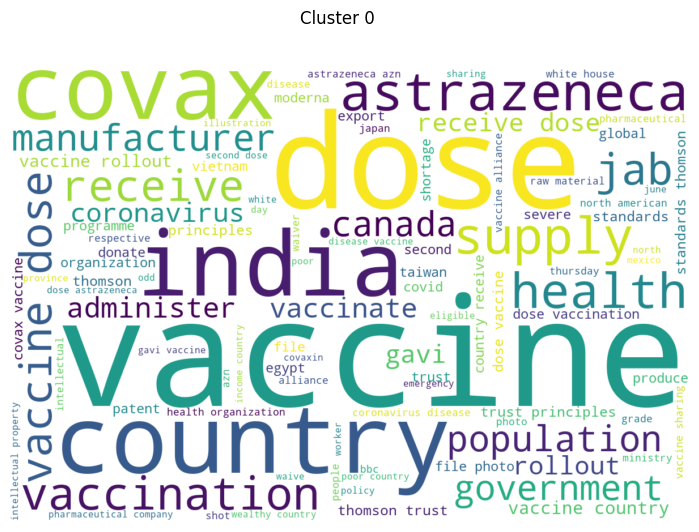

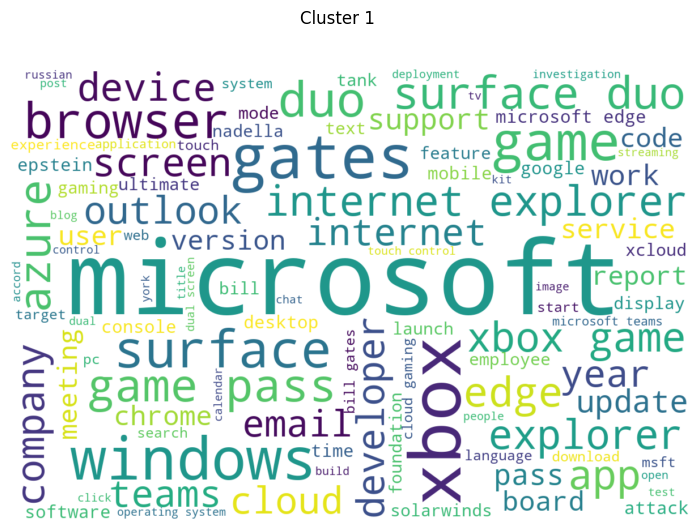

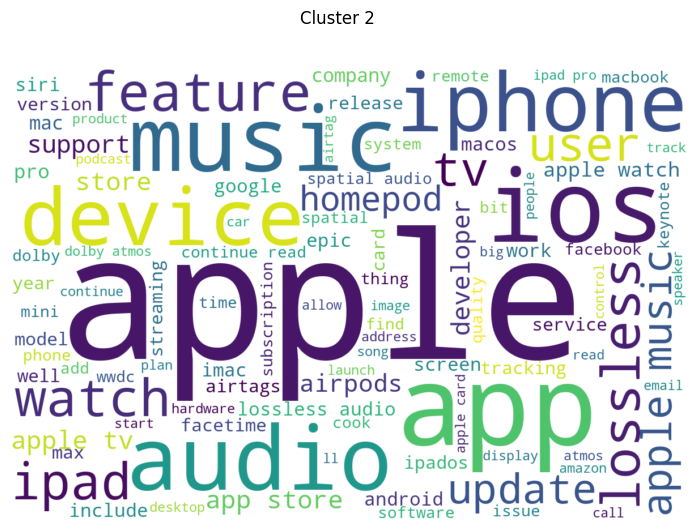

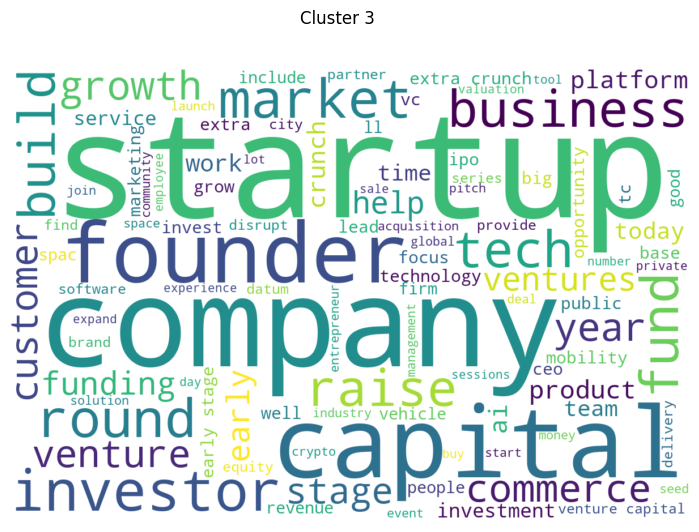

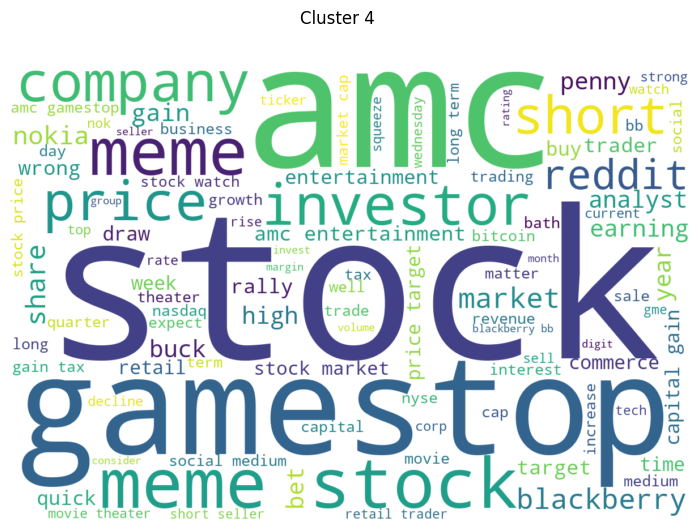

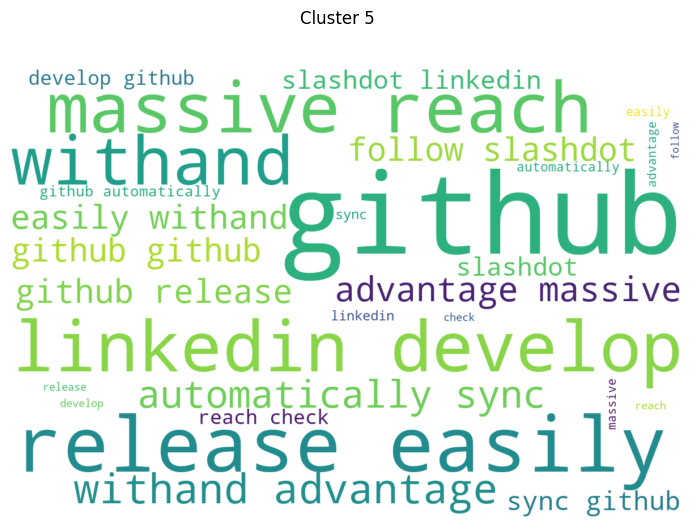

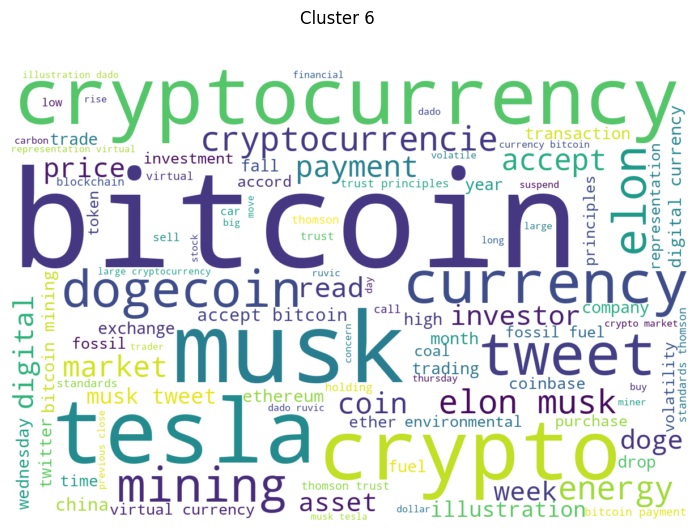

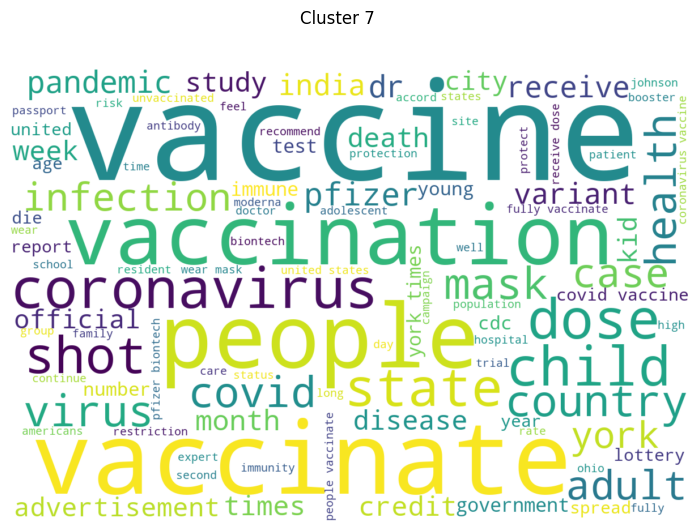

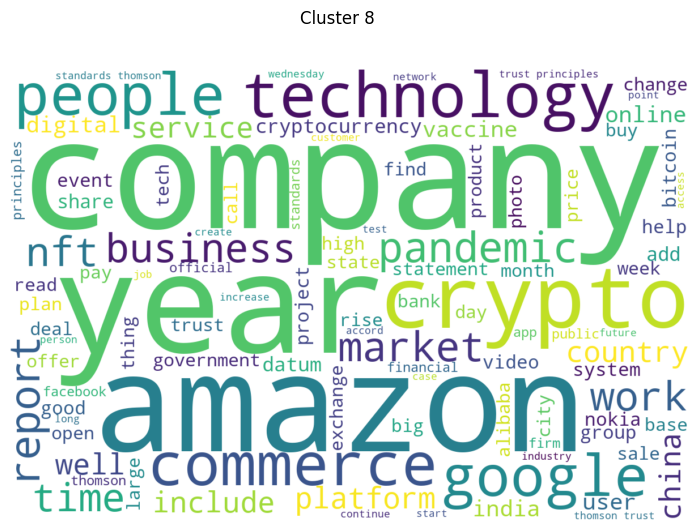

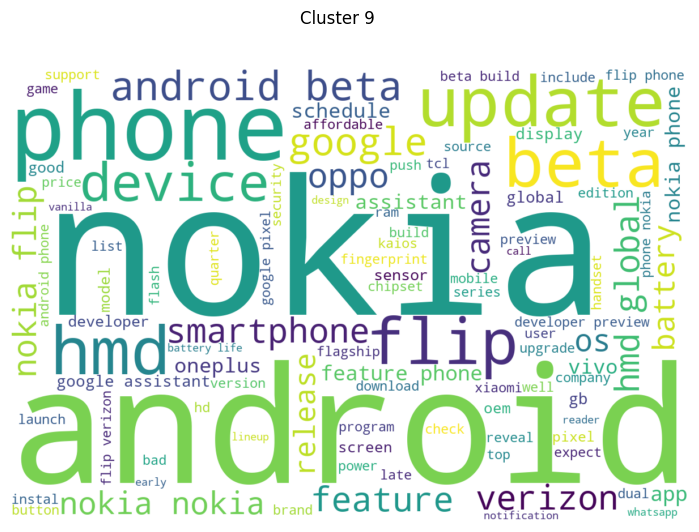

In [52]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def generate_wordclouds(X, in_X_tfidf, k, in_word_positions, file_prefix):

    # Clustering
    in_model = KMeans(n_clusters=k, random_state=289925, n_jobs=-1)
    in_y_pred = in_model.fit_predict(X)
    in_cluster_ids = set(in_y_pred)
    silhouette_avg = silhouette_score(X, in_y_pred)
    print("For n_clusters =", k, "The average silhouette_score is :", silhouette_avg)

    # Number of words with highest tfidf score to display
    top_count = 100

    for in_cluster_id in in_cluster_ids:
        # compute the total tfidf for each term in the cluster
        in_tfidf = in_X_tfidf[in_y_pred == in_cluster_id]
        # numpy.matrix
        tfidf_sum = np.sum(in_tfidf, axis=0)
        # numpy.array of shape (1, X.shape[1])
        tfidf_sum = np.asarray(tfidf_sum).reshape(-1)
        top_indices = tfidf_sum.argsort()[-top_count:]
        term_weights = {in_word_positions[in_idx]: tfidf_sum[in_idx] for in_idx in top_indices}
        wc = WordCloud(width=1200, height=800, background_color="white")
        wordcloud = wc.generate_from_frequencies(term_weights)
        fig, ax = plt.subplots(figsize=(10, 6), dpi=100)
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis("off")
        fig.suptitle(f"Cluster {in_cluster_id}")
        plt.savefig(f"{file_prefix}_cluster_{in_cluster_id}.png")
        plt.show()

    return in_cluster_ids


word_positions = {v: k for k, v in vectorizer.vocabulary_.items()}
_ = generate_wordclouds(bow_svd, bow_matrix, 10, word_positions, "pca")

D:\anaconda3\envs\pracamgr\lib\site-packages\sklearn\cluster\_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


For n_clusters = 10 The average silhouette_score is : 0.3191623968246661


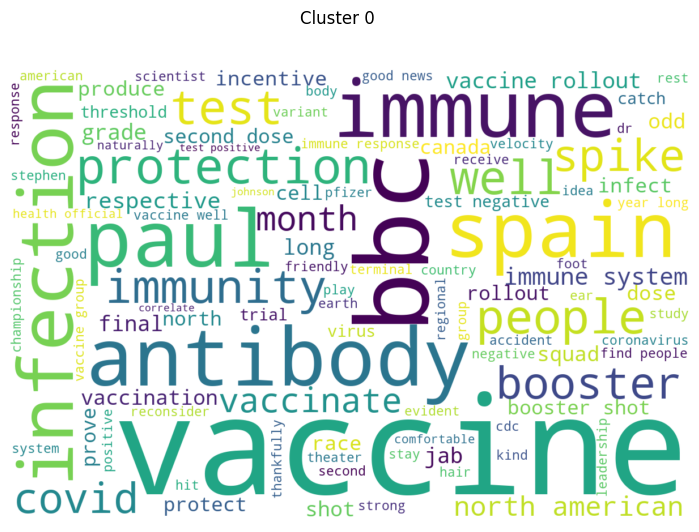

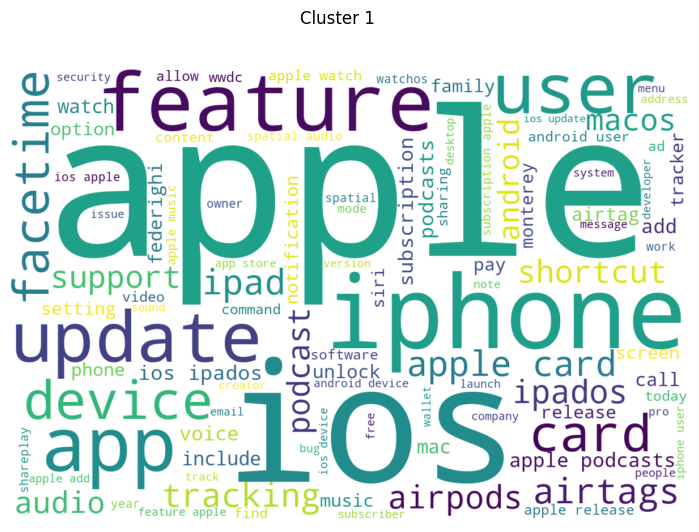

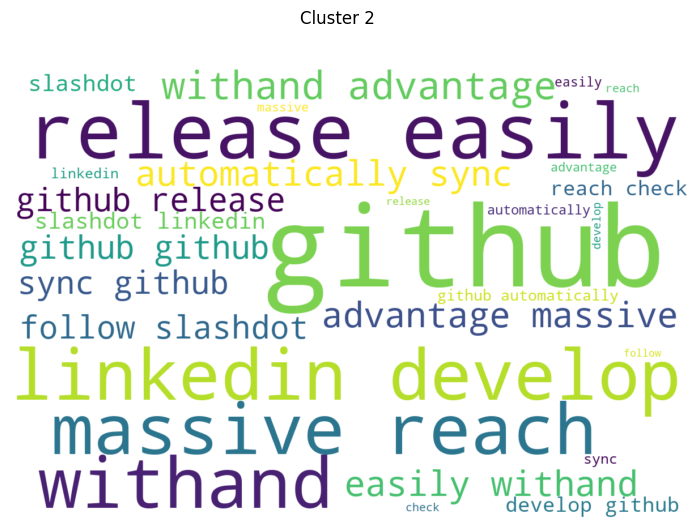

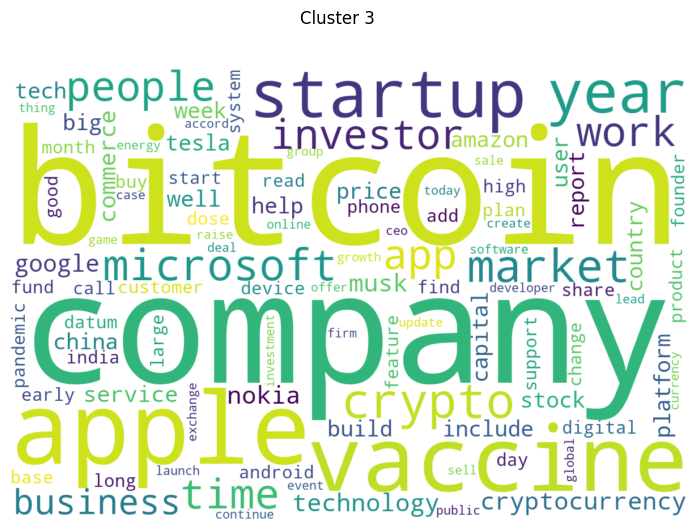

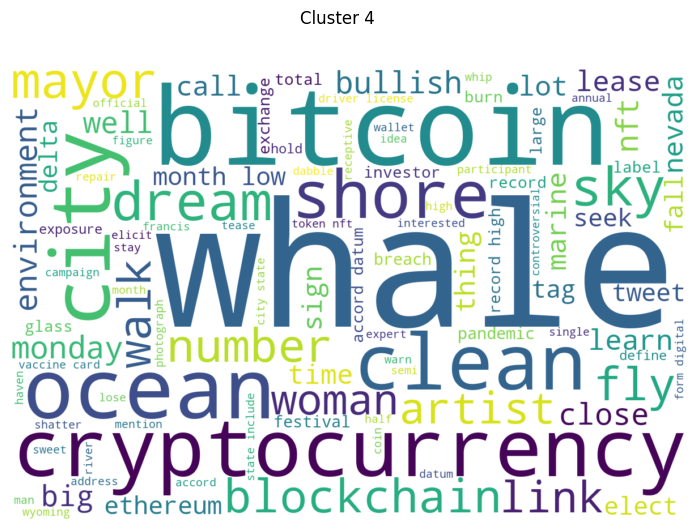

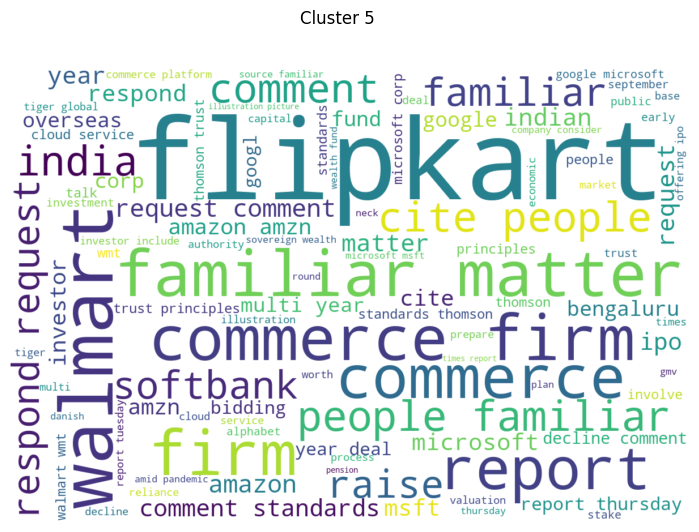

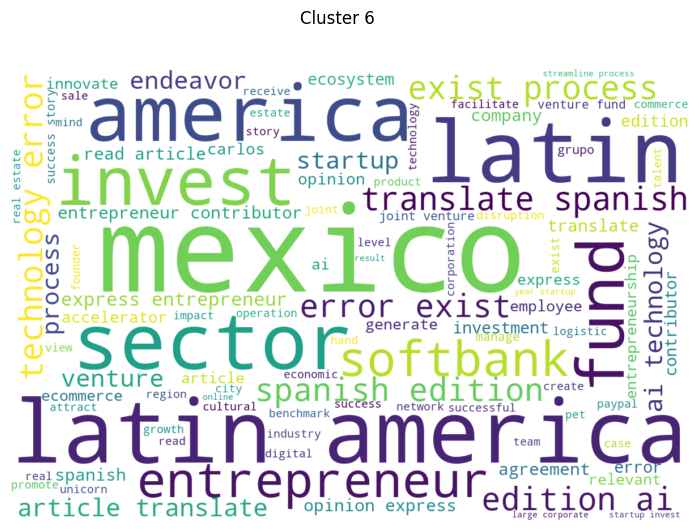

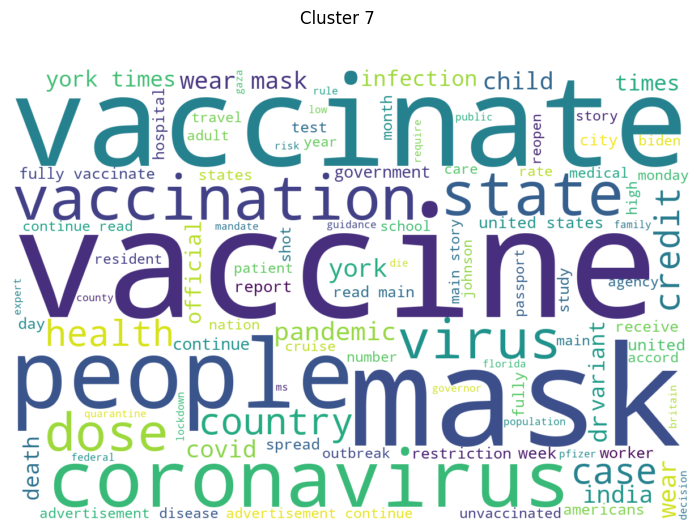

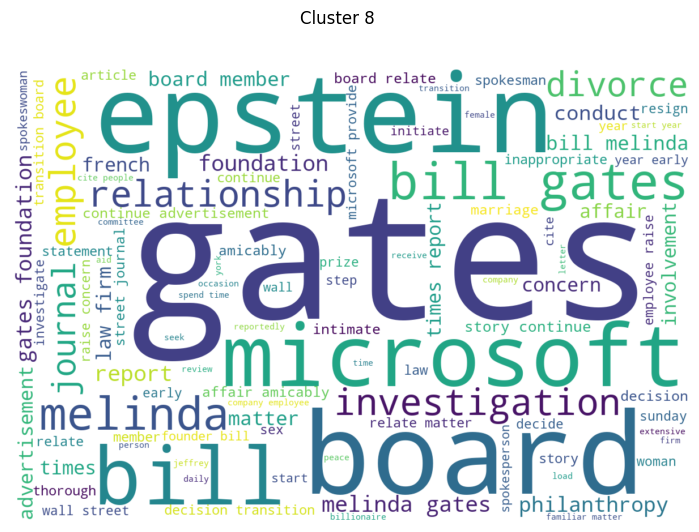

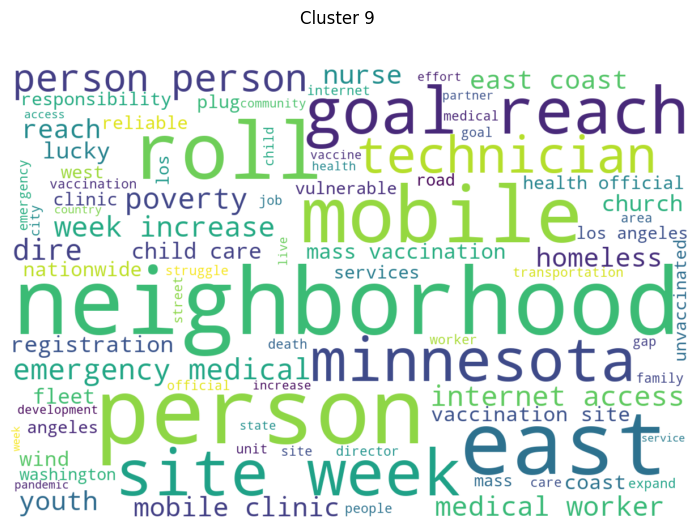

In [53]:
_ = generate_wordclouds(bow_nmf, bow_matrix, 10, word_positions, "nmf")